In [25]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [26]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Reproduce ETV Result for KIC 4909707

- also known as TIC 121119758

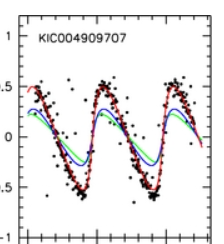

(x, time-span: ~1300 d ; y, O-C in kilosecs)

Source:  `2013ApJ...768...33R` [Triple-star Candidates among the Kepler Binaries](https://ui.adsabs.harvard.edu/abs/2013ApJ...768...33R/abstract) 


In [3]:
# define the plotting parameters

figsize = (8,4)

In [27]:
# import the data

# choose a TIC ID to analyze
ticid = 121119758
kicid = 4909707  # ETV amplitude ~1000sec / 16min
# reference: 2013ApJ
# 
# TODO: consider to include Kepler data

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u



sr = lk.search_lightcurve('KIC{}'.format(kicid))
sr = sr[sr.exptime == 1800 * u.s]  # exclude 1 quarter that has both 30min and 1min cadence data
sr = lke._sort_chronologically(sr)
display(sr)
lcc_kplr = sr.download_all()
lc_kplr = lcc_kplr[:].stitch()
lc_kplr.time.format = "mjd"  # to be consistent with the paper result, also for ease of combining with TESS data
lc_kplr = lc_kplr.truncate(None, 55800)  # longer test with ~1 ETV cycle based on reference plot

# sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
# sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (sector 5)
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
# sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
# display(sr)
# lc_tess = sr.download_all().stitch()
# lc_tess.time.format = "mjd"

search_result = lk.LightCurveCollection([
    lc_kplr,
    # lc_tess,
]).stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,Kepler Quarter 00,2009,Kepler,1800,kplr004909707,0.0,EX
1,Kepler Quarter 01,2009,Kepler,1800,kplr004909707,0.0,EX
2,Kepler Quarter 02,2009,Kepler,1800,kplr004909707,0.0,EX
3,Kepler Quarter 03,2009,Kepler,1800,kplr004909707,0.0,EX
4,Kepler Quarter 04,2010,Kepler,1800,kplr004909707,0.0,EX
5,Kepler Quarter 05,2010,Kepler,1800,kplr004909707,0.0,EX
6,Kepler Quarter 06,2010,Kepler,1800,kplr004909707,0.0,EX
7,Kepler Quarter 07,2010,Kepler,1800,kplr004909707,0.0,EX
8,Kepler Quarter 08,2011,Kepler,1800,kplr004909707,0.0,EX


38055

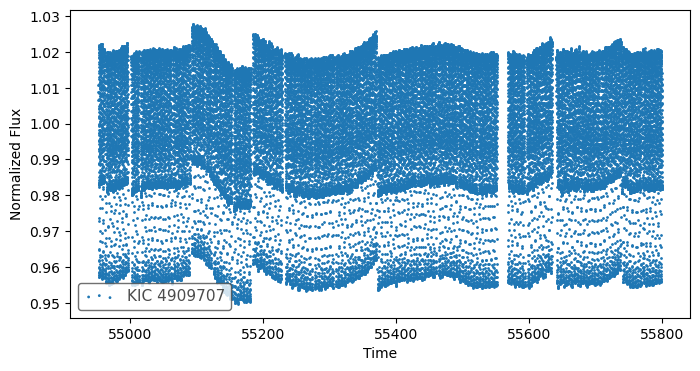

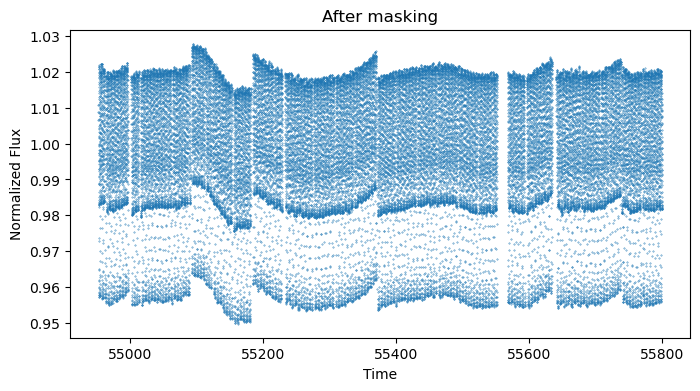

In [5]:
%matplotlib inline
# %matplotlib widget

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)


mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [6]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [7]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

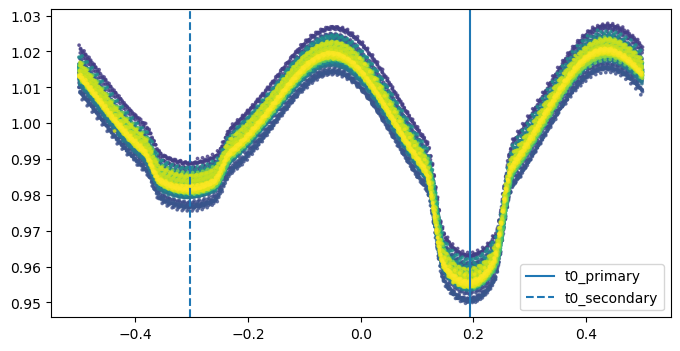

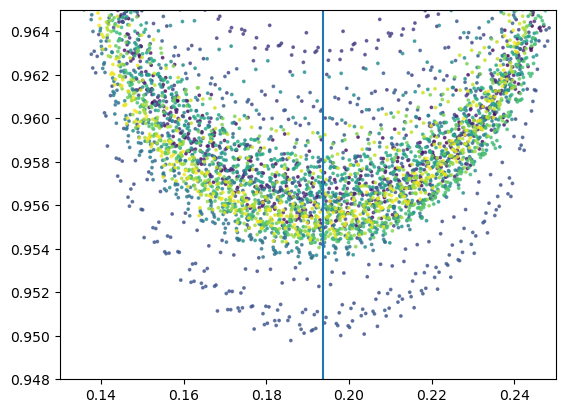

In [28]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# period = 2.3023637  # Kepler EB Period
period = 2.302370  # 2013ApJ Period


t0_primary = 54953.913193 - 0.5  # Kepler EB, the MJD there seems to be off by 0.5
t0_secondary = t0_primary + period * 0.5028


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 0.1440 * period * 24  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 0.2721 * period * 24  

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(0.13, 0.25);
plt.ylim(0.948, 0.965);
plt.show()

### Now that the data is ready we can start 

In [9]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,54953.039488,1.010823,0.000029,0.031414
1,54953.059922,1.008696,0.000029,0.040290
2,54953.080357,1.006551,0.000029,0.049165
3,54953.100791,1.004211,0.000029,0.058041
4,54953.121226,1.001768,0.000029,0.066916
...,...,...,...,...
37992,55799.912109,1.007501,0.000030,-0.142119
37993,55799.932543,1.009144,0.000030,-0.133244
37994,55799.952976,1.010912,0.000030,-0.124369
37995,55799.973409,1.012485,0.000030,-0.115494


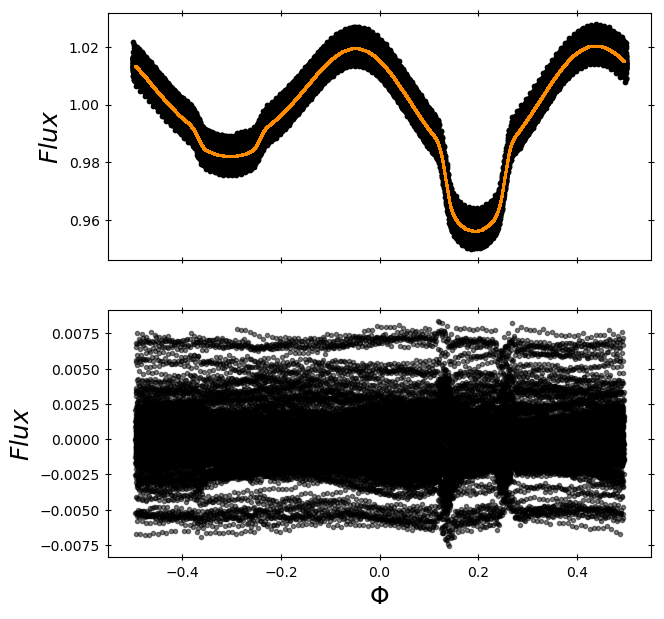

,time,flux,err,phase,flux_sub_binary,binary_model
0,54953.039488,1.010823,0.000029,0.031414,0.002117,1.008706
1,54953.059922,1.008696,0.000029,0.040290,0.002214,1.006482
2,54953.080357,1.006551,0.000029,0.049165,0.002295,1.004256
3,54953.100791,1.004211,0.000029,0.058041,0.002205,1.002007
4,54953.121226,1.001768,0.000029,0.066916,0.002129,0.999639
...,...,...,...,...,...,...
37992,55799.912109,1.007501,0.000030,-0.142119,-0.000025,1.007526
37993,55799.932543,1.009144,0.000030,-0.133244,-0.000202,1.009345
37994,55799.952976,1.010912,0.000030,-0.124369,-0.000220,1.011132
37995,55799.973409,1.012485,0.000030,-0.115494,-0.000180,1.012666


In [10]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 37617 901
reached the end
10 36350 901
reached the end
10 36083 901
reached the end
10 35943 901
reached the end
10 35828 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,54953.039488,1.010823,0.000029,0.031414,0.002117,1.008706,1.008651
1,54953.059922,1.008696,0.000029,0.040290,0.002214,1.006482,1.006528
2,54953.080357,1.006551,0.000029,0.049165,0.002295,1.004256,1.004387
3,54953.100791,1.004211,0.000029,0.058041,0.002205,1.002007,1.002052
4,54953.121226,1.001768,0.000029,0.066916,0.002129,0.999639,0.999612
...,...,...,...,...,...,...,...
37992,55799.912109,1.007501,0.000030,-0.142119,-0.000025,1.007526,1.007683
37993,55799.932543,1.009144,0.000030,-0.133244,-0.000202,1.009345,1.009324
37994,55799.952976,1.010912,0.000030,-0.124369,-0.000220,1.011132,1.011091
37995,55799.973409,1.012485,0.000030,-0.115494,-0.000180,1.012666,1.012663


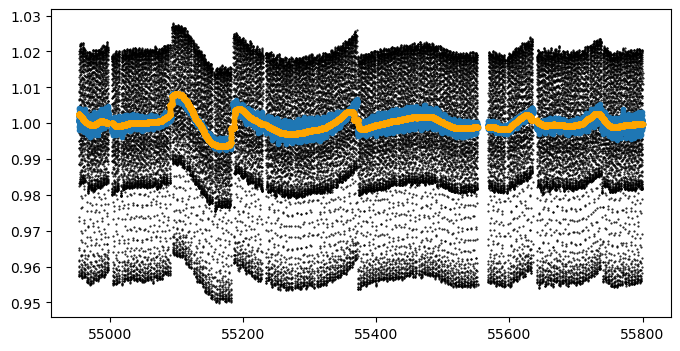

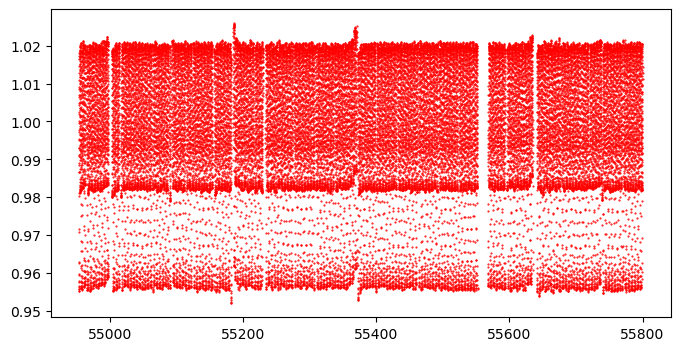

In [11]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

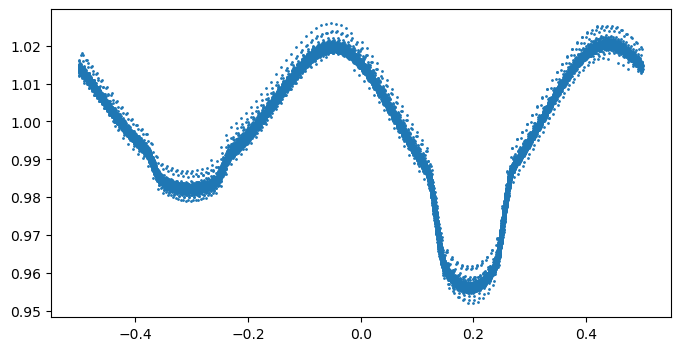

In [12]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   54953.413193 0.19372776747547837
window_width_p (phase): 0.07343999999999999
Secondary: 54954.570824636 -0.3034722325242664
window_width_s (phase): 0.0802695


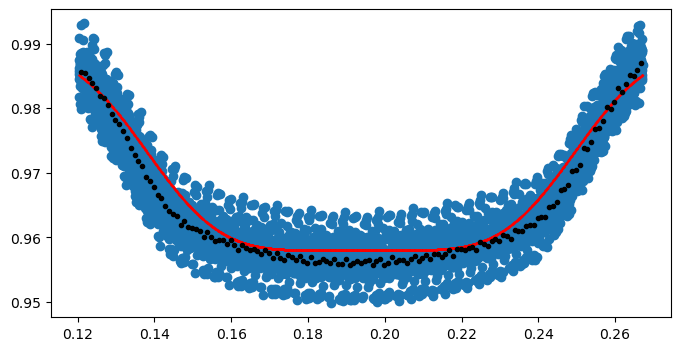

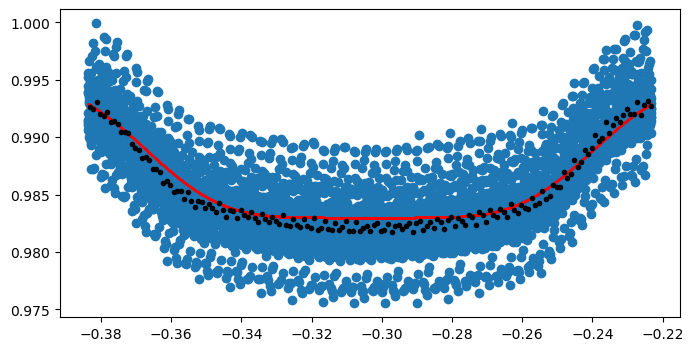

In [13]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.51 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 0.295 * duration_hr_secondary / 24 / period
    # window_width_s = window_width_p
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [0.989, -0.031, midpoint_p, 0.035, 3]
start_vals_s = [0.995, -0.012, midpoint_s, 0.04, 3]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

100%|██████████████████████████████████████████████████████████| 1000/1000 [03:05<00:00,  5.39it/s]


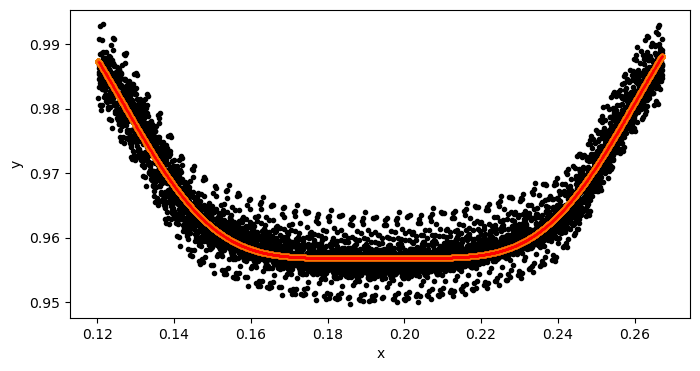

100%|██████████████████████████████████████████████████████████| 1000/1000 [03:14<00:00,  5.13it/s]


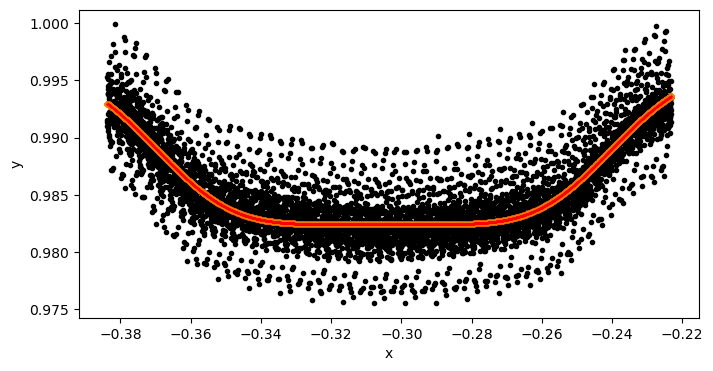

In [14]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [15]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # # initial fit params from Kepler data (<MJD 55300) + 2013Apj Period
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0067056199183277, -0.04968806376987012, 0.1932242174827597, 0.04302157128042646, 2.749792096496858
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9959214608053015, -0.013597789783198196, -0.30513366658463253, 0.040778592196784785, 3.07492557755622

    # initial fit params from Kepler data (<MJD 55800) + 2013Apj Period
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.006027094542627, -0.04918382258148684, 0.1932828485615261, 0.042863943156954576, 2.7485029533481917
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9958208880831946, -0.013381598530201908, -0.30494860531805923, 0.04014324677947079, 3.1984068892498416

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
        etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [16]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.006027094542627, -0.04918382258148684, 0.1932828485615261, 0.042863943156954576, 2.7485029533481917
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9958208880831946, -0.013381598530201908, -0.30494860531805923, 0.04014324677947079, 3.1984068892498416


367

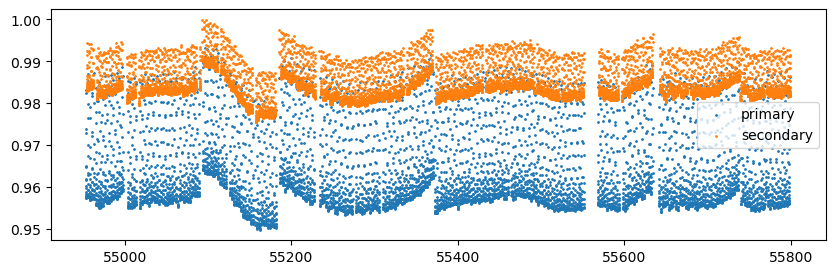

In [18]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

54953.413193 2.30237 54953.413193


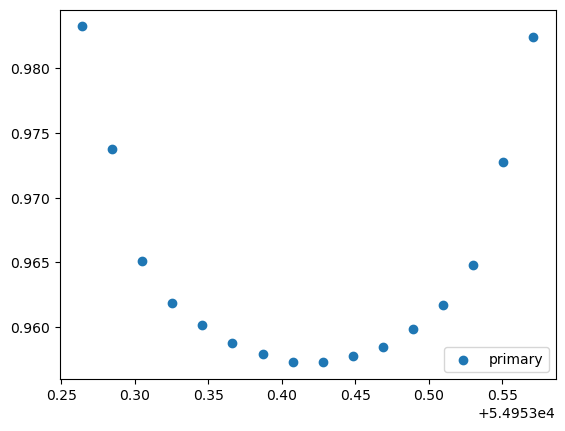

54953.413193 2.30237 54955.715563


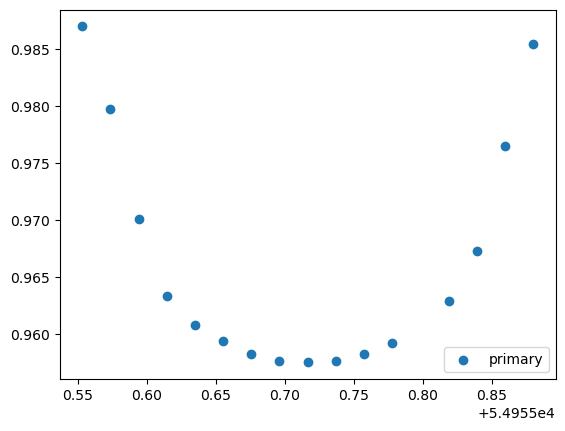

54953.413193 2.30237 54958.017933


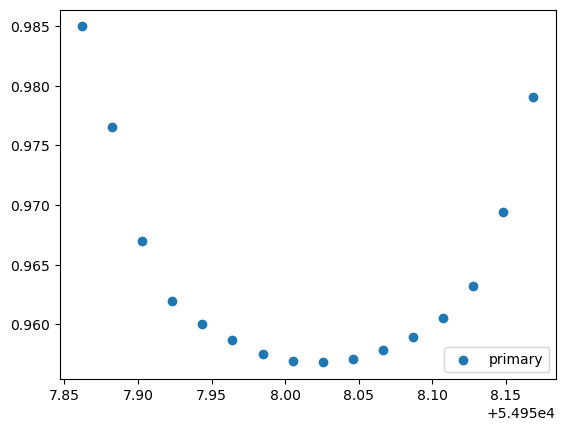

54954.570824636 2.30237 54954.570824636


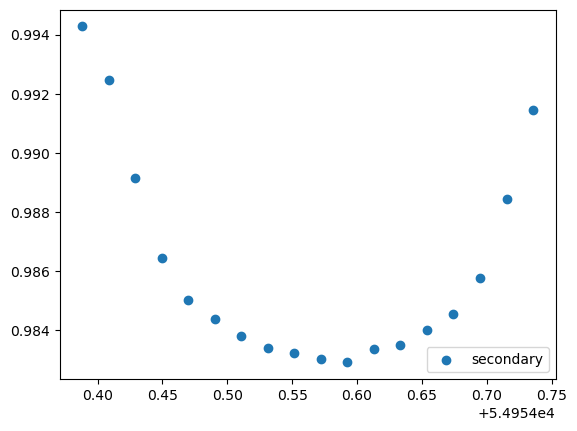

54954.570824636 2.30237 54956.873194636


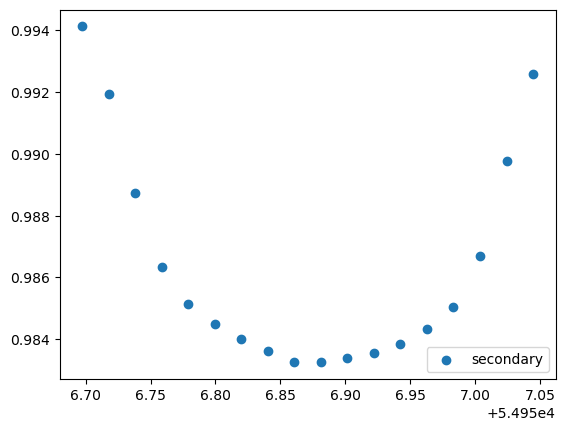

54954.570824636 2.30237 54959.175564636


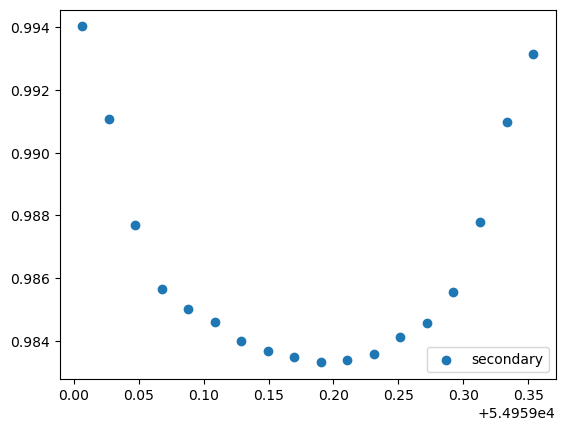

In [19]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
Number 4 has already been completed -- skip
Number 5 has already been completed -- skip
Number 6 has already been completed -- skip
Number 7 has already been completed -- skip
Number 8 has already been completed -- skip
Number 9 has already been completed -- skip
Number 10 has already been completed -- skip
Number 11 has already been completed -- skip
Number 12 has already been completed -- skip
Number 13 has already been completed -- skip
Number 14 has already been completed -- skip
Number 15 has already been completed -- skip
Number 16 has already been completed -- skip
Number 17 has already been completed -- skip
Number 18 has already been completed -- skip
Number 19 has al

100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.93it/s]


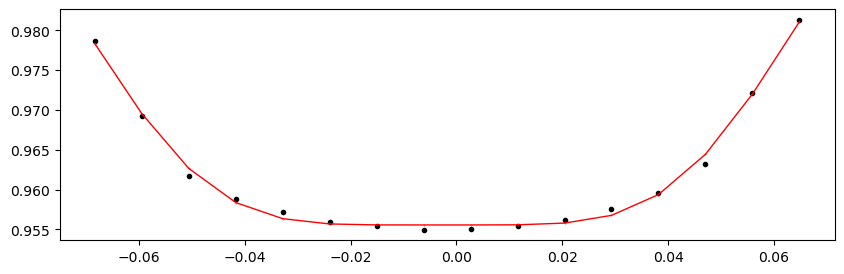

55301.071063 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.08it/s]


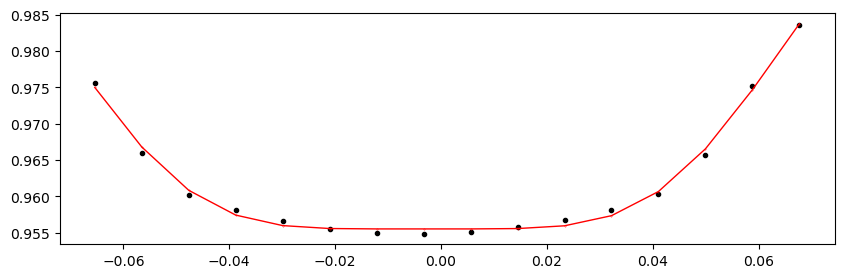

55303.373433 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.60it/s]


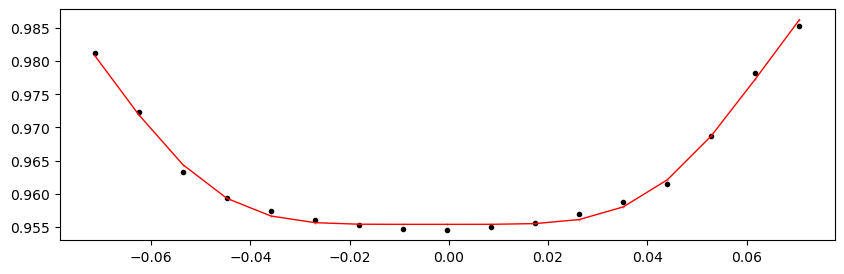

55305.675803 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.50it/s]


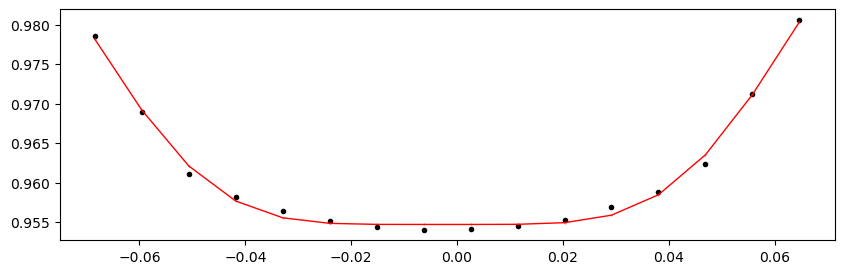

55310.280543 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.76it/s]


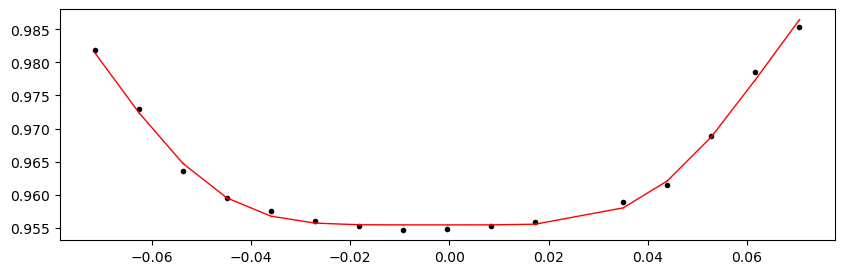

55312.582913 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.97it/s]


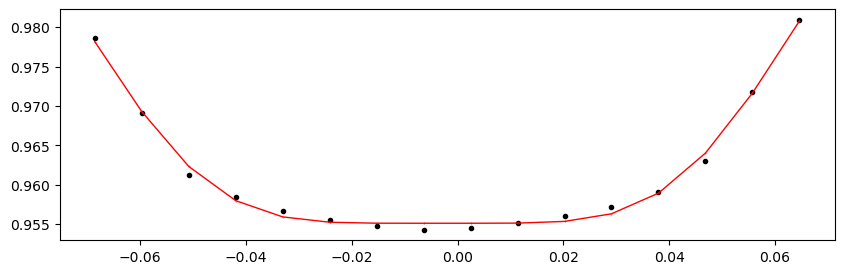

55314.885283 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.62it/s]


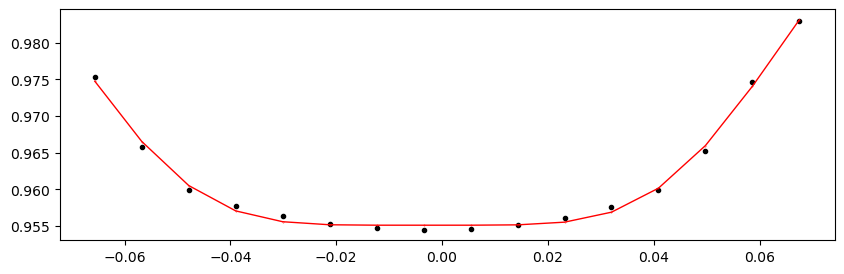

55317.187653 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.21it/s]


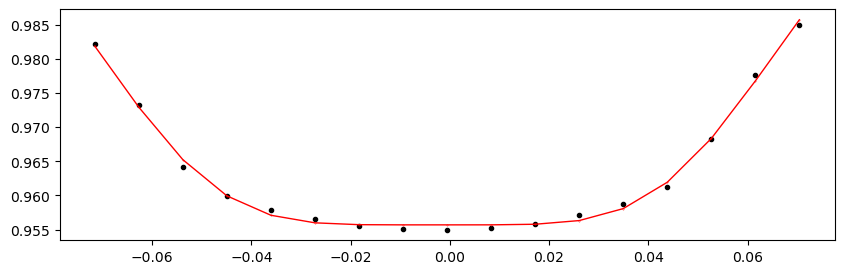

55319.490023 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.47it/s]


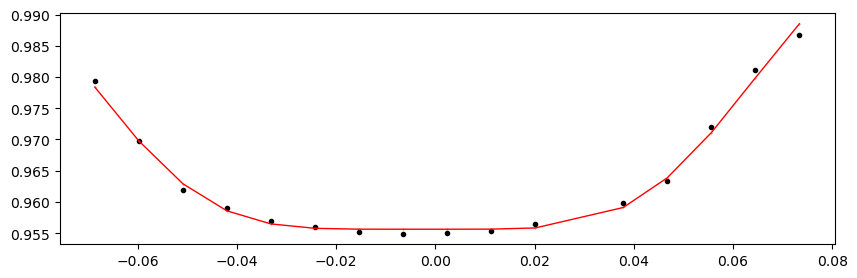

55321.792393 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.95it/s]


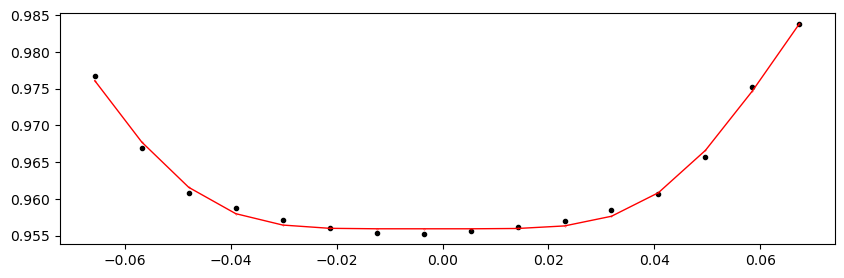

55324.094763 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.15it/s]


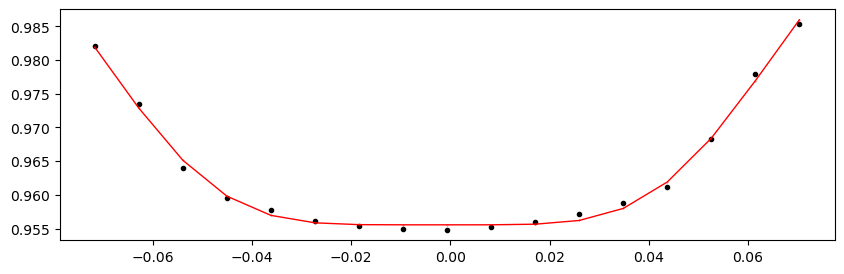

55326.397133 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.16it/s]


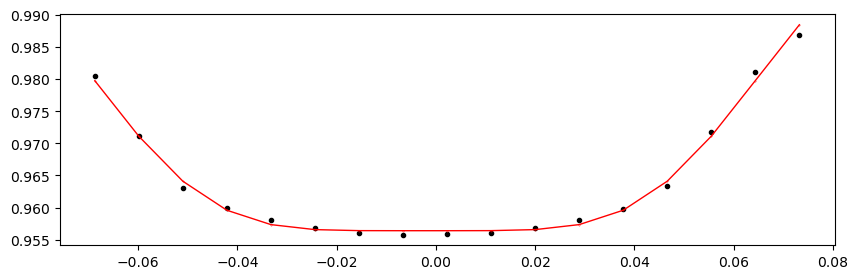

55328.699503 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.41it/s]


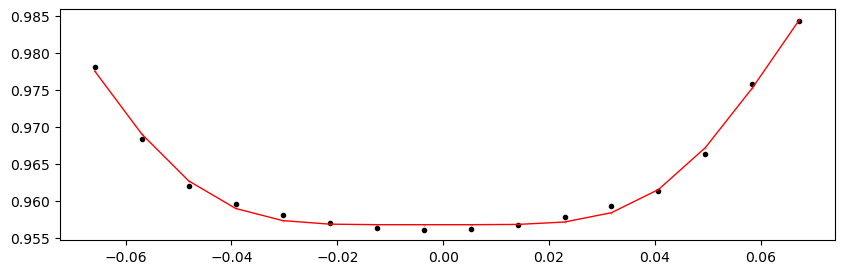

55331.001873 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.98it/s]


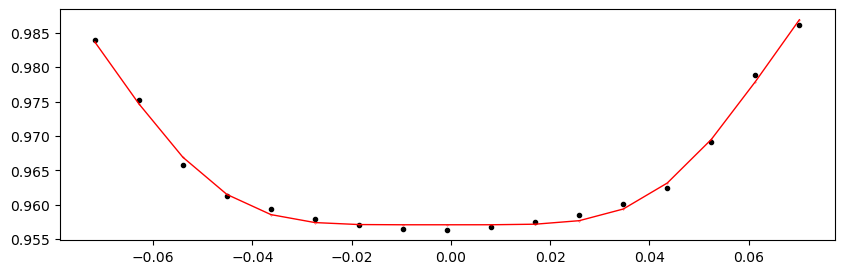

55333.304243 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.75it/s]


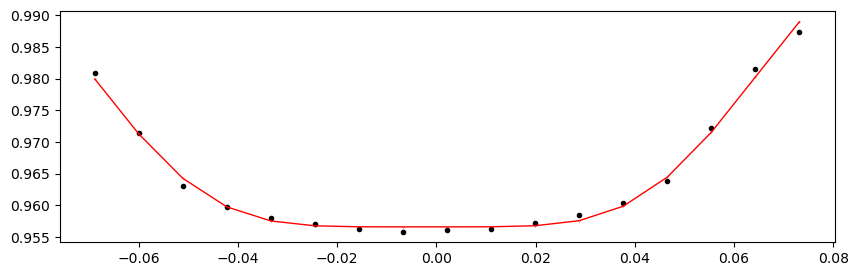

55335.606613 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.20it/s]


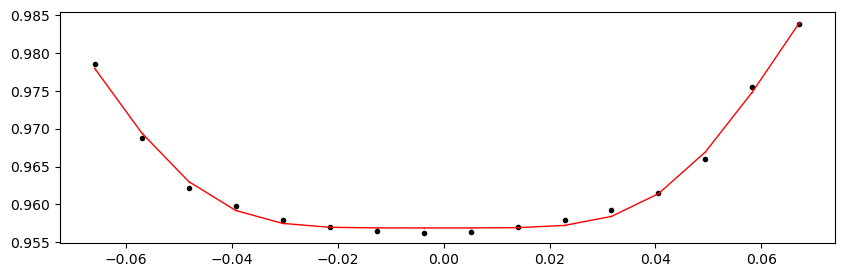

55337.908983 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.61it/s]


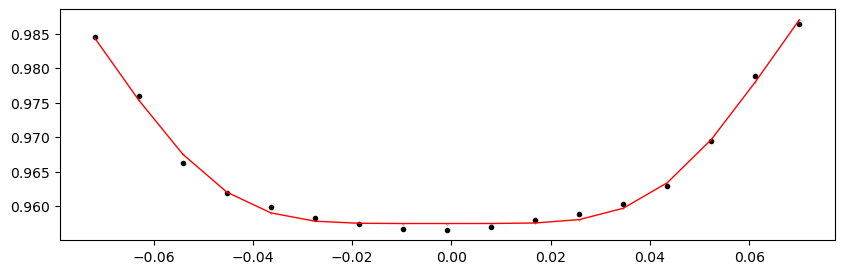

55340.211353 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.49it/s]


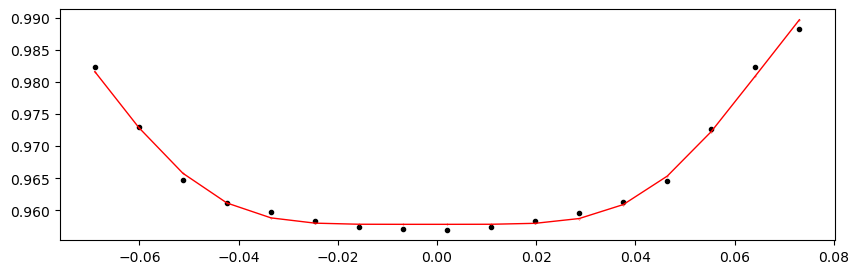

55342.513723000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.78it/s]


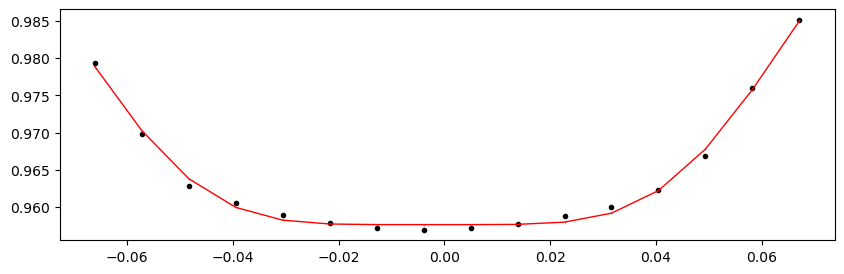

55344.816093 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.53it/s]


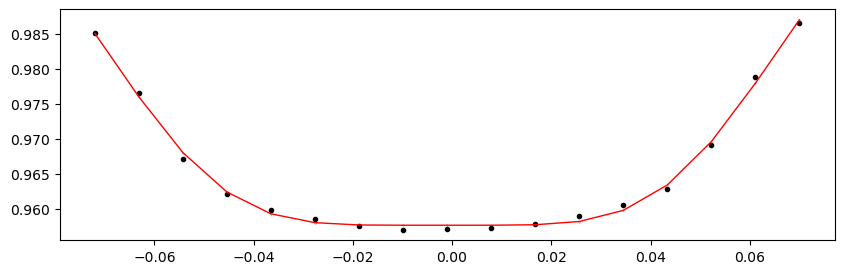

55347.118463 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.89it/s]


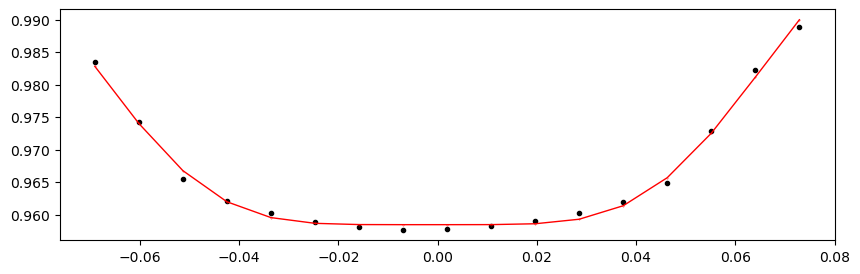

55349.420833000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.97it/s]


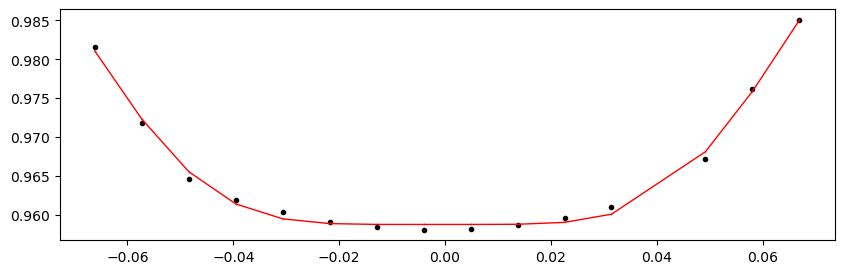

55351.723203 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.12it/s]


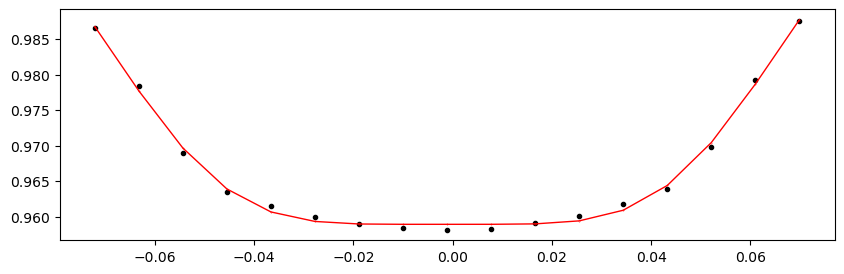

55354.025573 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.07it/s]


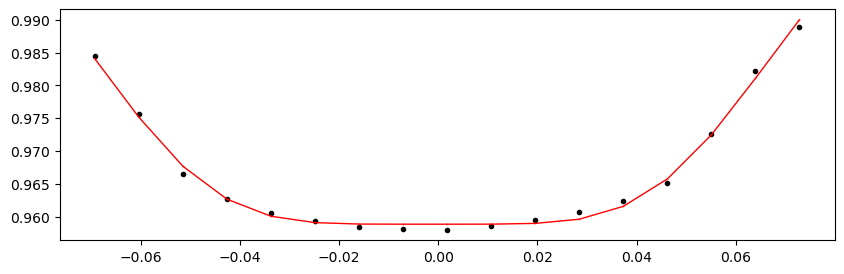

55356.327943000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.44it/s]


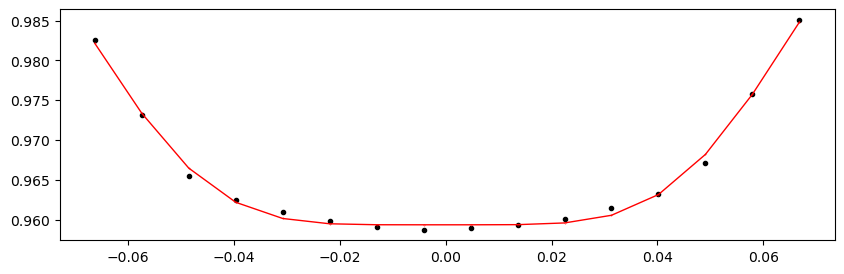

55358.630313 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.54it/s]


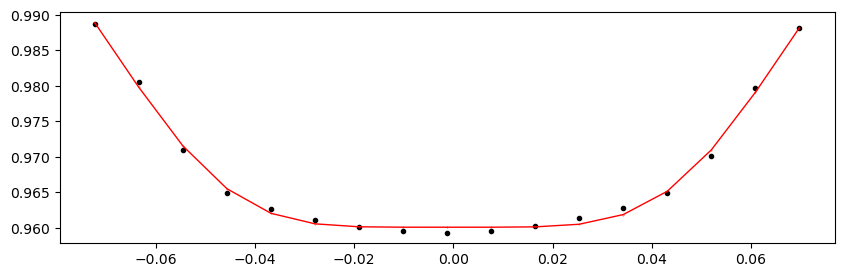

55360.932683 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.06it/s]


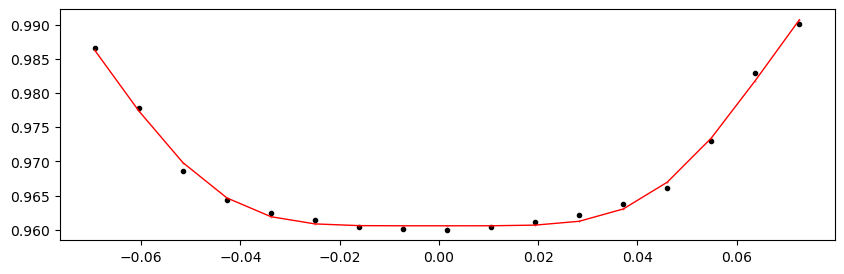

55363.235053 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.30it/s]


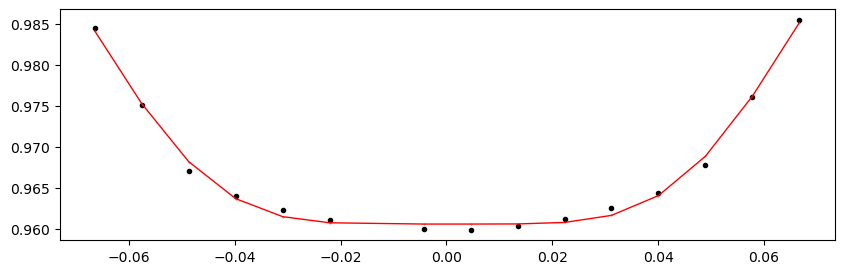

55365.537423 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.72it/s]


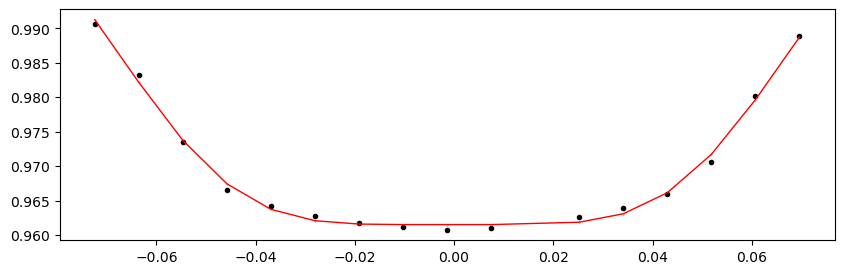

55367.839793 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.86it/s]


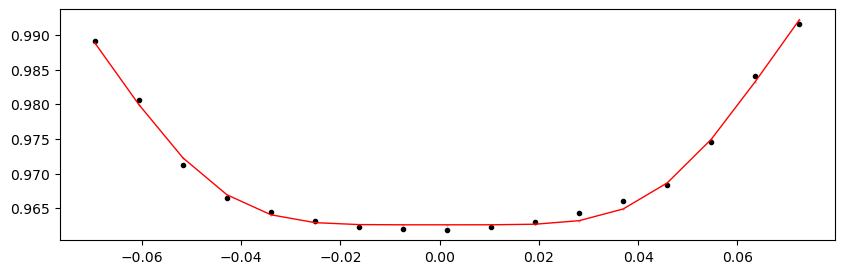

55370.142163 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.69it/s]


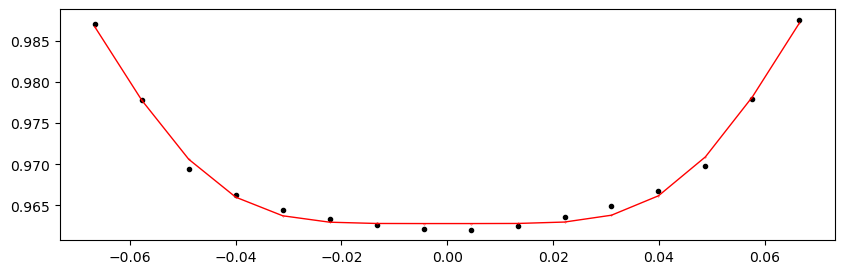

55372.444533 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.83it/s]


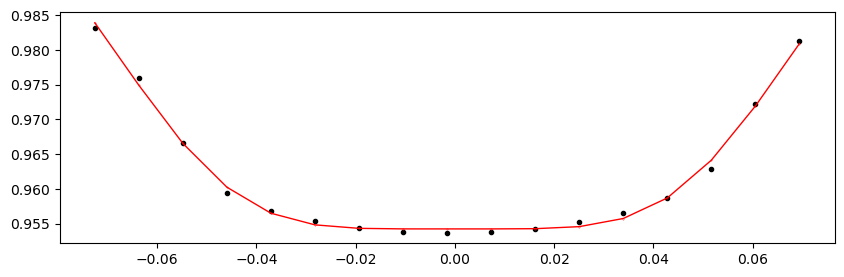

55374.746903 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.69it/s]


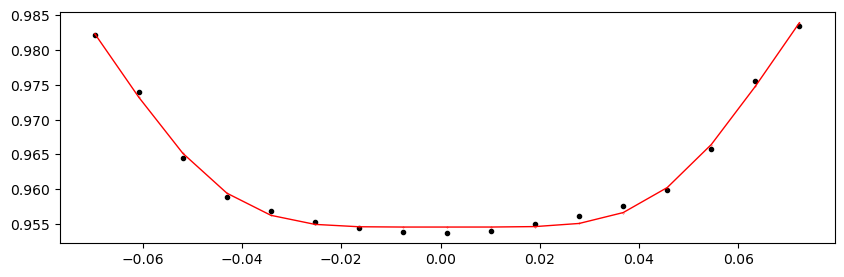

55377.049273 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.17it/s]


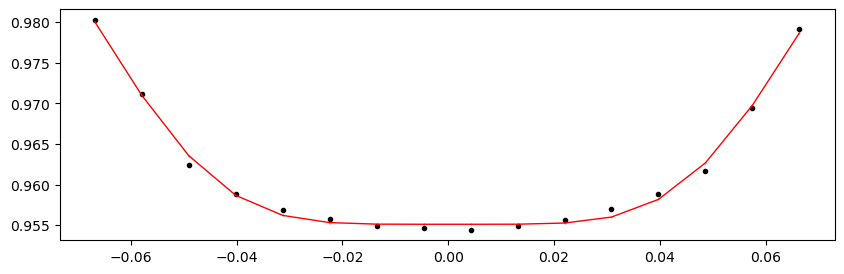

55379.351643 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.89it/s]


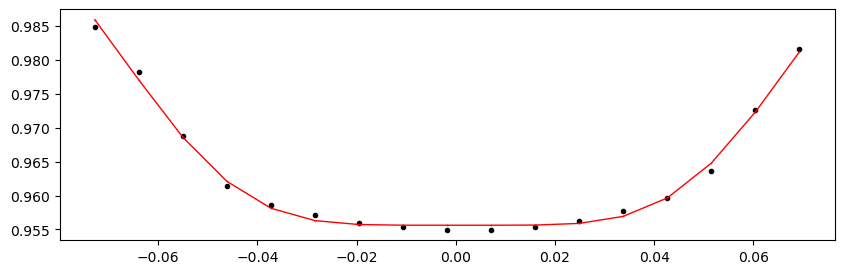

55381.654013 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.03it/s]


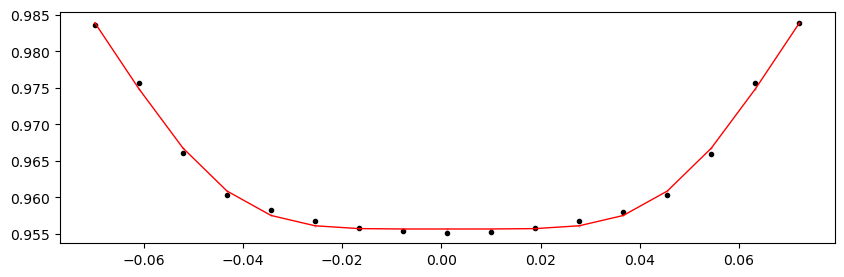

55383.956383 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.96it/s]


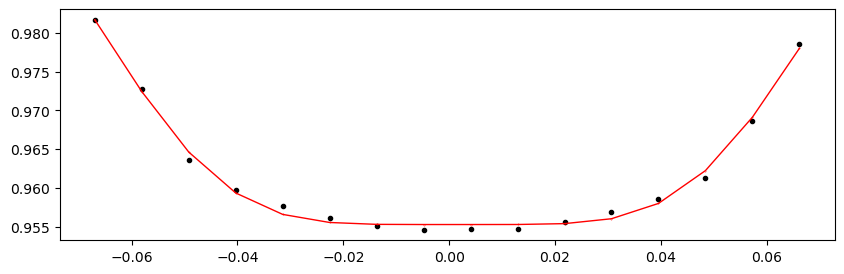

55386.258753 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.70it/s]


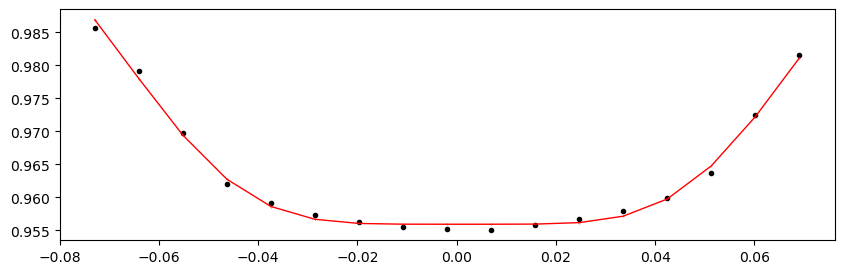

55388.561123 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.66it/s]


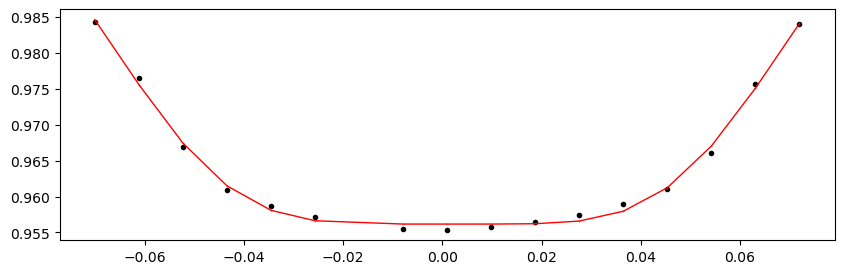

55390.863493 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.32it/s]


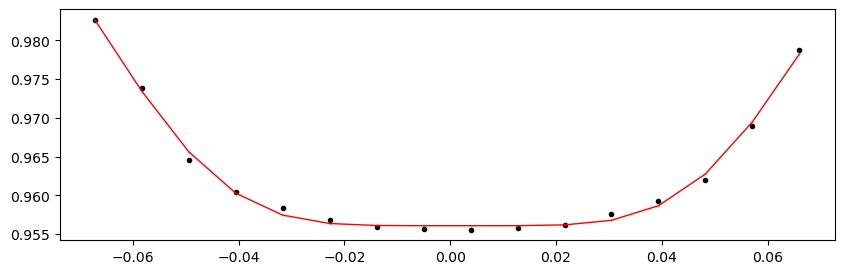

55393.165863 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.59it/s]


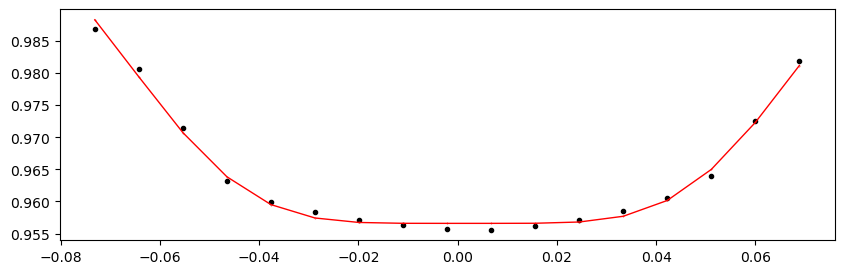

55395.468233 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.98it/s]


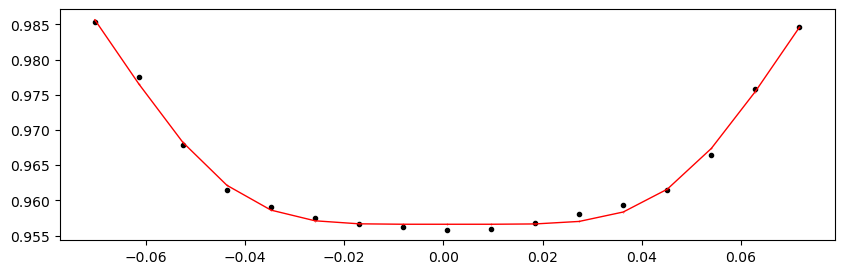

55397.770603 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.77it/s]


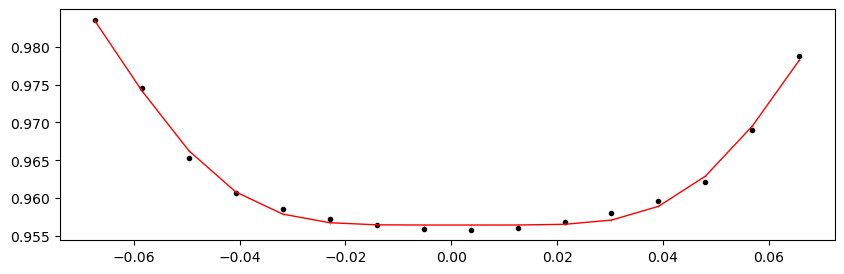

55400.072973 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.34it/s]


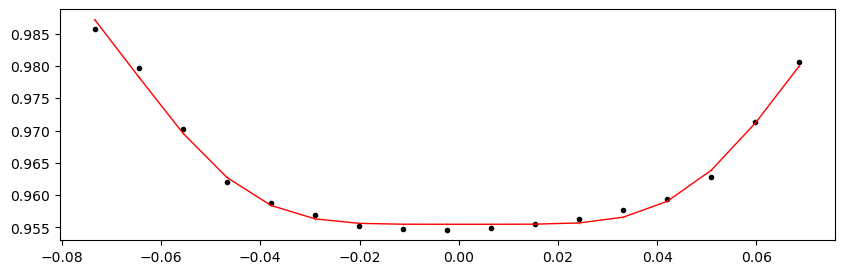

55402.375343 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.09it/s]


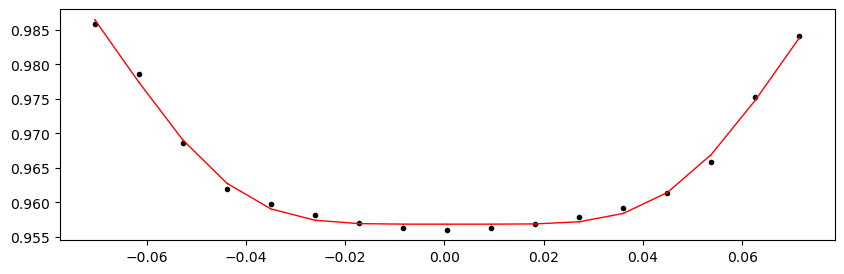

55404.677713 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.24it/s]


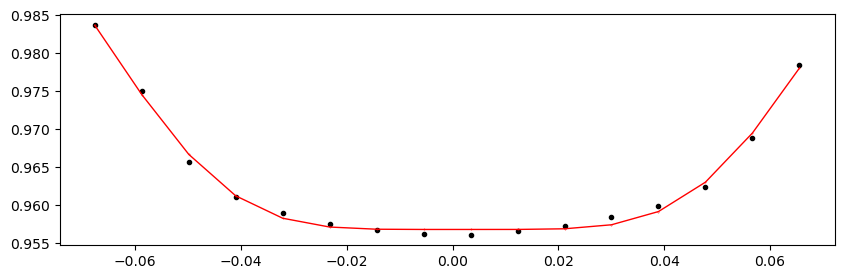

55406.980083 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.03it/s]


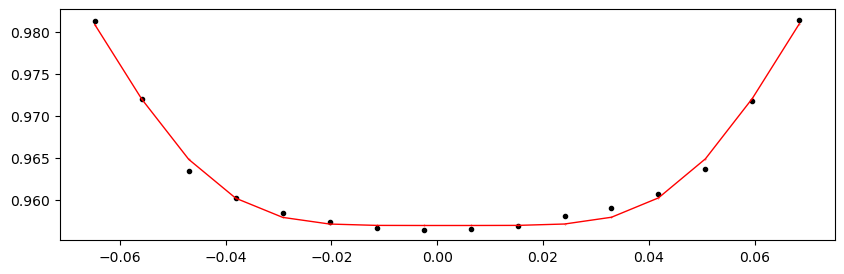

55409.282453 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.46it/s]


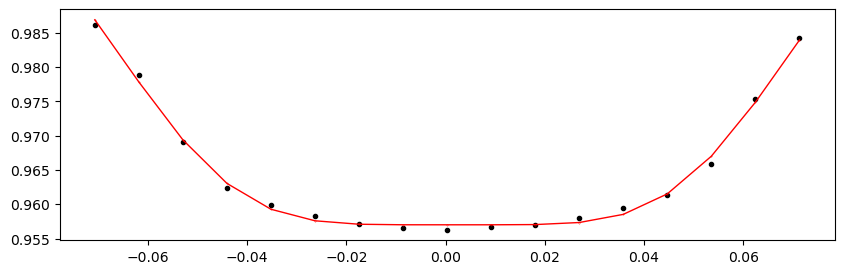

55411.584823 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.19it/s]


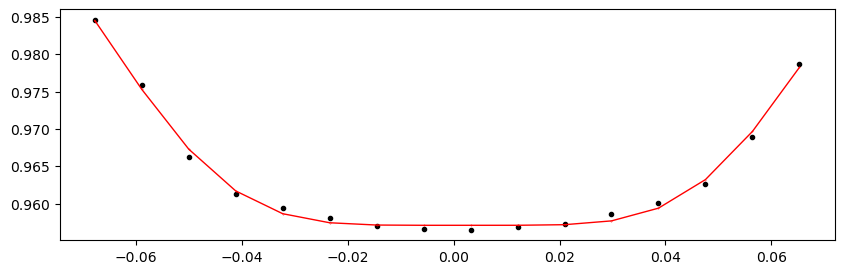

55413.887193 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.13it/s]


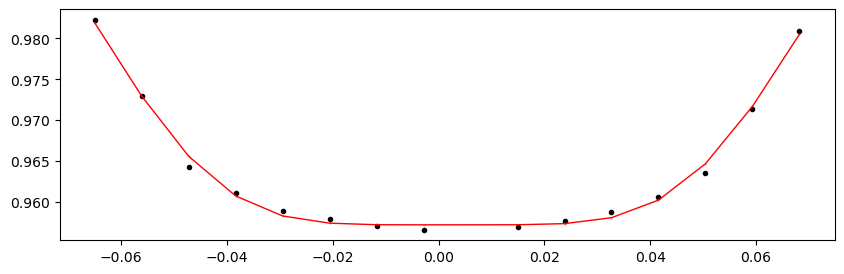

55416.189563 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.40it/s]


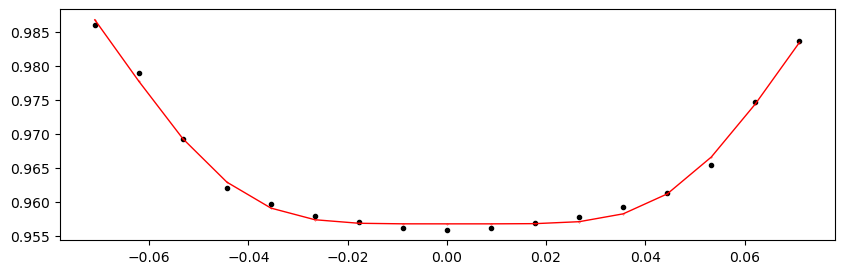

55418.491933 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.34it/s]


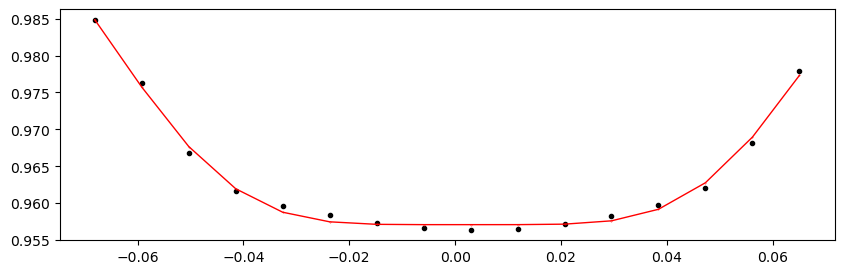

55420.794303 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.68it/s]


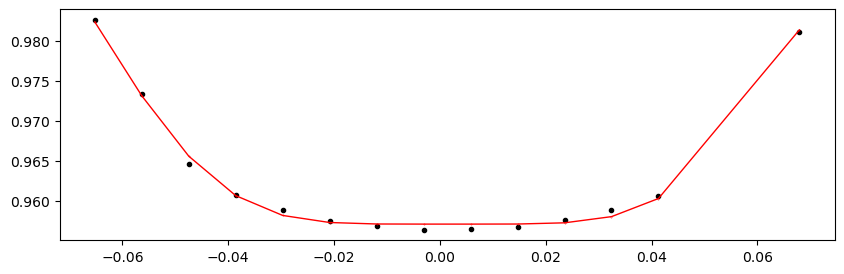

55423.096673 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.92it/s]


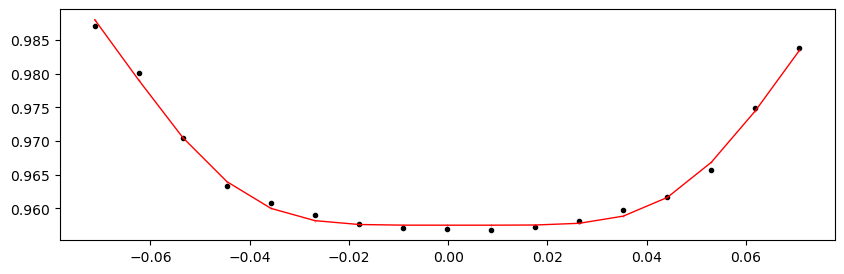

55425.399043 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.80it/s]


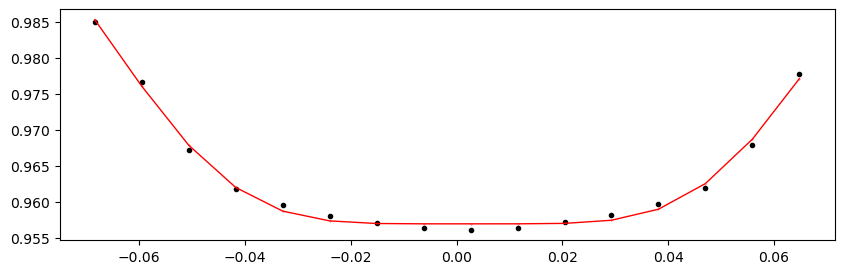

55427.701413 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.49it/s]


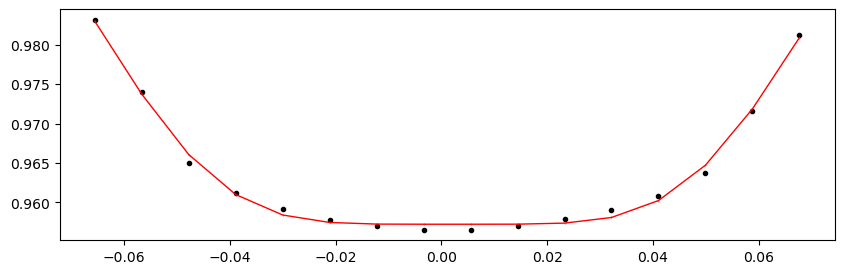

55430.003783 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.00it/s]


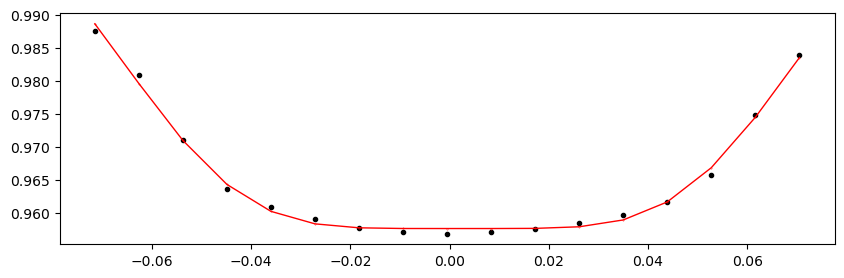

55432.306153 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.75it/s]


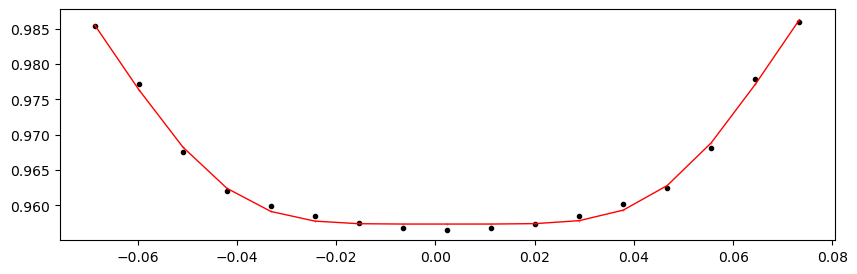

55434.608523 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.42it/s]


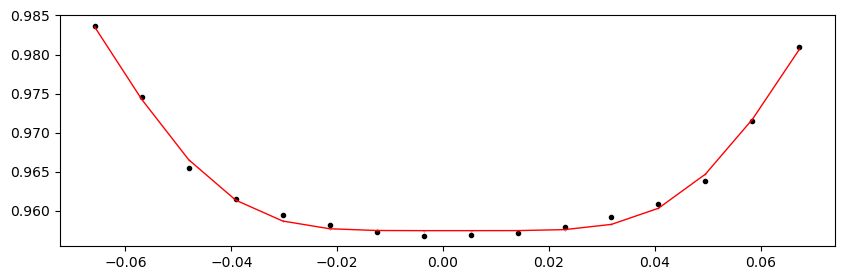

55436.910893 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.37it/s]


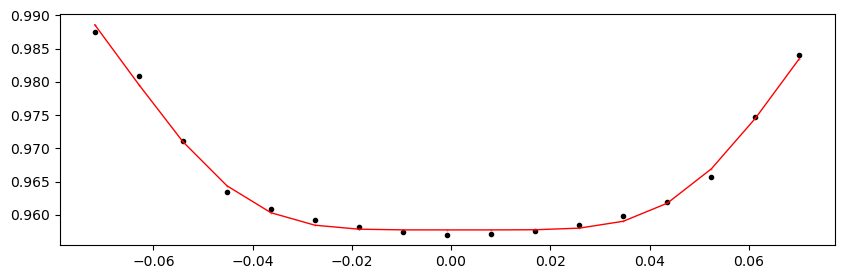

55439.213263 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.88it/s]


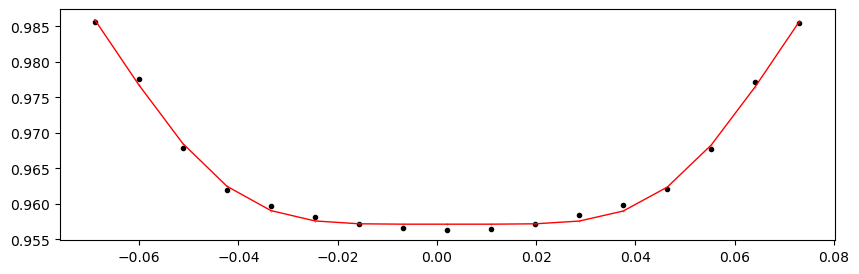

55441.515633 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.68it/s]


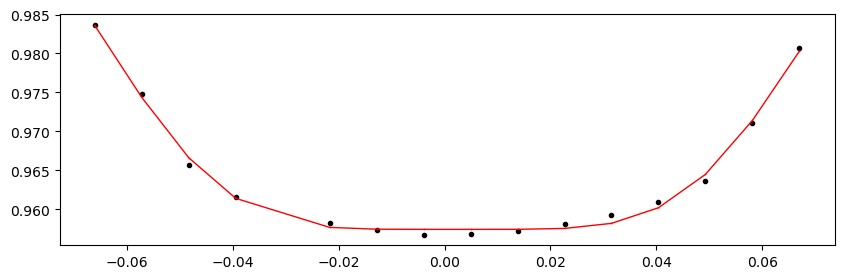

55443.818003 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.25it/s]


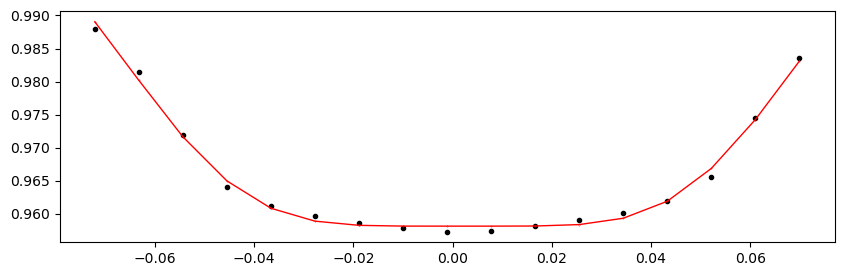

55446.120373 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.15it/s]


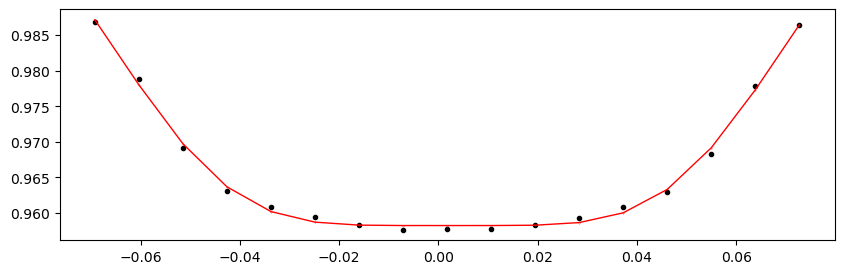

55448.422743 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.12it/s]


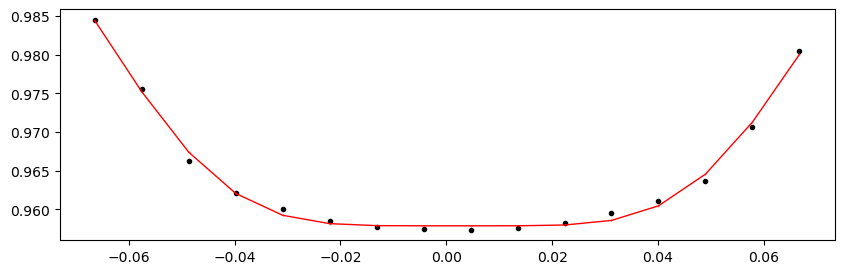

55450.725113 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.41it/s]


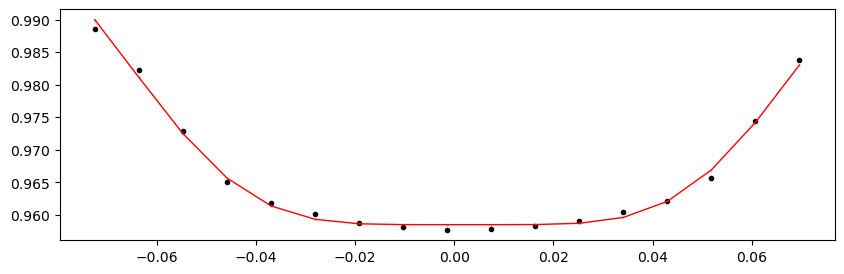

55453.027483 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.72it/s]


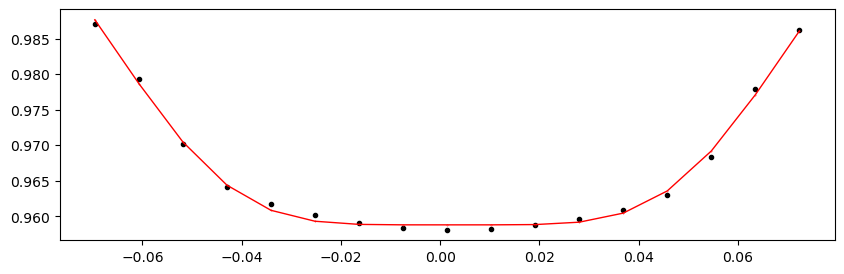

55455.329853 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.26it/s]


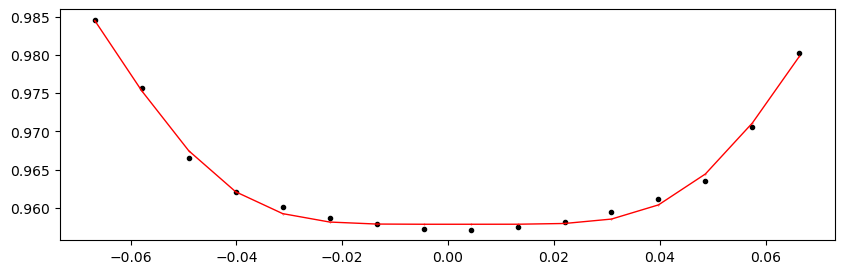

55457.632223 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.61it/s]


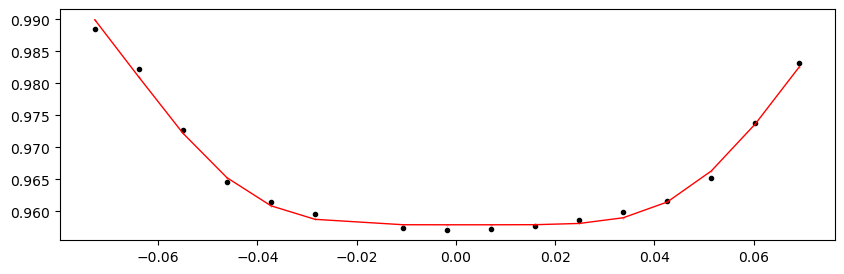

55459.934593 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.97it/s]


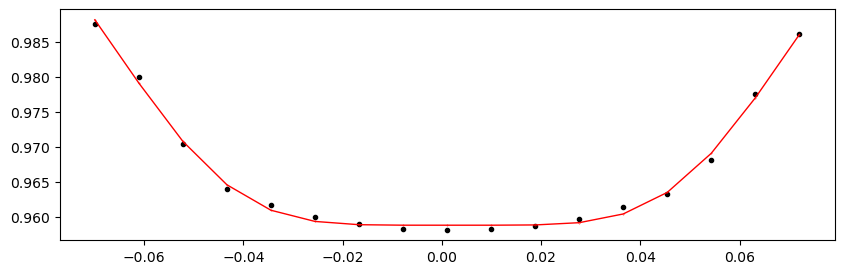

55464.539333 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.63it/s]


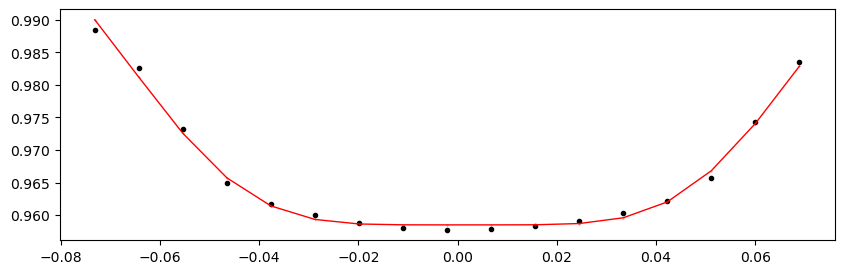

55466.841703 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.29it/s]


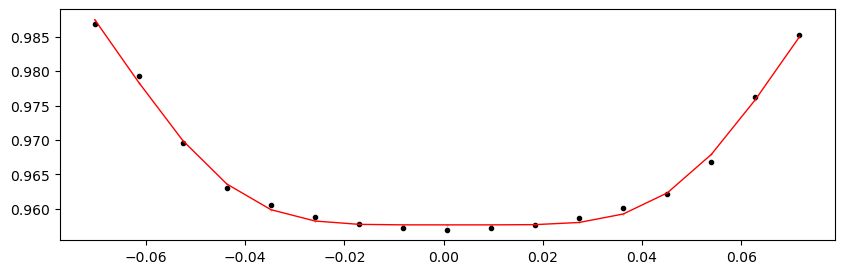

55469.144073 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.41it/s]


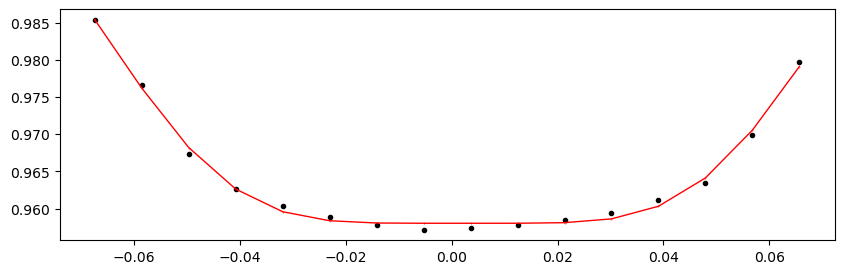

55471.446443 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.30it/s]


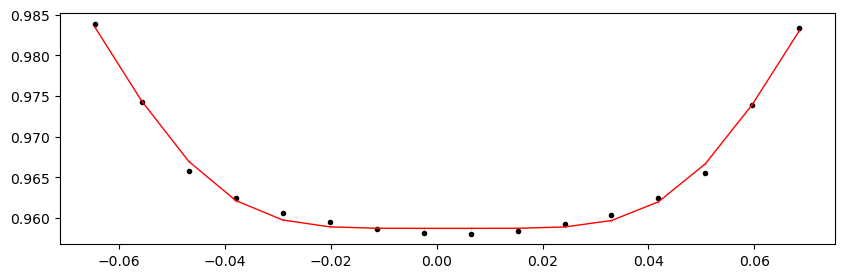

55473.748813 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.45it/s]


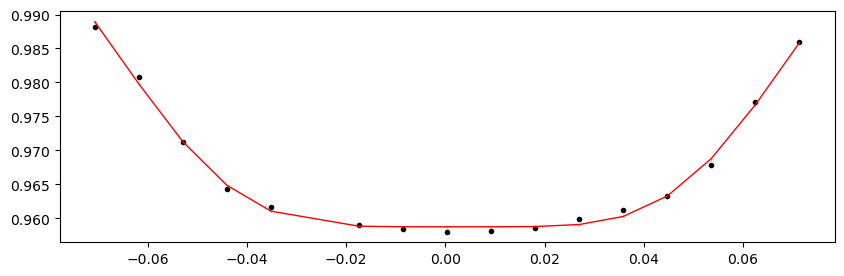

55476.051183 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.85it/s]


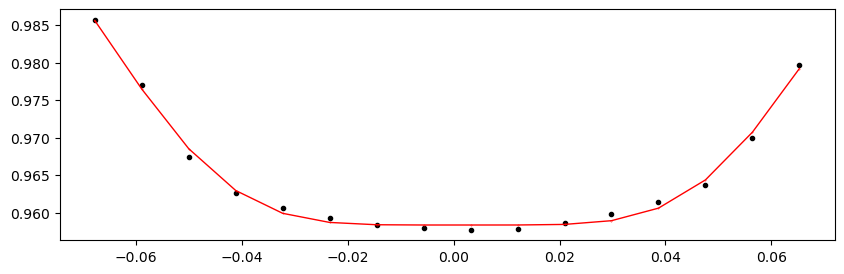

55478.353553 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.68it/s]


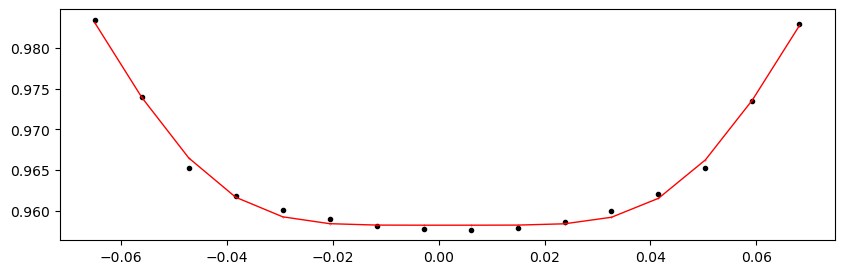

55480.655923 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.22it/s]


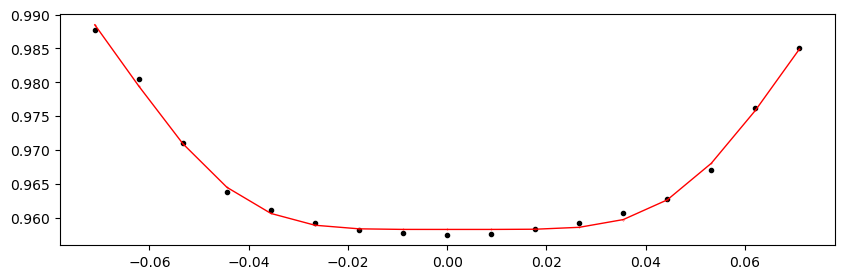

55482.958293 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.91it/s]


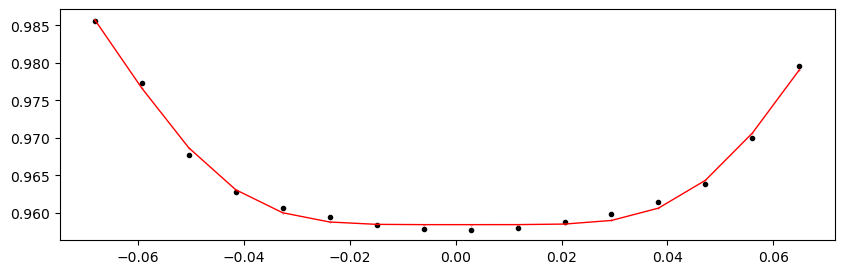

55485.260663 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.22it/s]


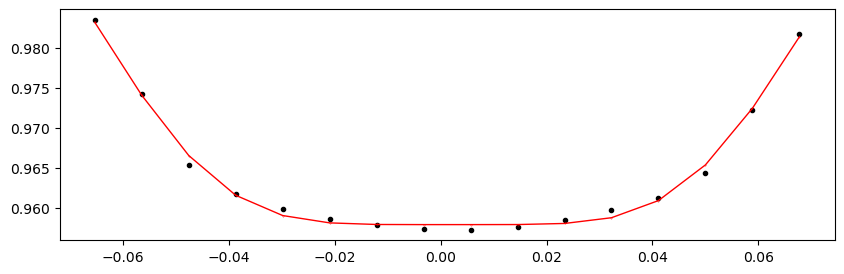

55487.563033 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.51it/s]


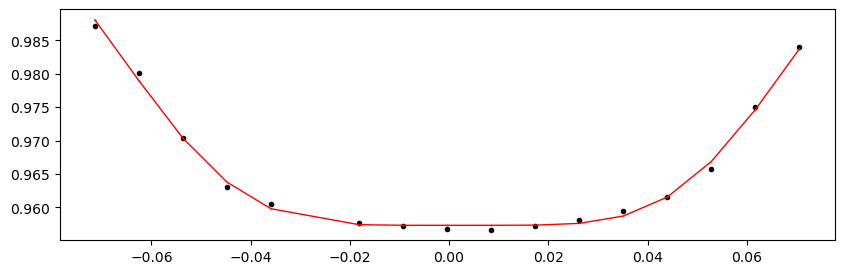

55489.865403 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.66it/s]


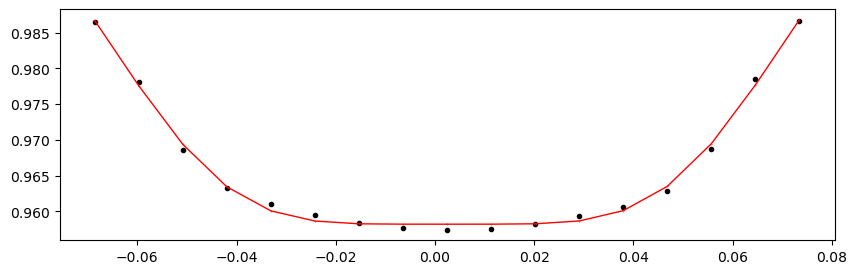

55492.167773 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.04it/s]


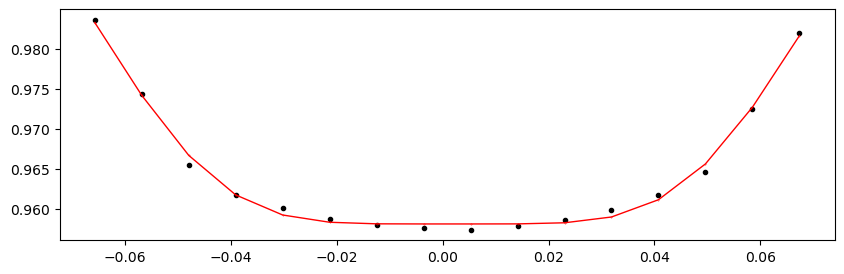

55494.470143 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.50it/s]


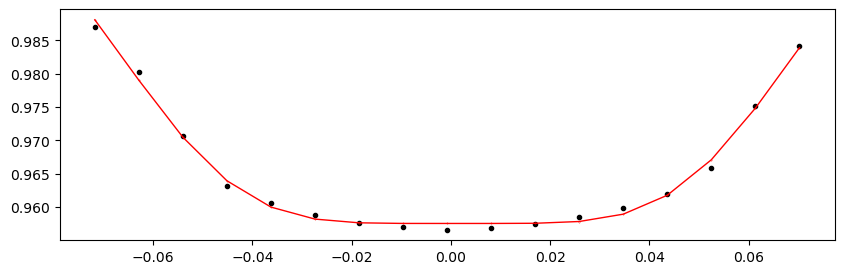

55496.772513 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.92it/s]


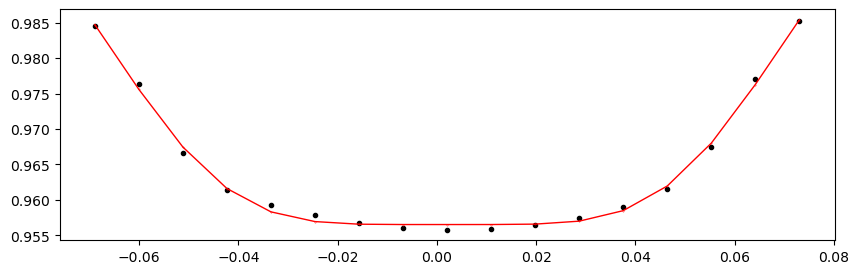

55499.074883 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.88it/s]


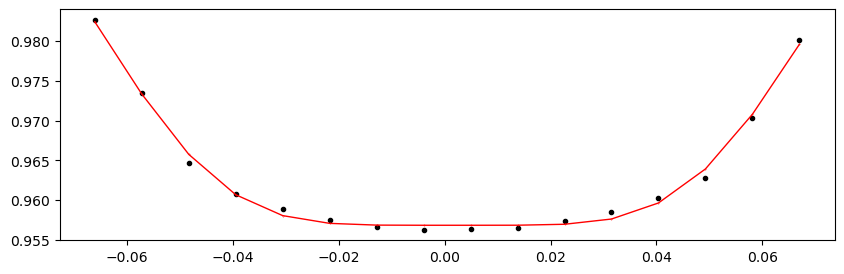

55501.377253 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.83it/s]


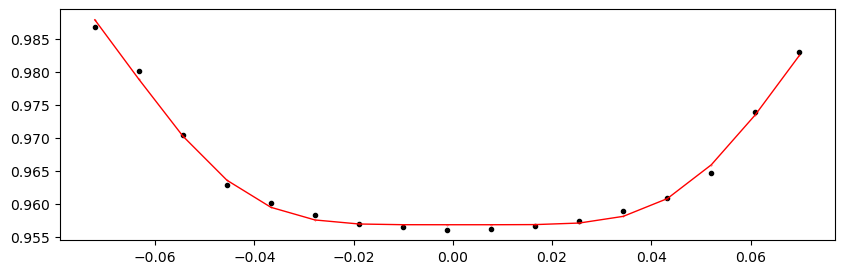

55503.679623 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.01it/s]


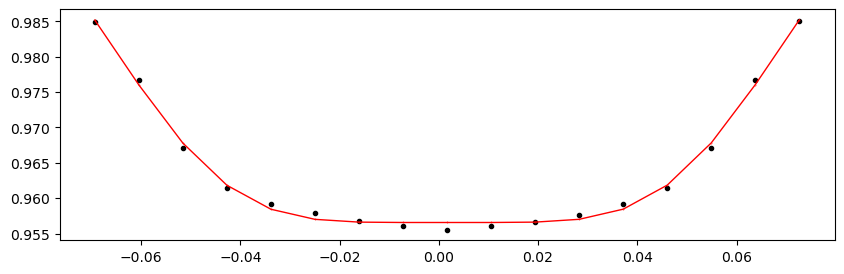

55505.981993 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.10it/s]


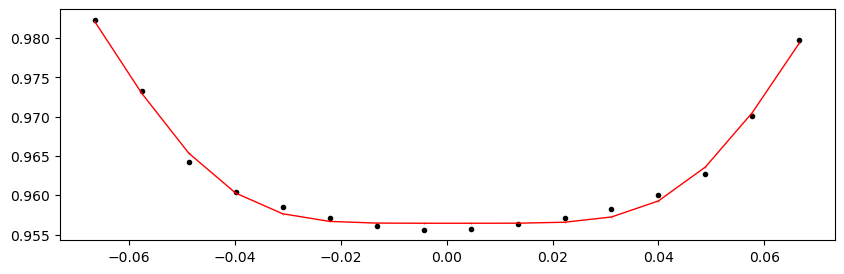

55508.284363 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.58it/s]


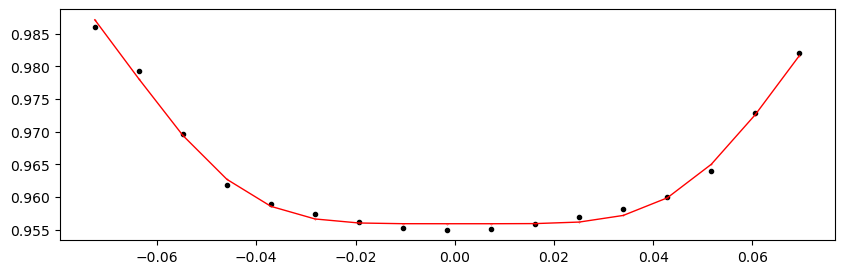

55510.586733000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.00it/s]


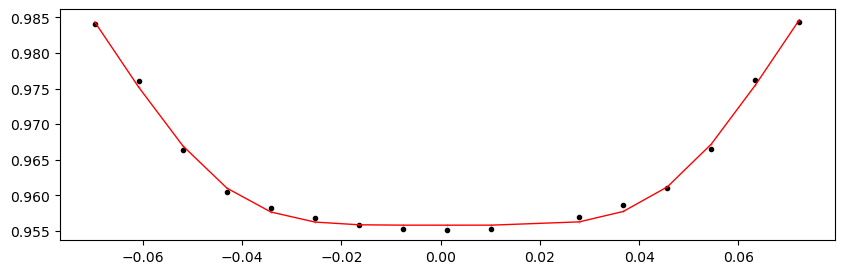

55512.889103 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.74it/s]


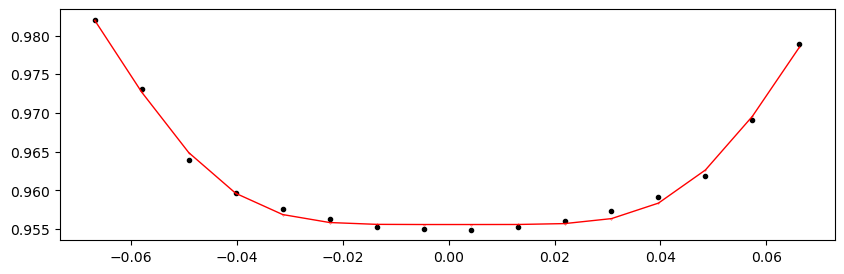

55515.191473 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.03it/s]


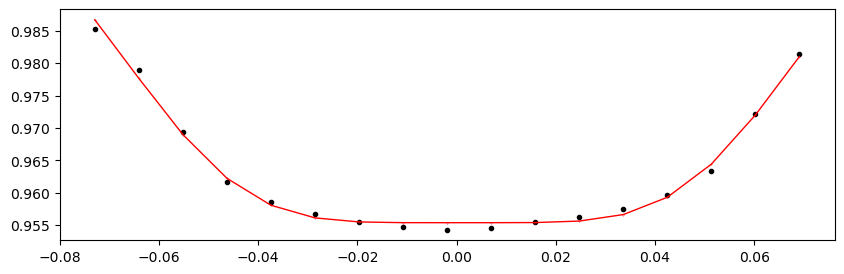

55517.493843000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.47it/s]


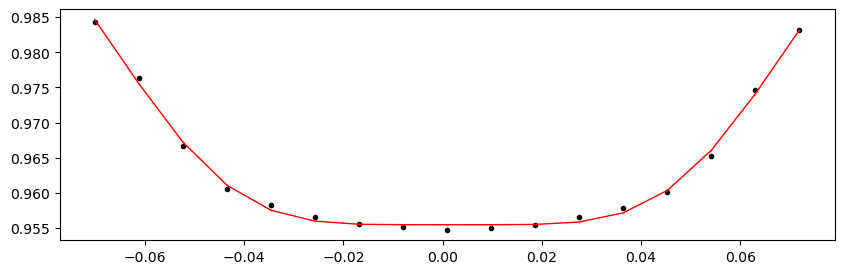

55519.796213 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.23it/s]


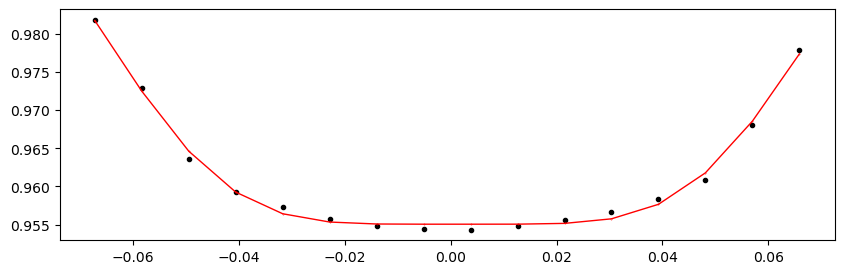

55522.098583 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.78it/s]


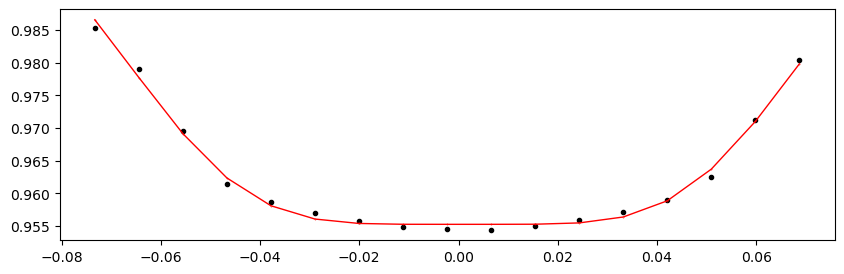

55524.400953000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.54it/s]


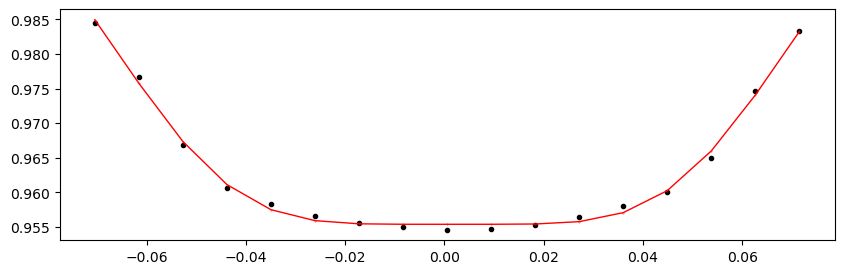

55526.703323 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.62it/s]


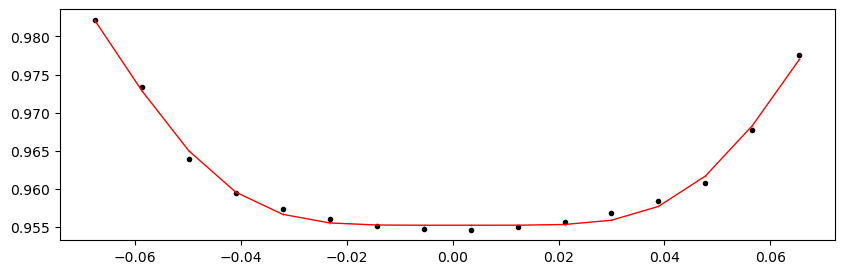

55529.005693 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.20it/s]


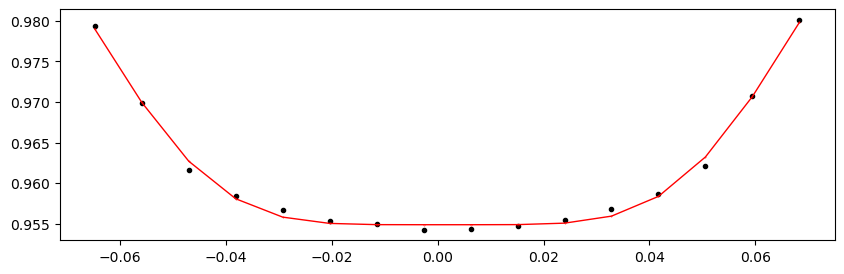

55531.308063 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.07it/s]


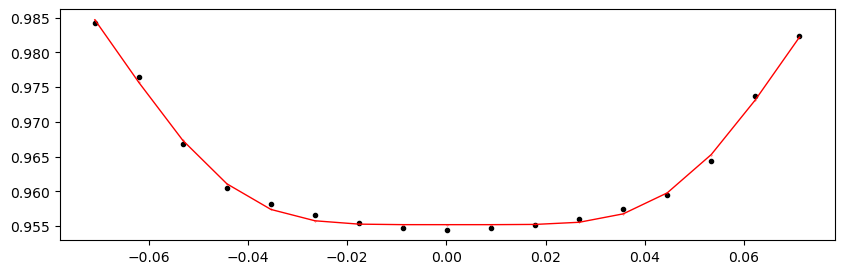

55533.610433 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.59it/s]


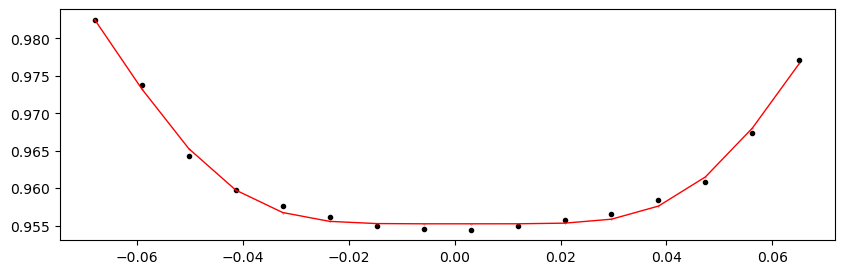

55535.912803 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.60it/s]


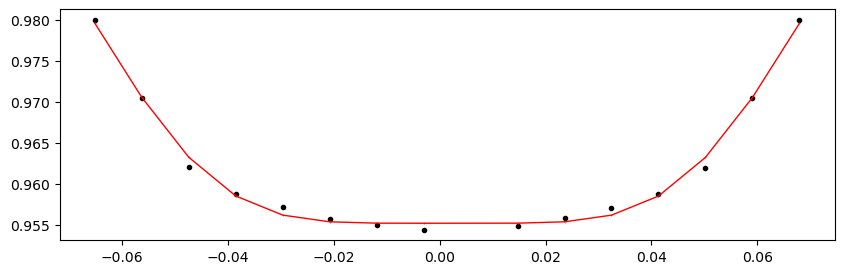

55538.215173 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.64it/s]


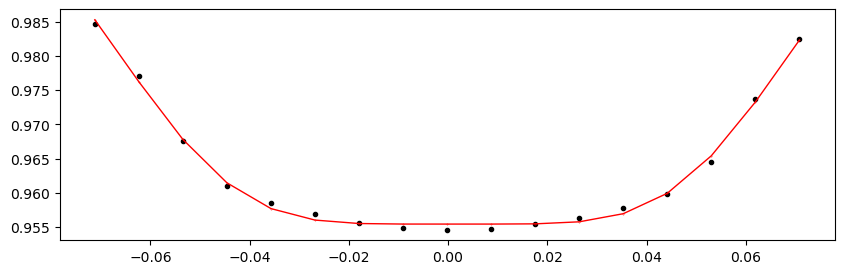

55540.517543 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.30it/s]


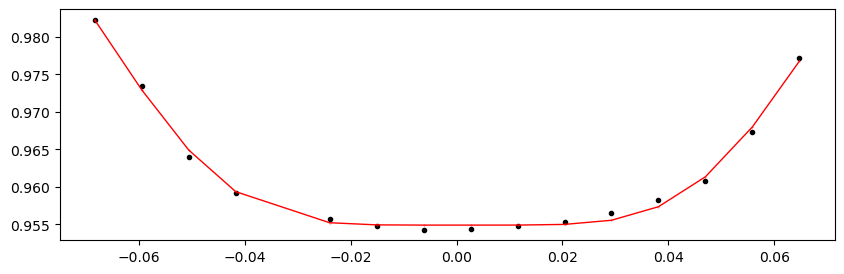

55542.819913 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.48it/s]


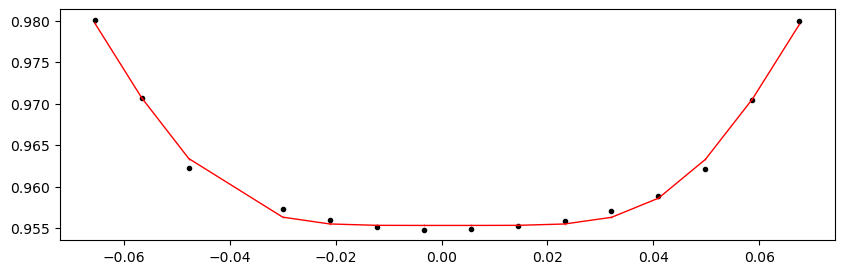

55545.122283 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.18it/s]


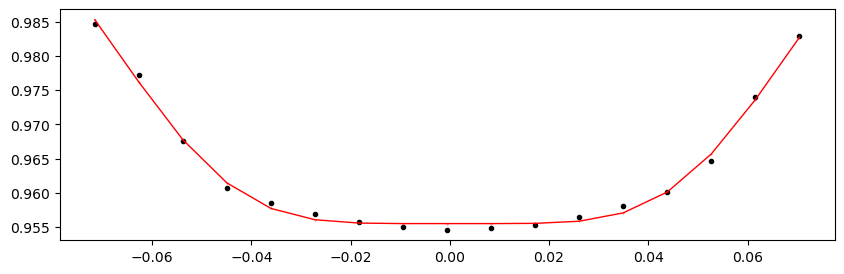

55547.424653 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.10it/s]


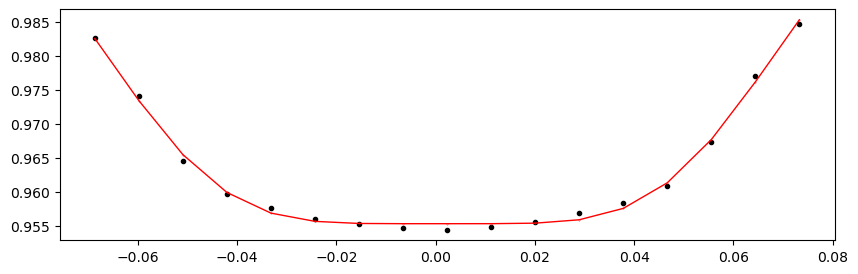

55549.727023 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.00it/s]


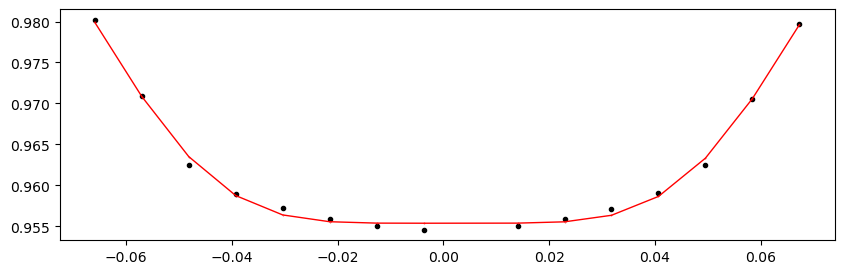

55568.145983 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.00it/s]


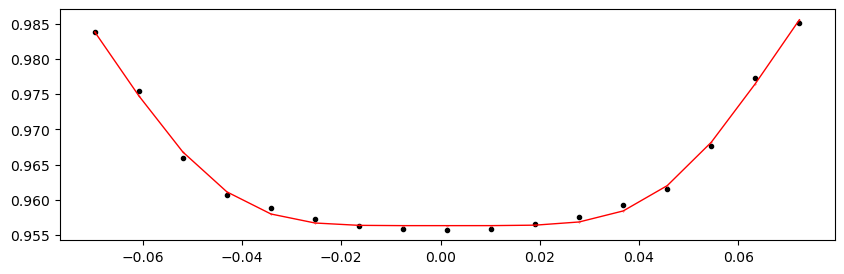

55570.448353 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.85it/s]


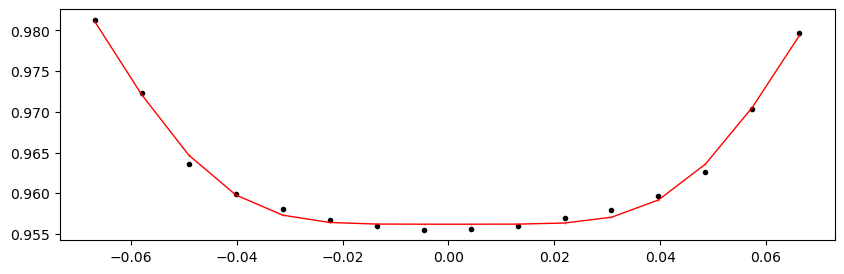

55572.750723 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.95it/s]


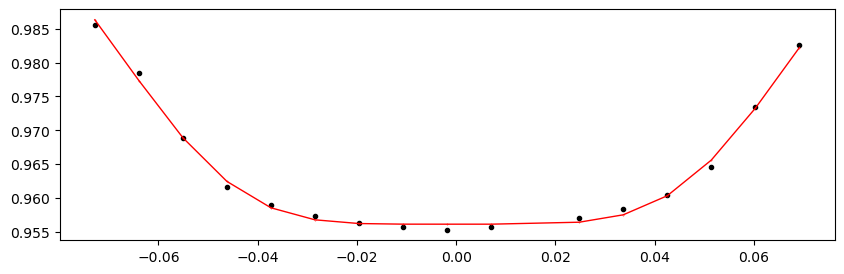

55575.053093 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.50it/s]


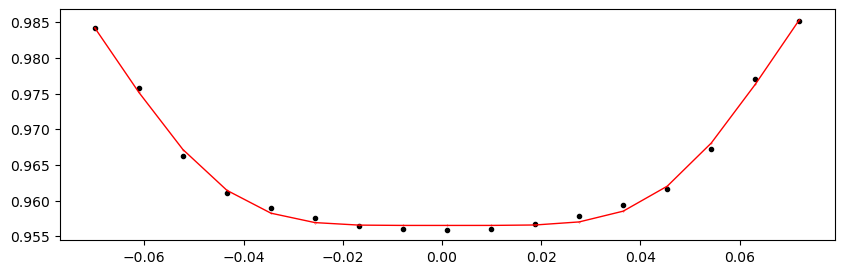

55577.355463 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.99it/s]


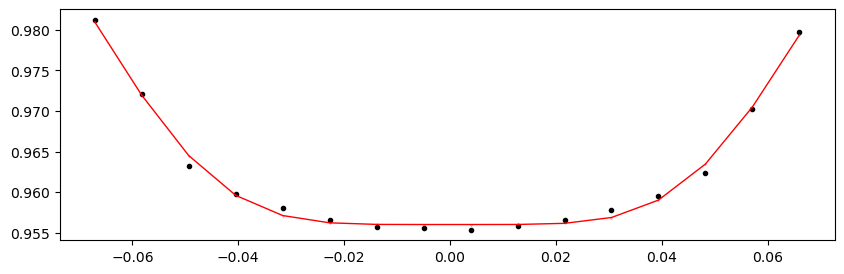

55579.657833 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.41it/s]


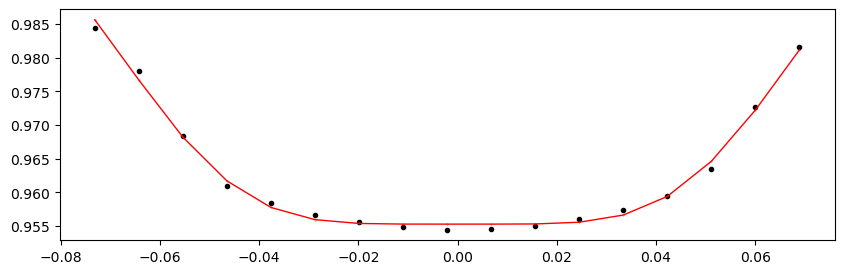

55581.960203 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.81it/s]


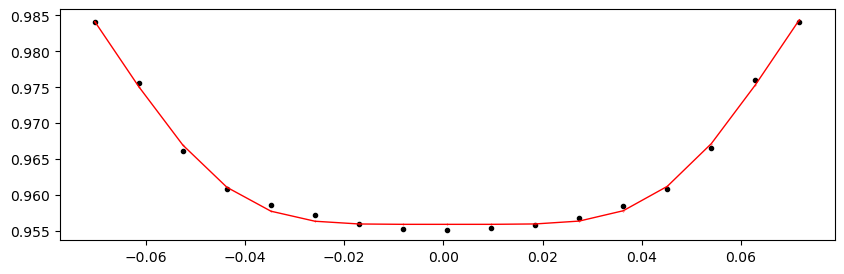

55584.262573 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.73it/s]


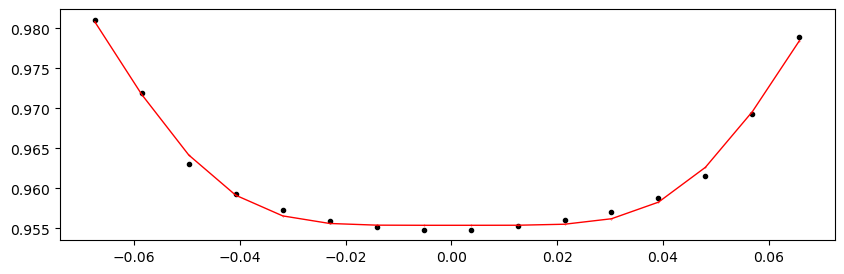

55586.564943 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.12it/s]


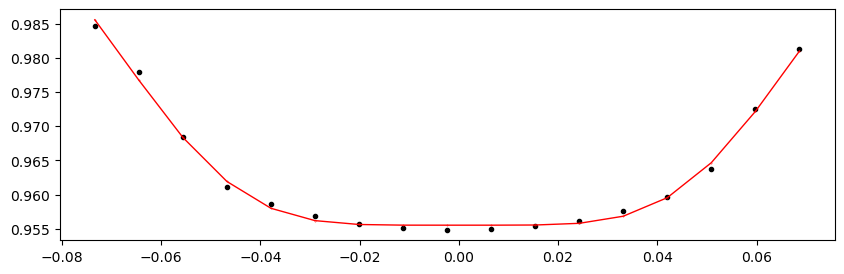

55588.867313 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.12it/s]


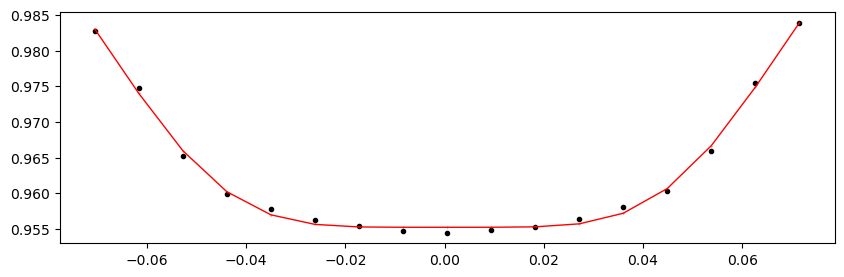

55591.169683 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.42it/s]


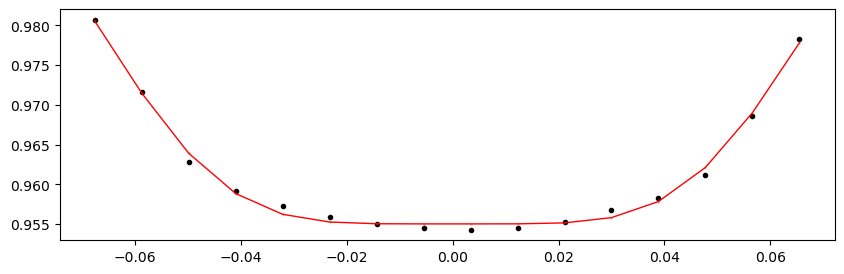

55598.076793 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.31it/s]


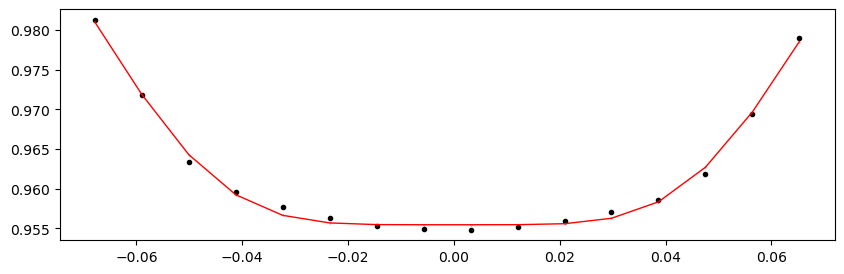

55600.379163 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.47it/s]


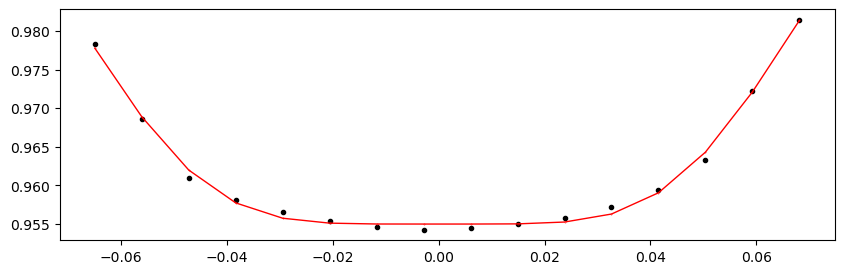

55602.681533 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.85it/s]


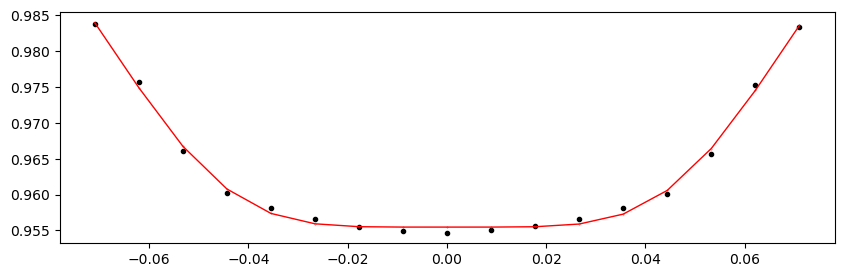

55604.983903 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.74it/s]


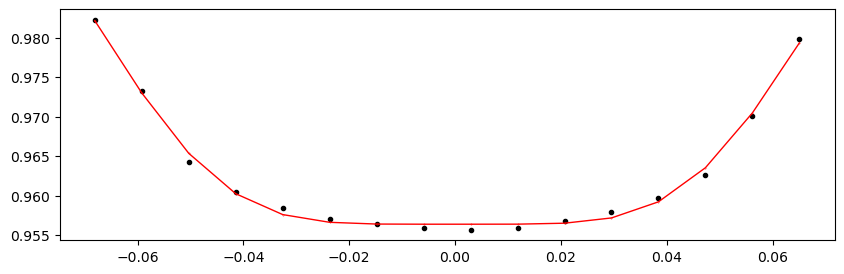

55607.286273 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.89it/s]


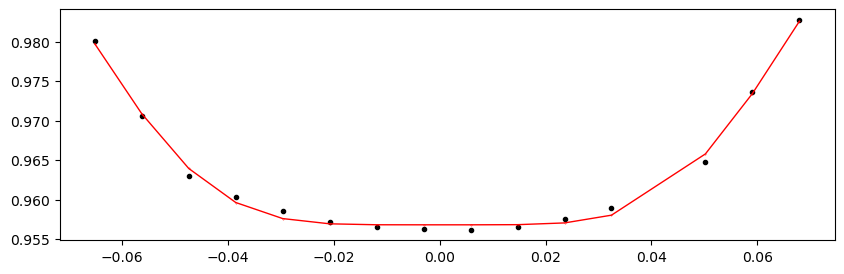

55609.588643 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.36it/s]


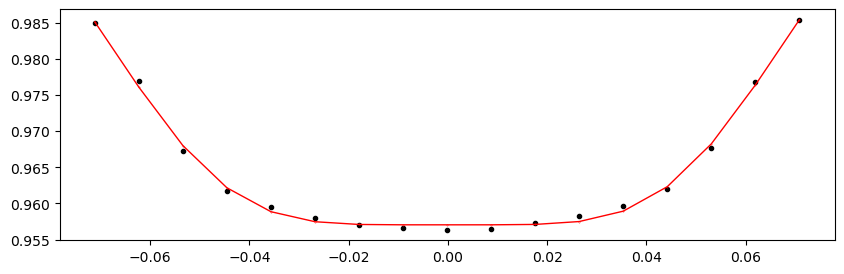

55611.891013 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.63it/s]


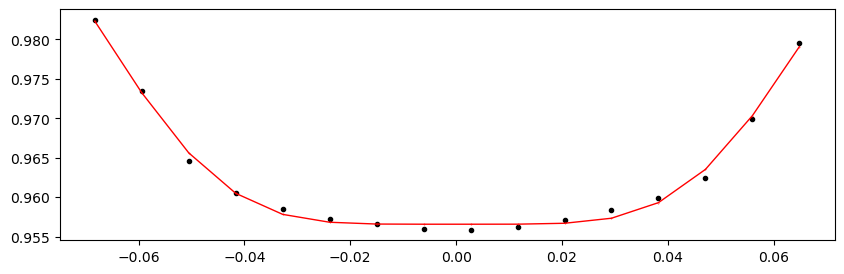

55614.193383 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.82it/s]


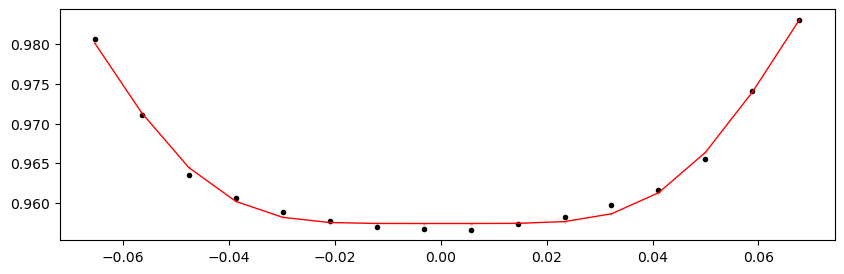

55616.495753 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.68it/s]


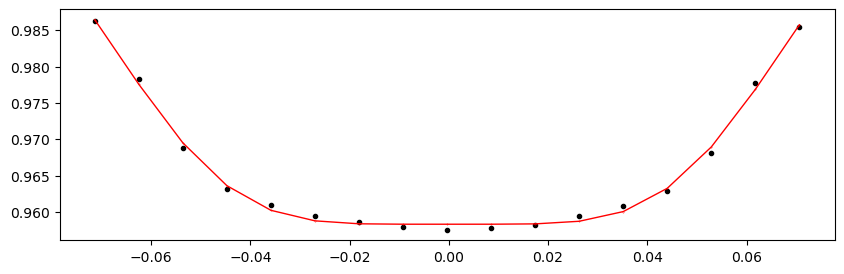

55618.798123 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.18it/s]


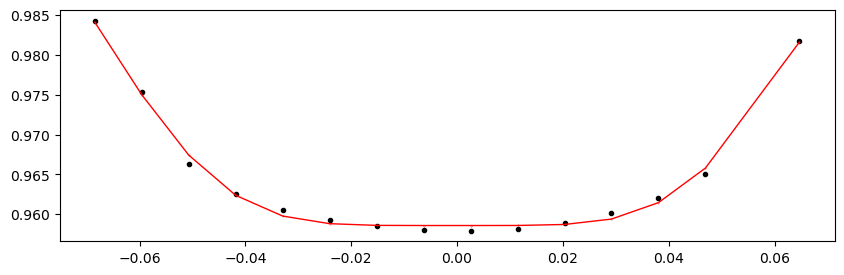

55621.100493 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.53it/s]


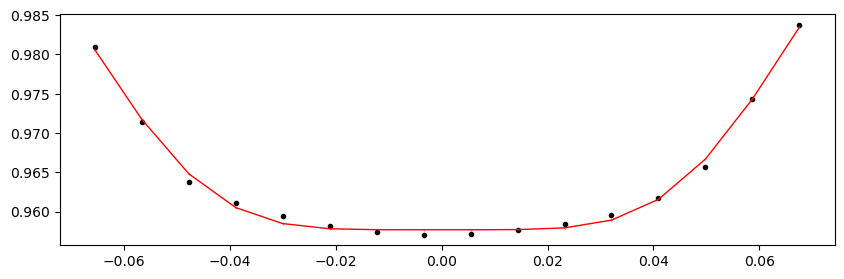

55623.402863 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.73it/s]


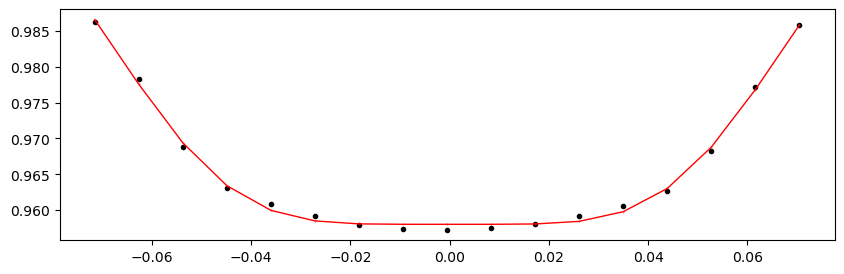

55625.705233 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.16it/s]


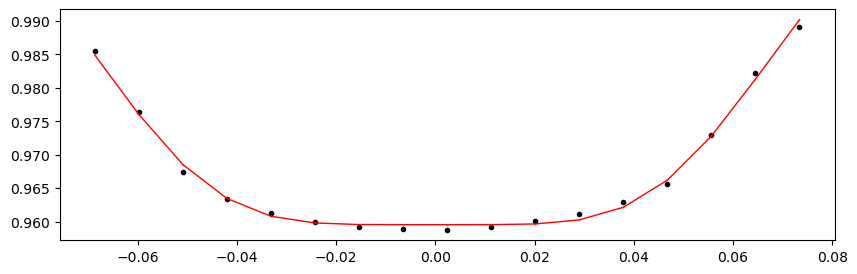

55628.007603 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.65it/s]


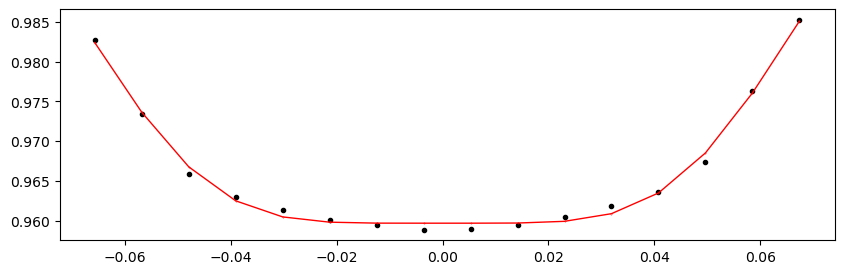

55630.309973 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.20it/s]


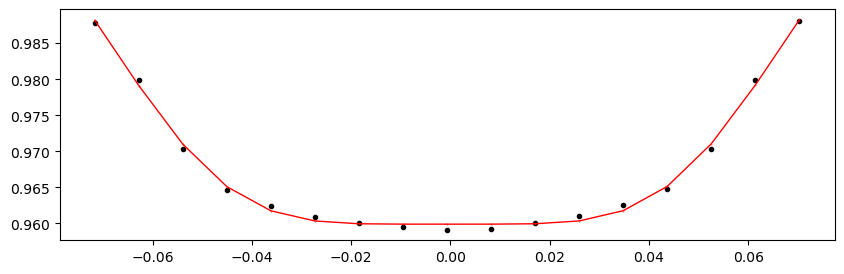

55632.612343 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.26it/s]


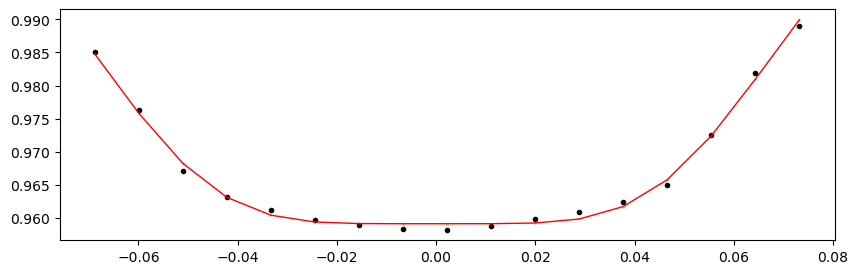

55641.821823 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.60it/s]


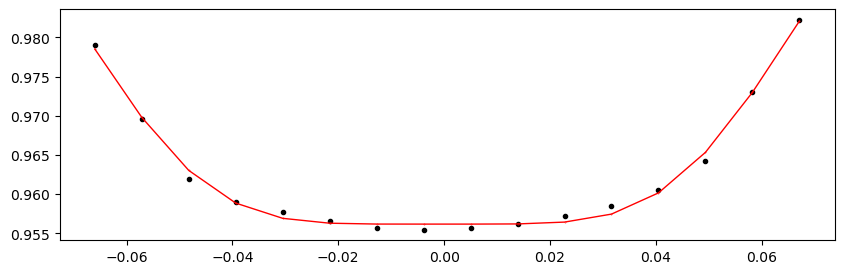

55644.124193 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.30it/s]


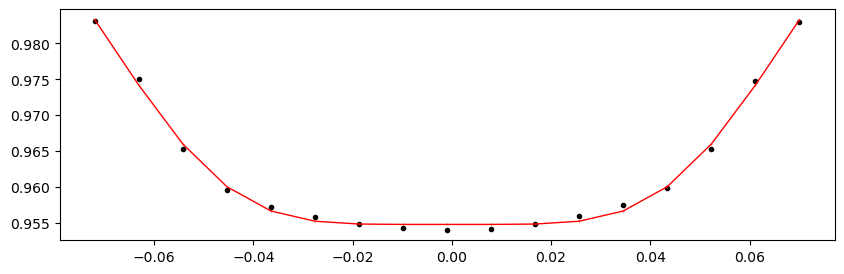

55646.426563 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.36it/s]


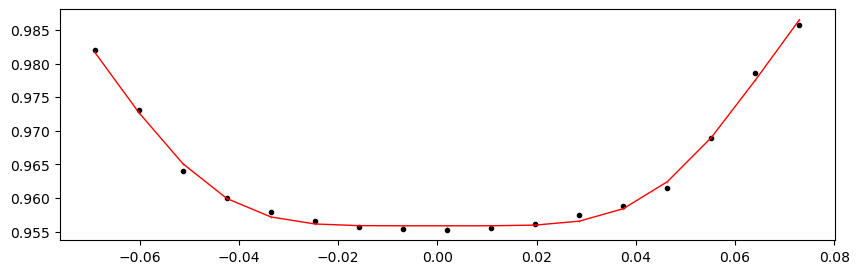

55648.728933 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.73it/s]


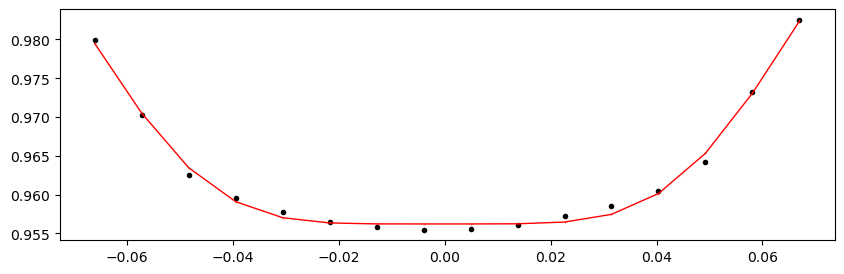

55651.031303 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.63it/s]


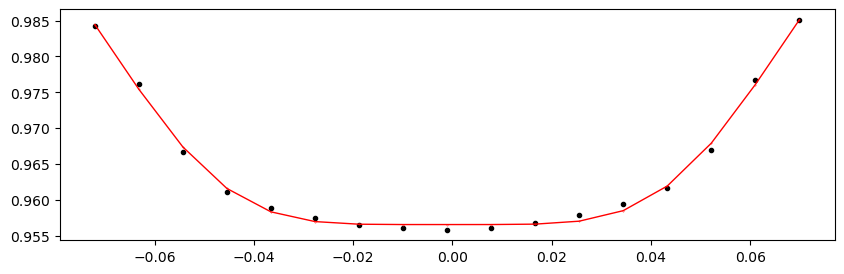

55653.333673 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.52it/s]


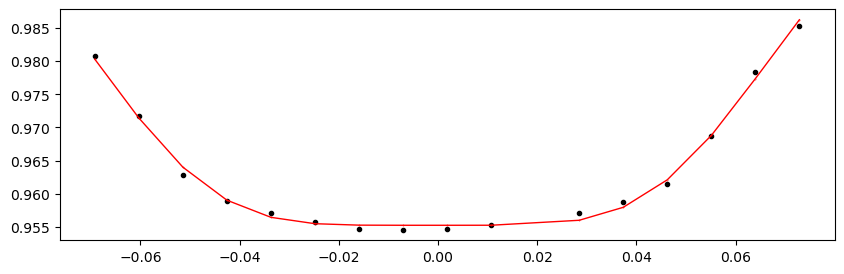

55655.636043 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.42it/s]


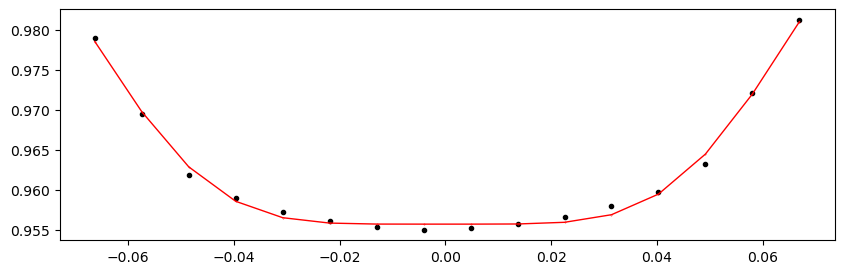

55657.938413 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.41it/s]


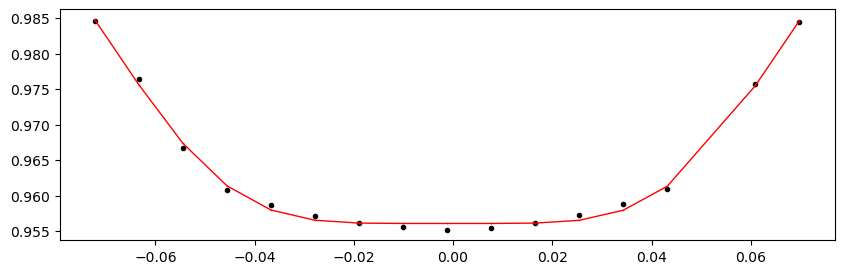

55660.240783 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.10it/s]


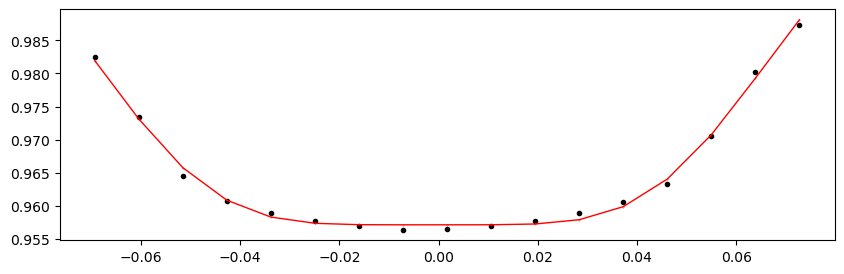

55662.543153 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.70it/s]


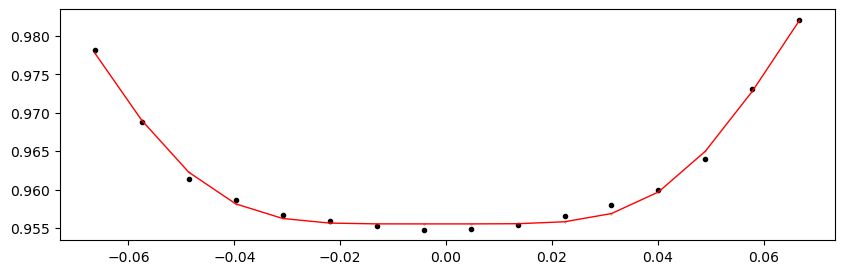

55664.845523 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.81it/s]


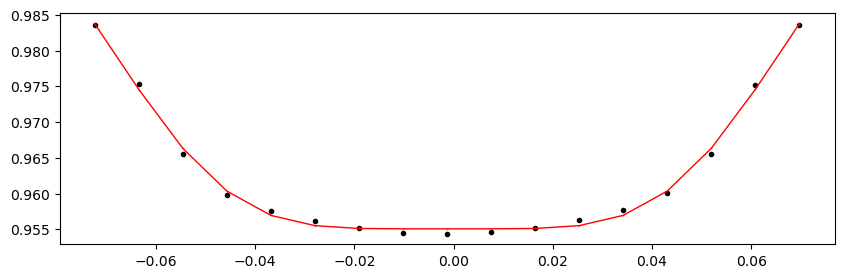

55667.147893 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.98it/s]


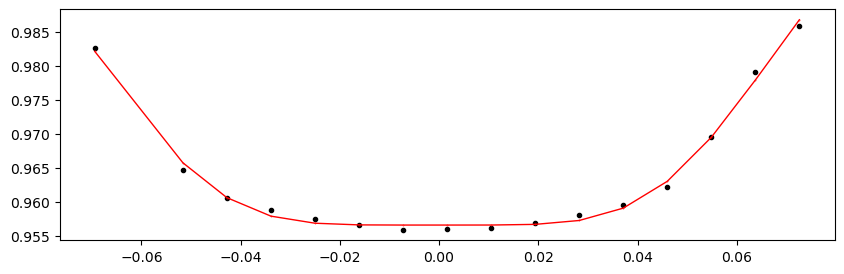

55669.450263 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.92it/s]


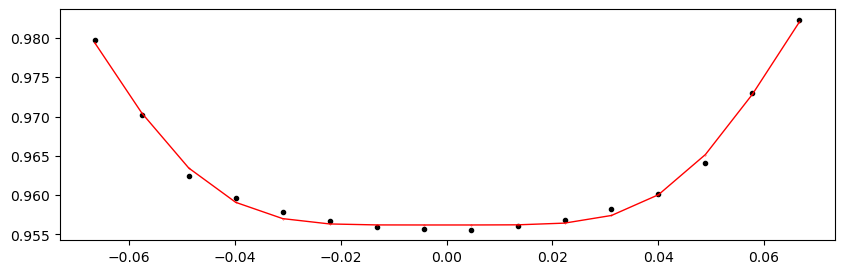

55671.752633000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.12it/s]


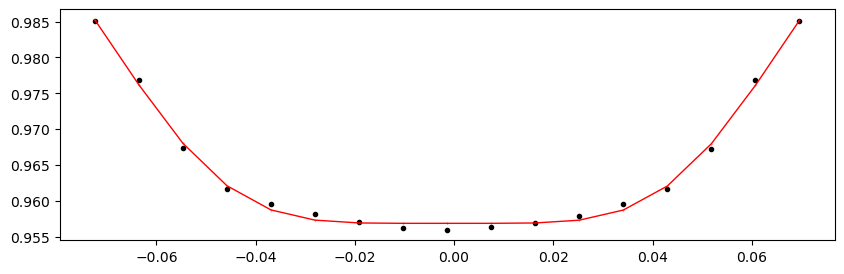

55674.055003 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.30it/s]


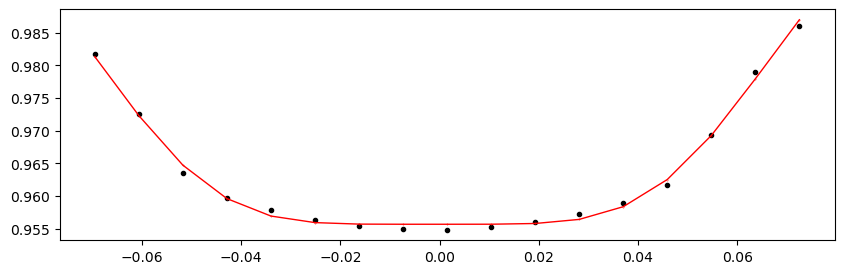

55676.357373 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.22it/s]


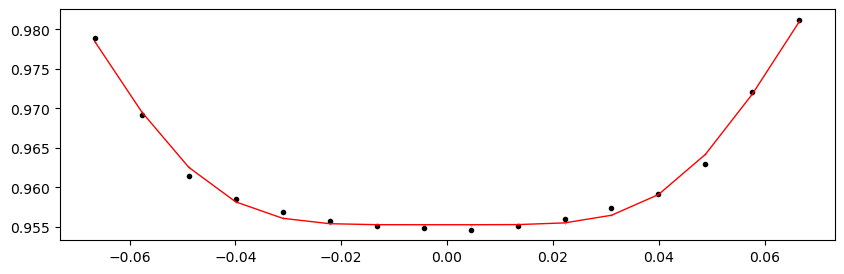

55678.659743000004 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.94it/s]


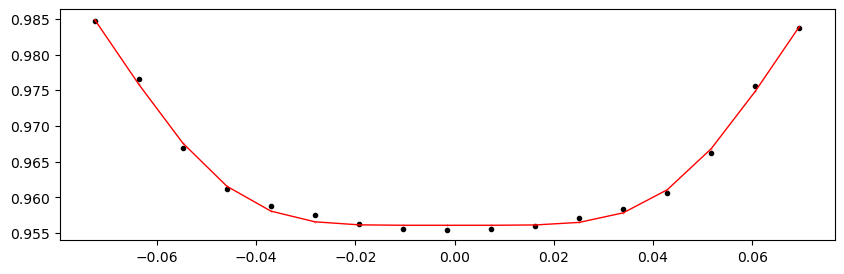

55680.962113 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.94it/s]


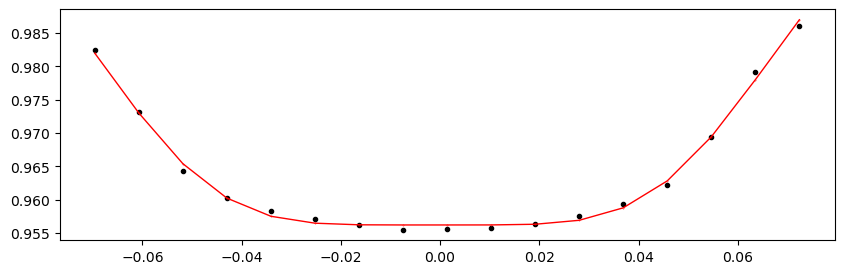

55683.264483 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.88it/s]


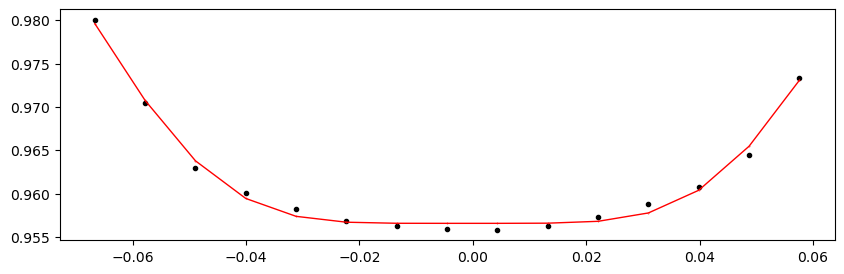

55685.566853 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.17it/s]


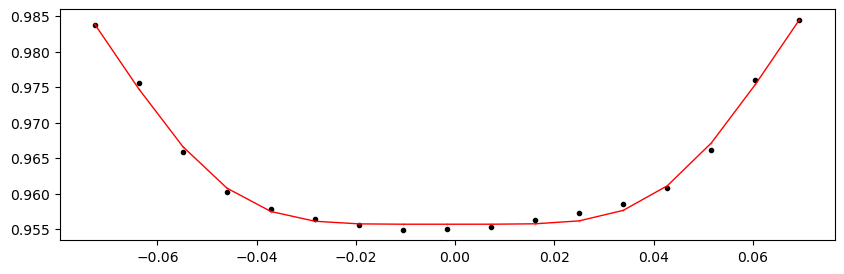

55687.869223 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.43it/s]


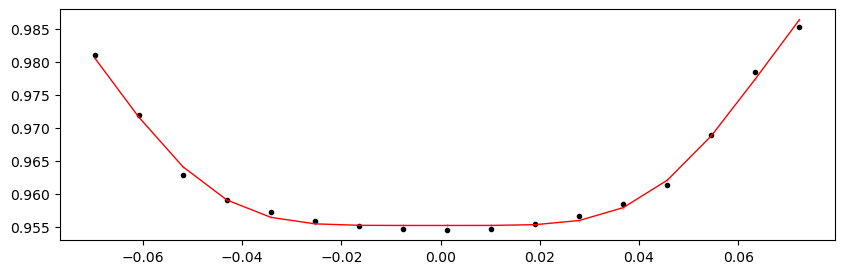

55690.171593 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.05it/s]


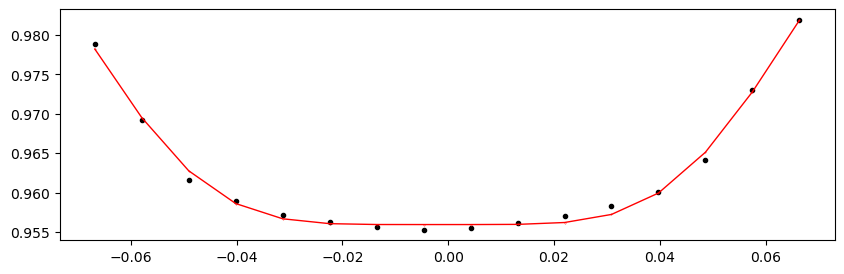

55692.473963 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.39it/s]


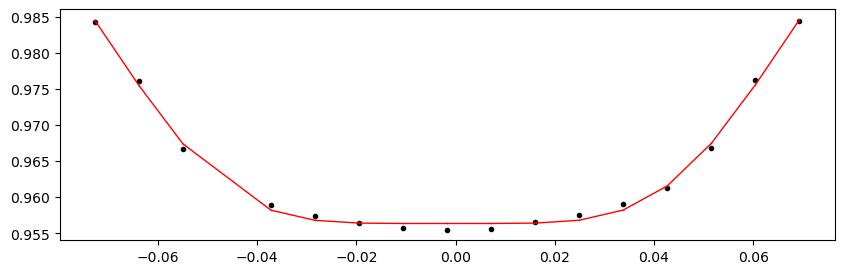

55694.776333 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.47it/s]


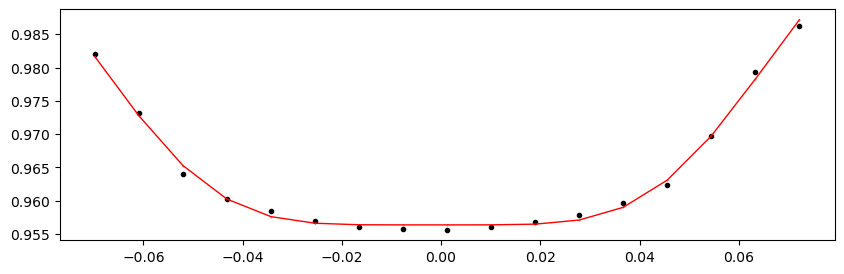

55697.078703 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.53it/s]


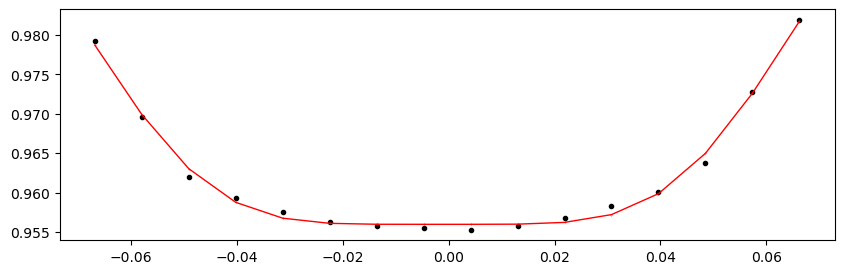

55699.381073 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.58it/s]


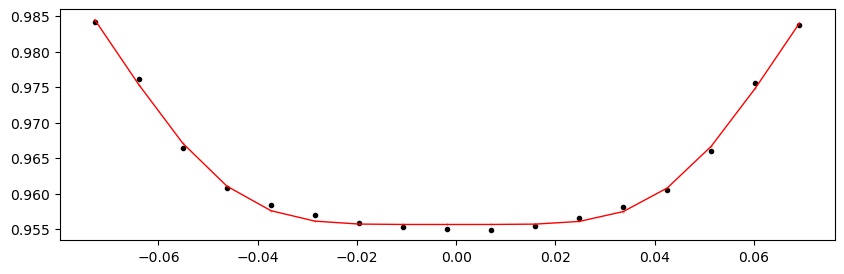

55701.683443 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.43it/s]


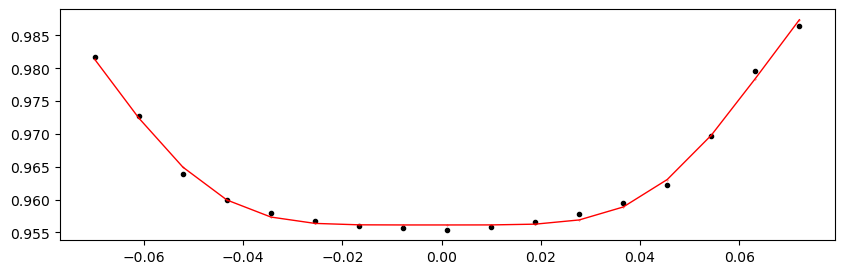

55703.985813 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.41it/s]


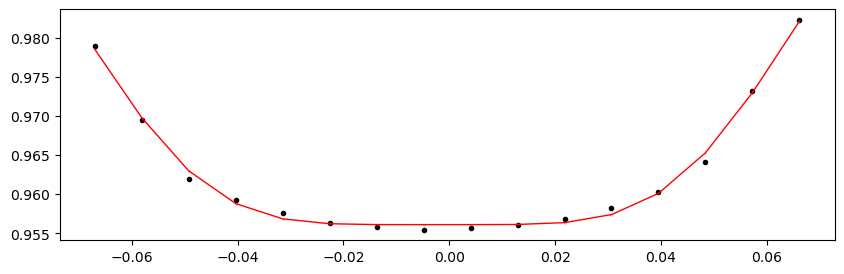

55706.288183 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.08it/s]


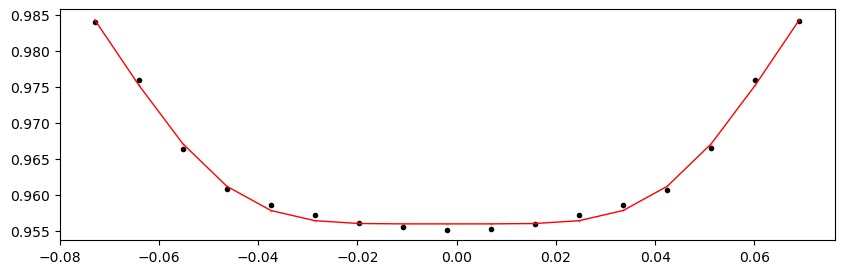

55708.590553 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.51it/s]


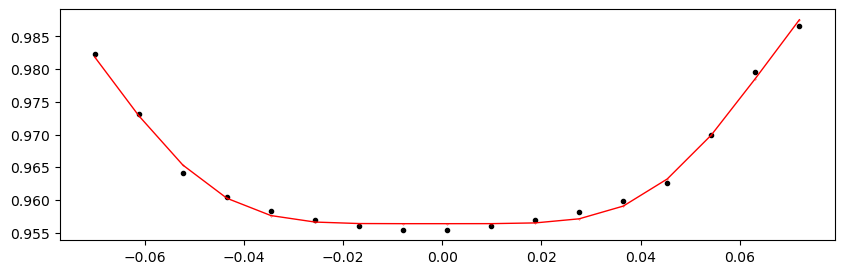

55710.892923 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.78it/s]


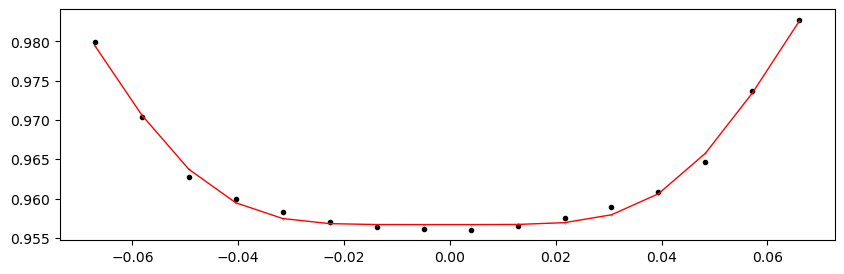

55713.195293 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.61it/s]


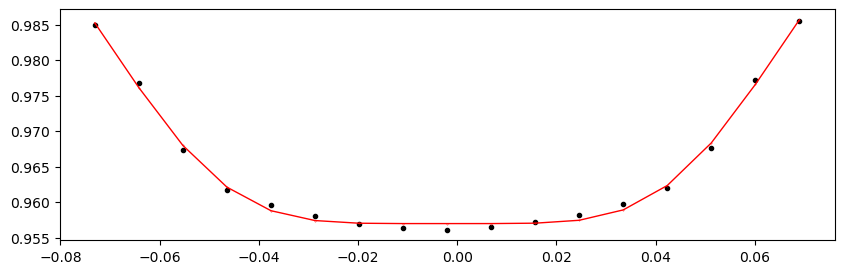

55715.497663 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.33it/s]


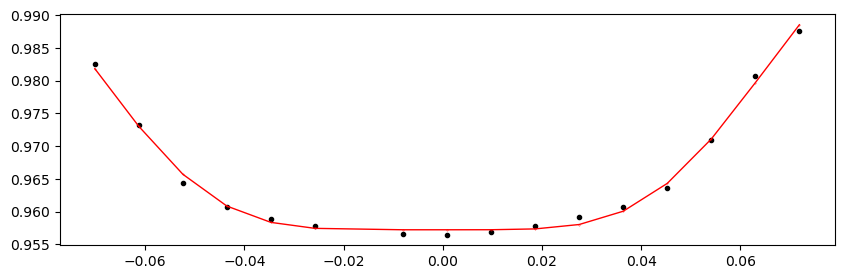

55717.800033 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.40it/s]


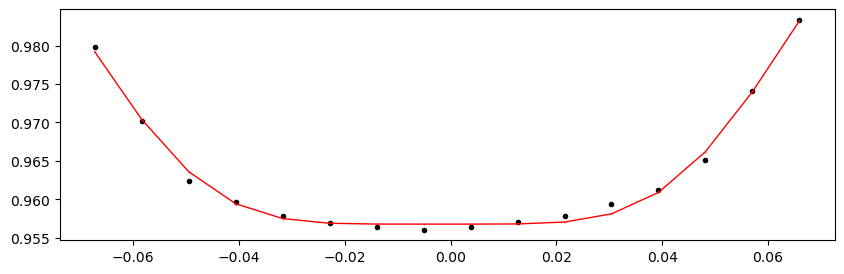

55722.404773 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.33it/s]


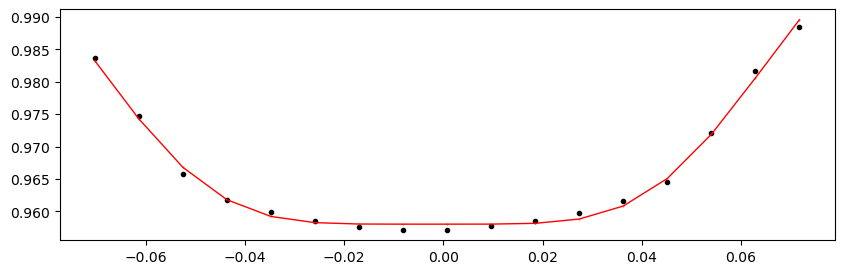

55724.707143 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.10it/s]


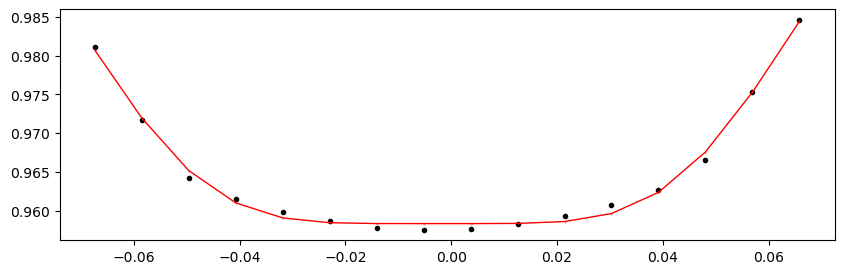

55727.009513 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.25it/s]


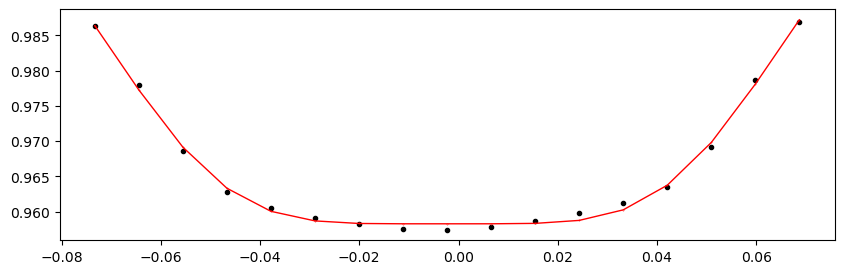

55729.311883 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.79it/s]


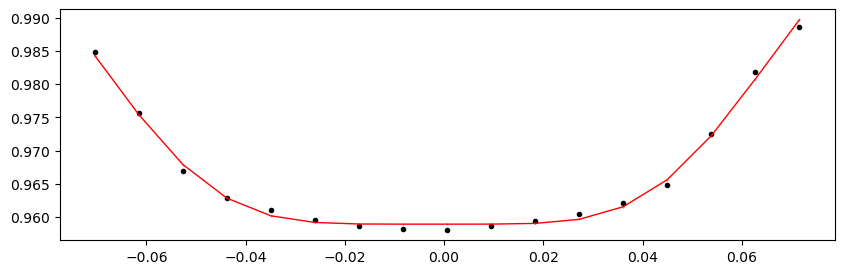

55731.614253 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.55it/s]


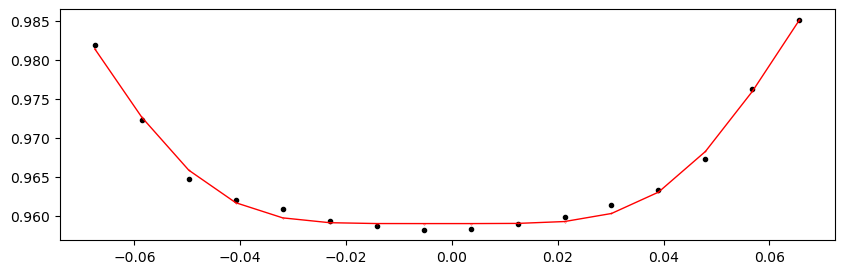

55733.916623 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.12it/s]


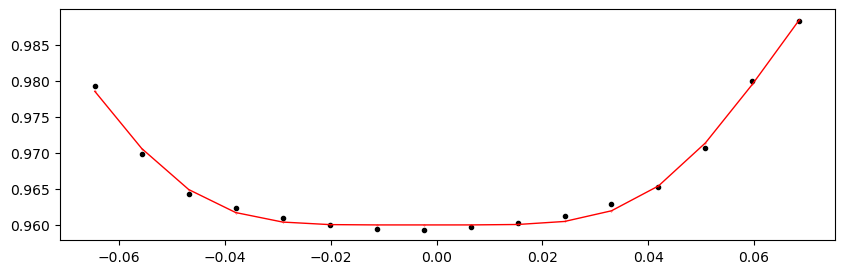

55736.218993 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.57it/s]


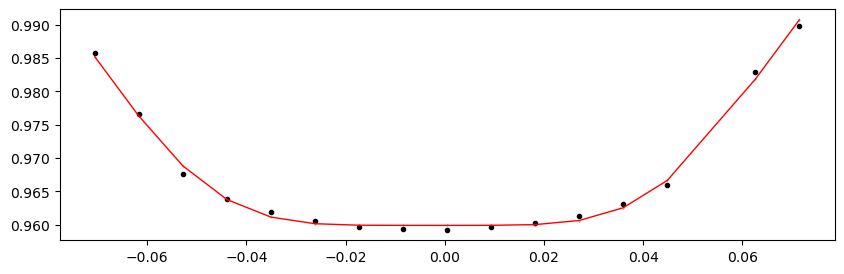

55740.823733 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.00it/s]


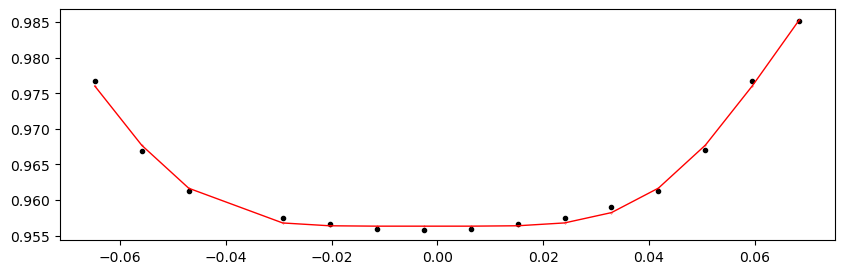

55743.126103 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.77it/s]


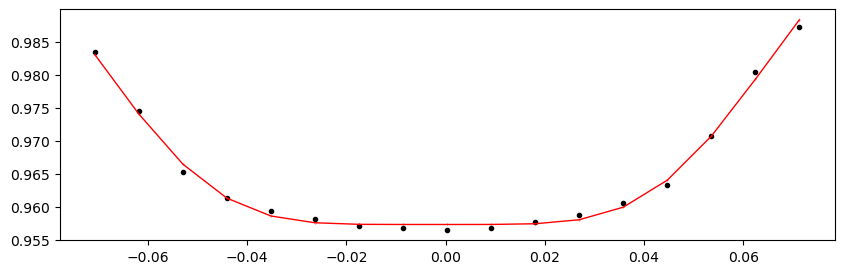

55745.428473 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.05it/s]


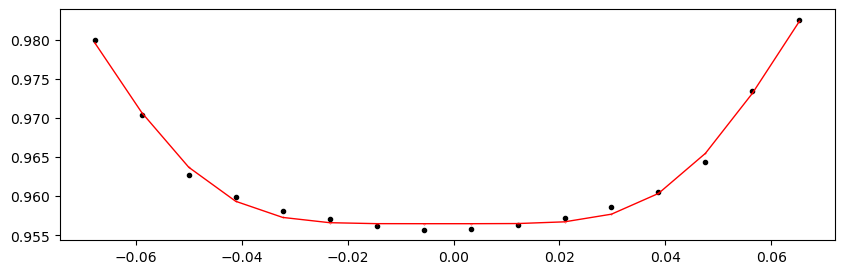

55747.730843 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.66it/s]


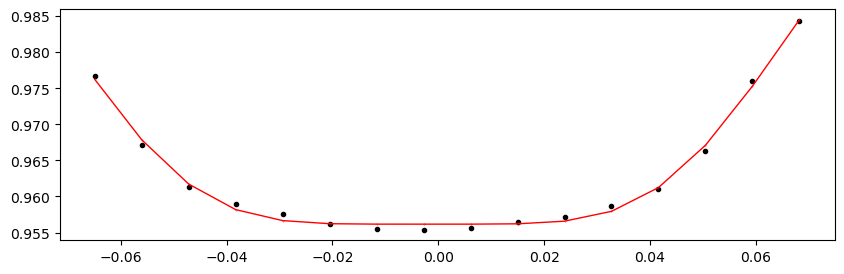

55750.033213 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.26it/s]


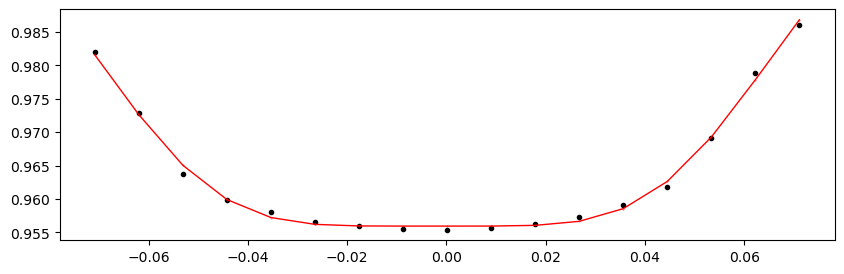

55752.335583 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.99it/s]


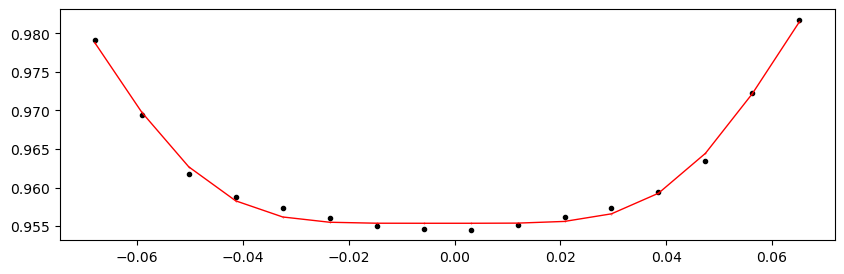

55754.637953 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.37it/s]


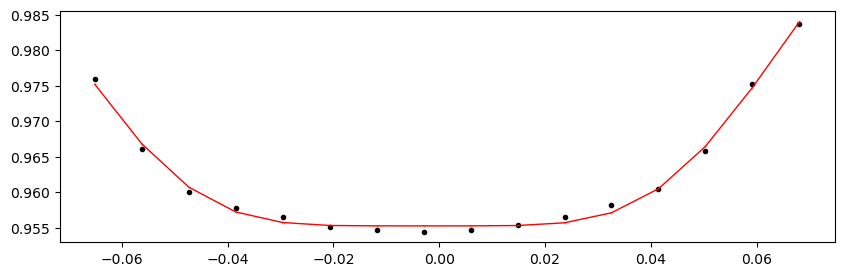

55756.940323 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.30it/s]


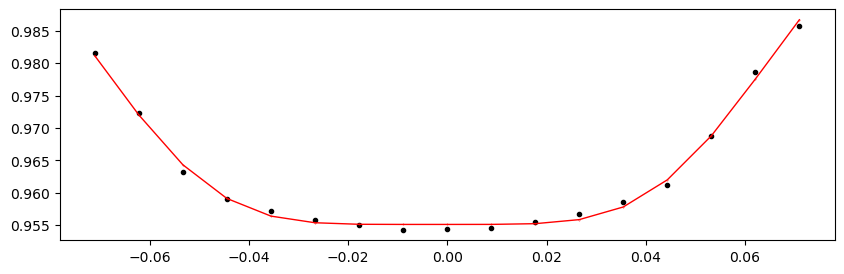

55759.242693 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.95it/s]


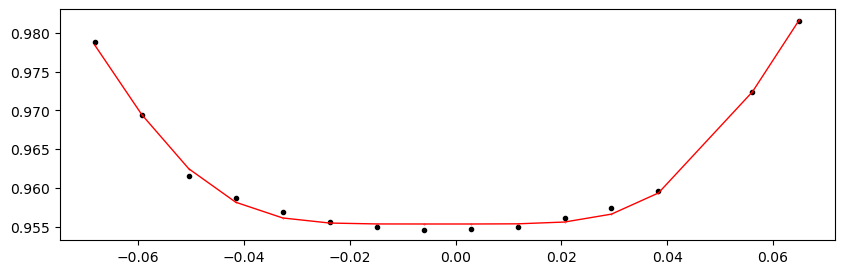

55761.545063 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.95it/s]


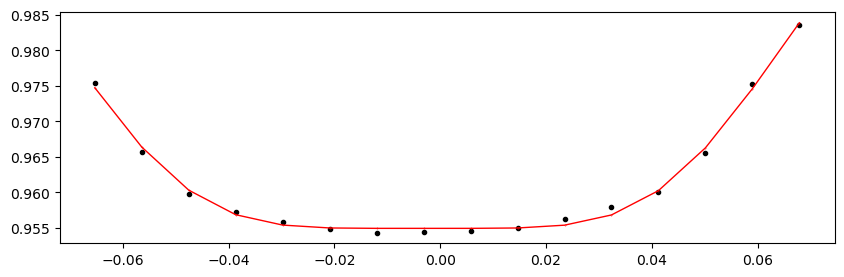

55763.847433 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.72it/s]


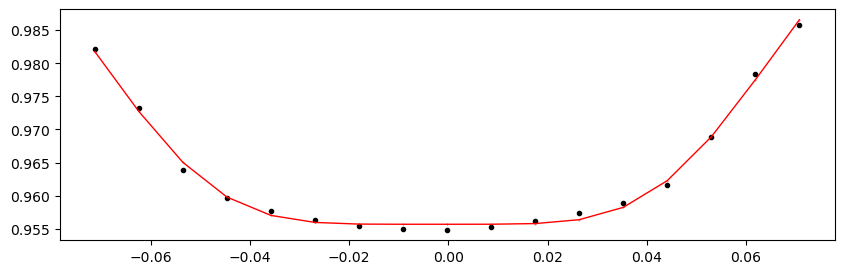

55766.149803 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.94it/s]


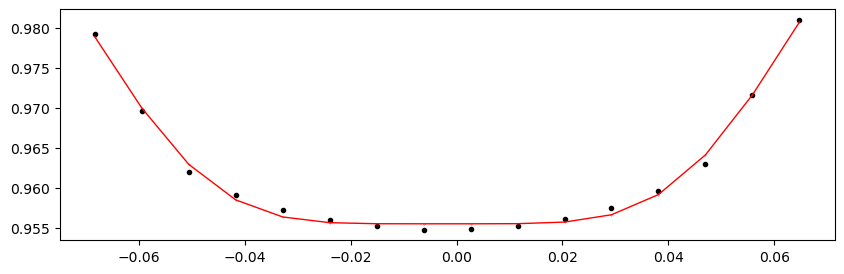

55768.452173 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.13it/s]


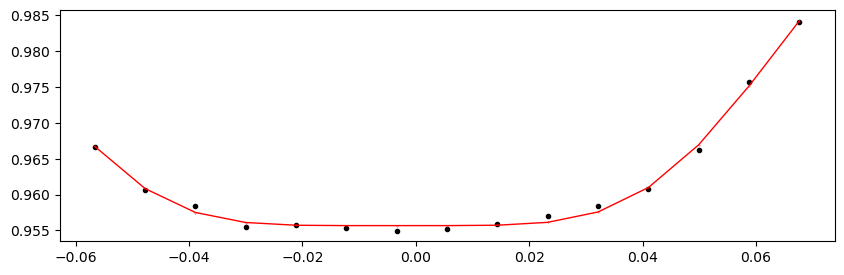

55770.754543 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.22it/s]


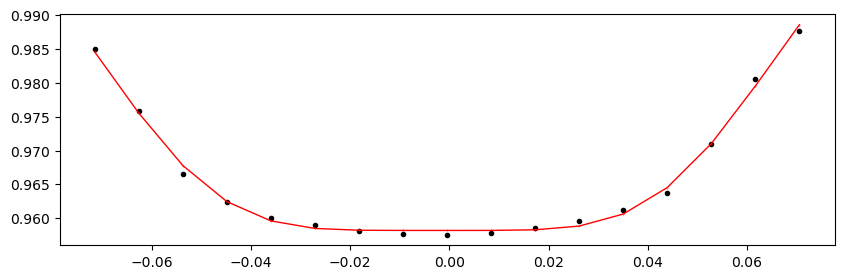

55773.056913 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.64it/s]


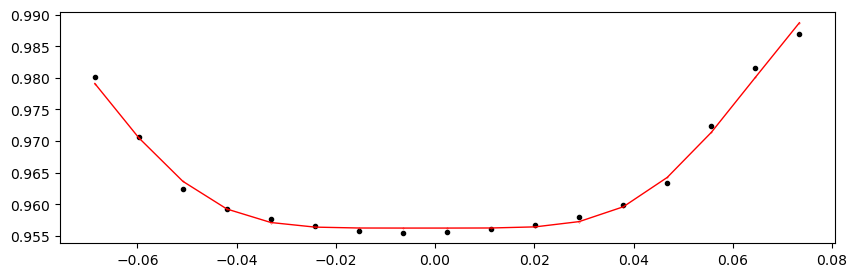

55775.359283 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.58it/s]


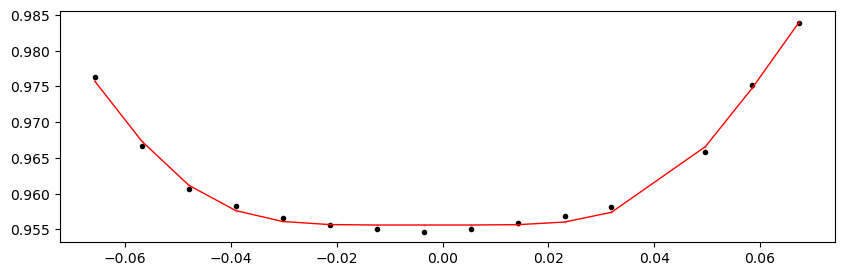

55777.661653 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.90it/s]


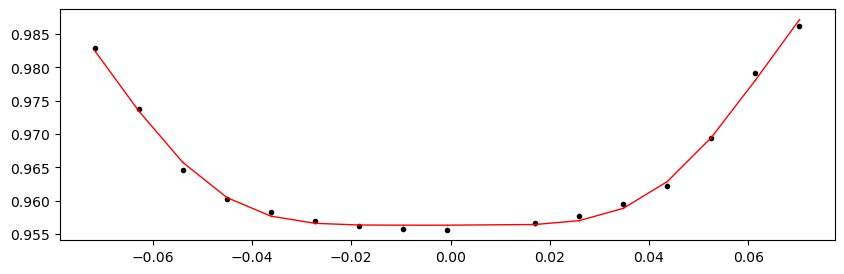

55779.964023 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.71it/s]


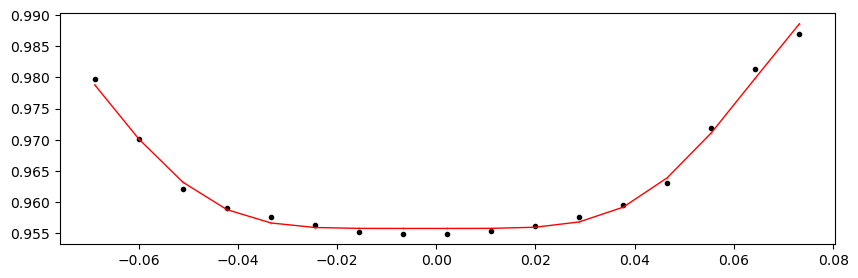

55782.266393 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.12it/s]


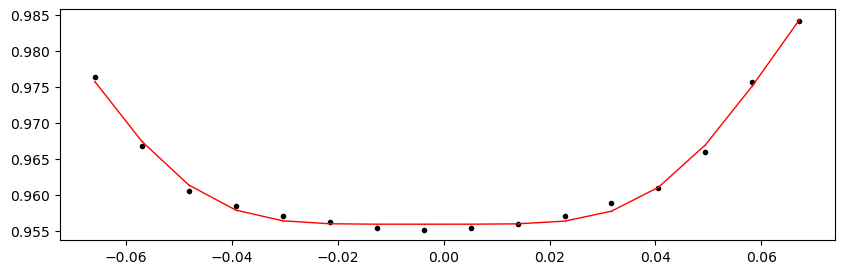

55784.568763 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.85it/s]


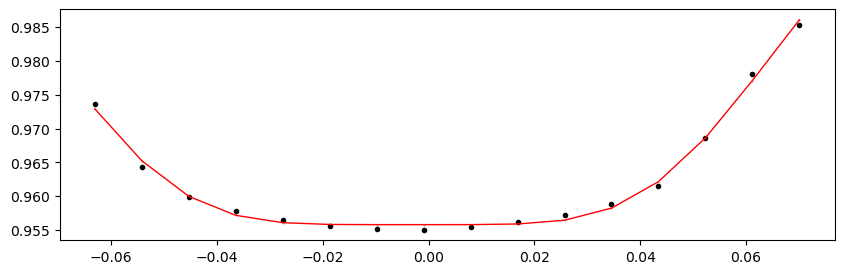

55786.871133 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.38it/s]


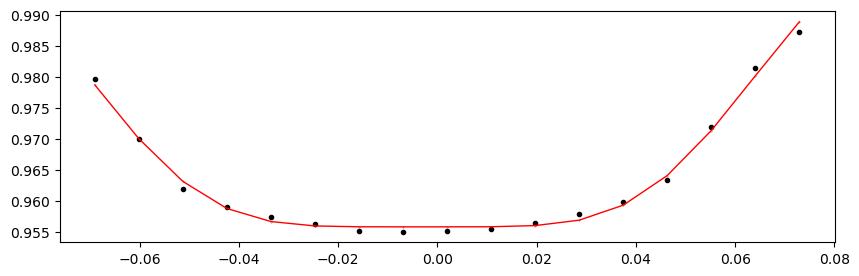

55789.173503 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.64it/s]


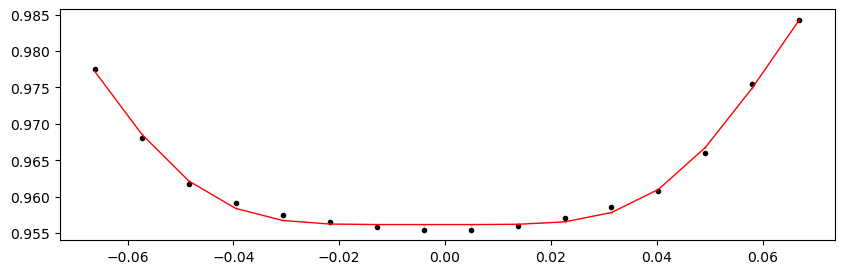

55791.475873 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.53it/s]


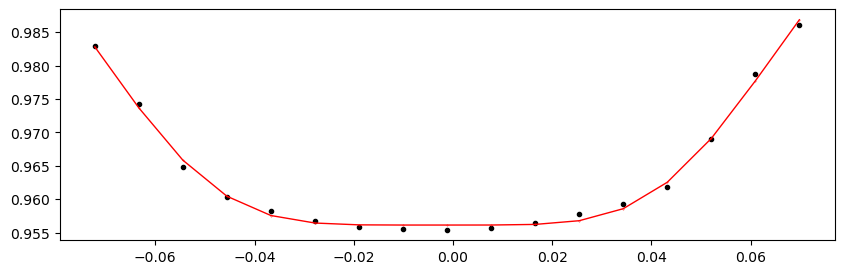

55793.778243 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.45it/s]


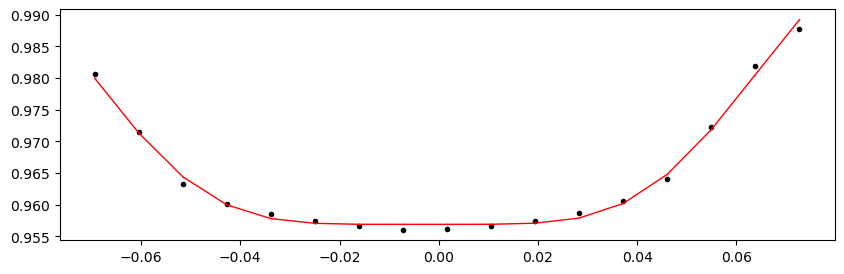

55796.080613 1.006027094542627 -0.04918382258148684 0.1932828485615261


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.26it/s]


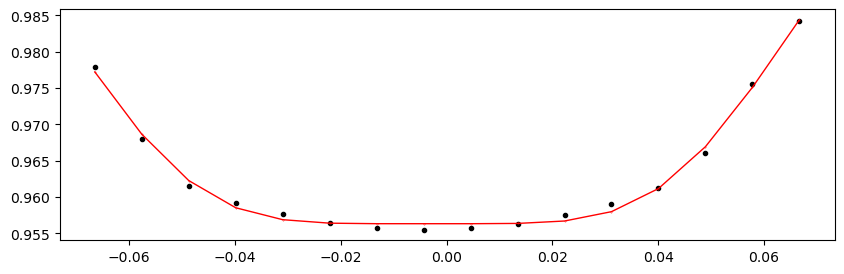

Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
Number 5 has already been completed -- skip
Number 6 has already been completed -- skip
Number 7 has already been completed -- skip
Number 8 has already been completed -- skip
Number 9 has already been completed -- skip
Number 10 has already been completed -- skip
Number 11 has already been completed -- skip
Number 12 has already been completed -- skip
Number 13 has already been completed -- skip
Number 14 has already been completed -- skip
Number 15 has already been completed -- skip
Number 16 has already been completed -- skip
Number 17 has already been completed -- skip
Number 18 has already been completed -- skip
Number 21 has already been completed -- skip
Number 22 has

100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.24it/s]


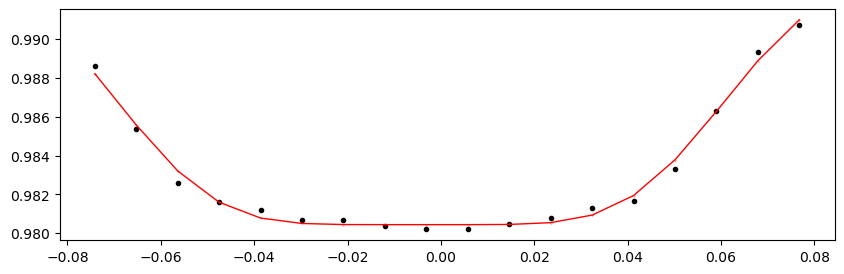

55302.228694636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.58it/s]


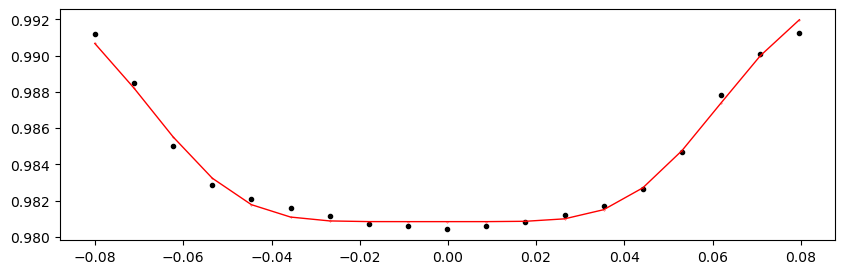

55304.531064636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.22it/s]


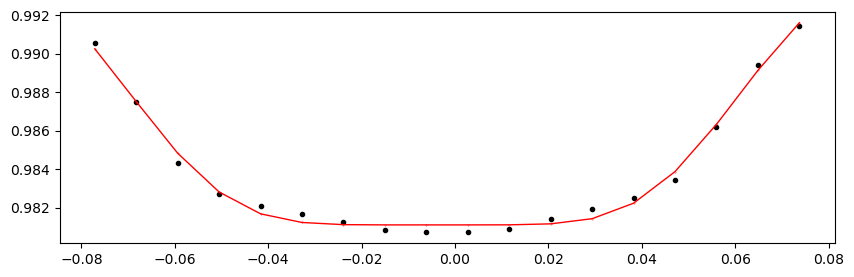

55306.833434636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.29it/s]


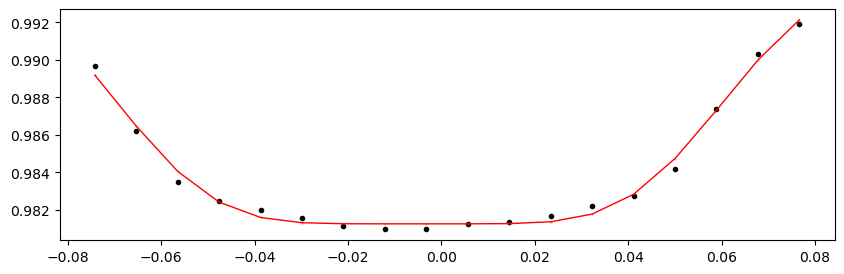

55309.135804636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.06it/s]


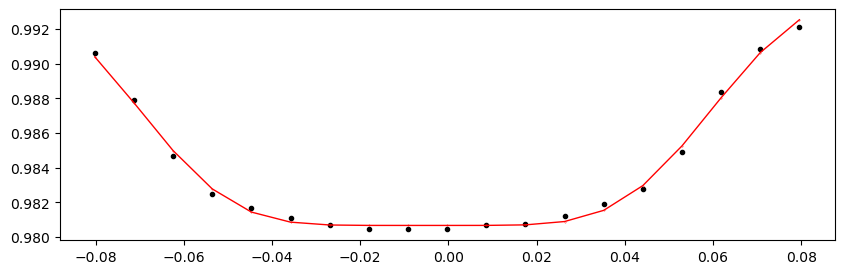

55311.438174636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.28it/s]


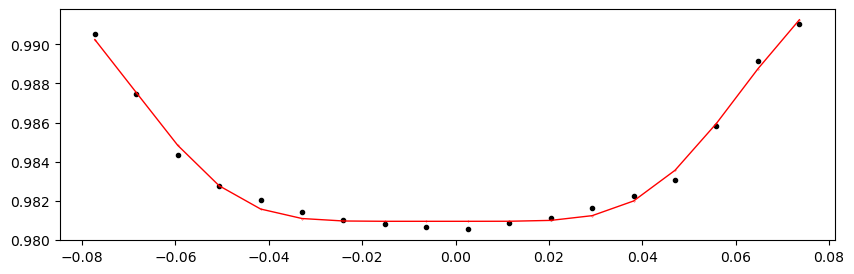

55313.740544636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.75it/s]


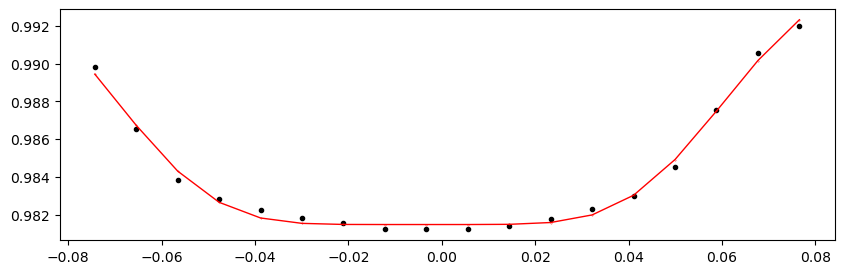

55316.042914636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.60it/s]


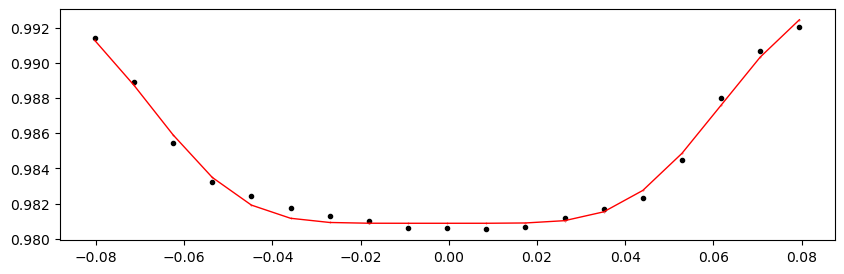

55318.345284636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.94it/s]


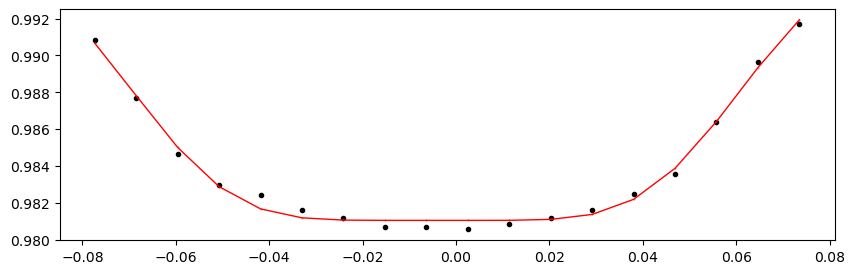

55320.647654636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.68it/s]


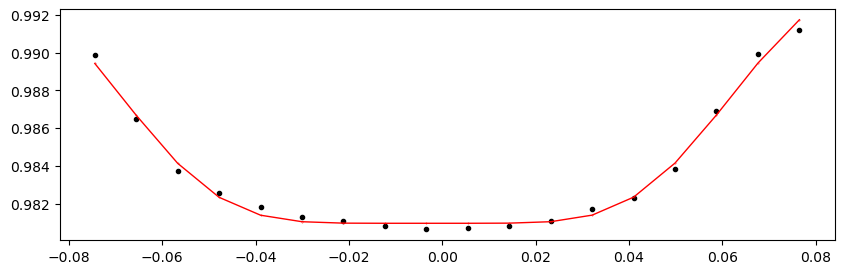

55322.950024636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.12it/s]


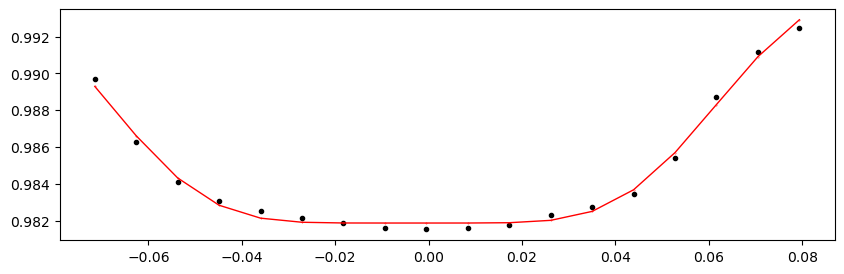

55325.252394636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.39it/s]


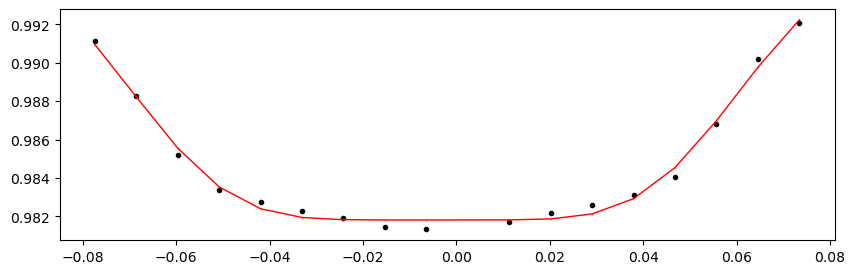

55327.554764636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.31it/s]


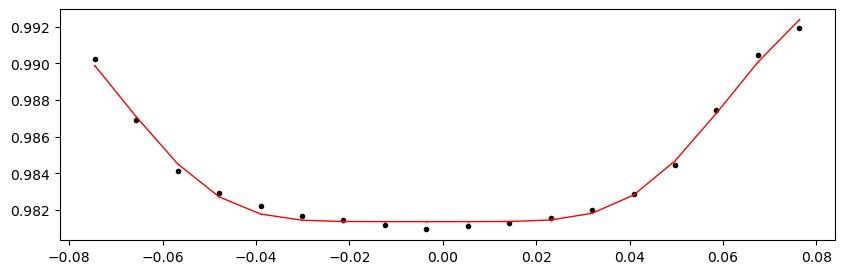

55329.857134636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.18it/s]


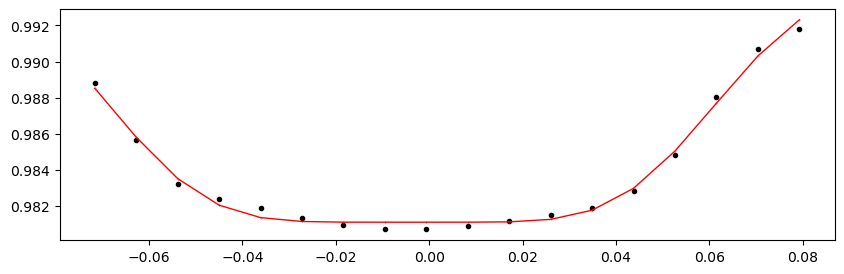

55332.159504636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.97it/s]


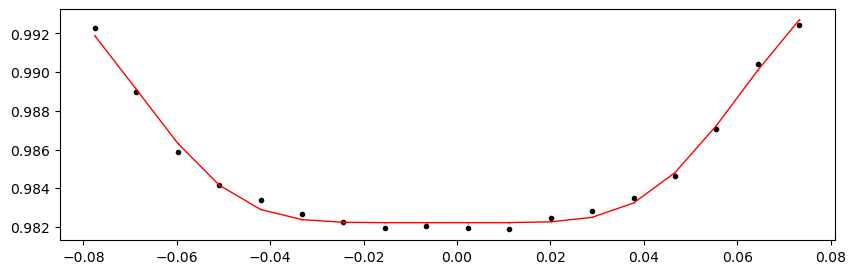

55334.461874636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.28it/s]


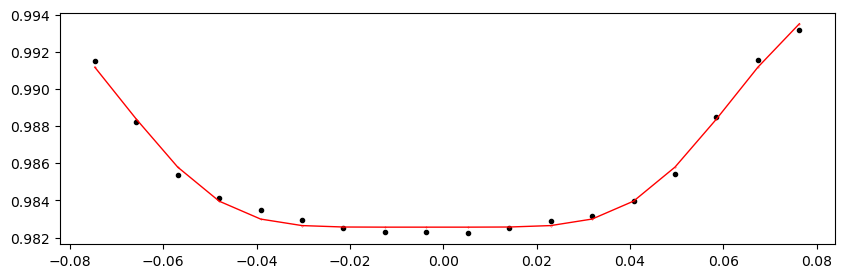

55339.066614636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.84it/s]


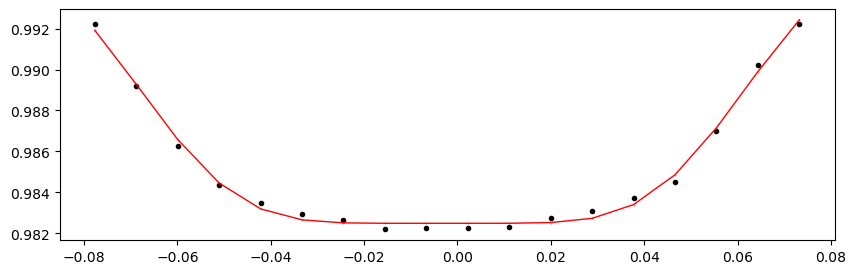

55341.368984636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.79it/s]


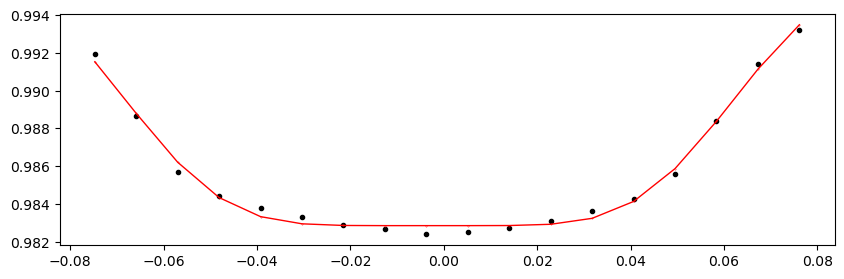

55343.671354636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.76it/s]


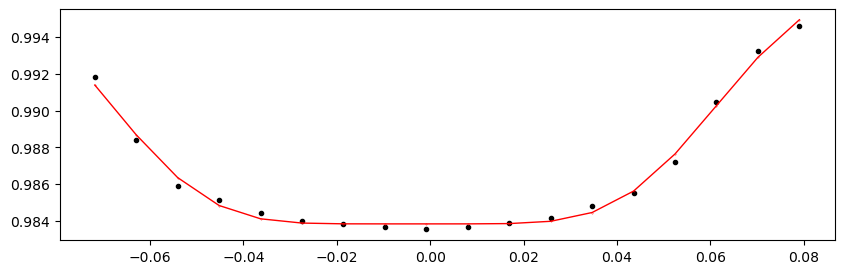

55345.973724636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.04it/s]


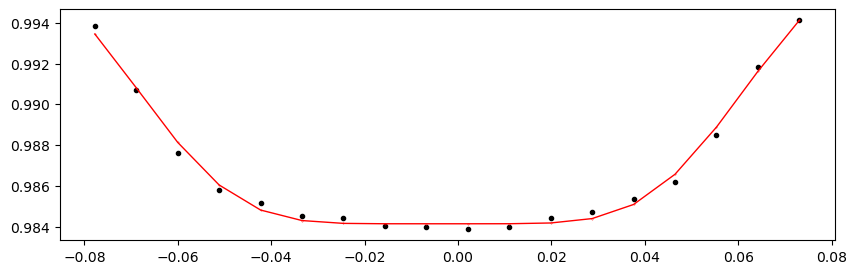

55348.276094636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.25it/s]


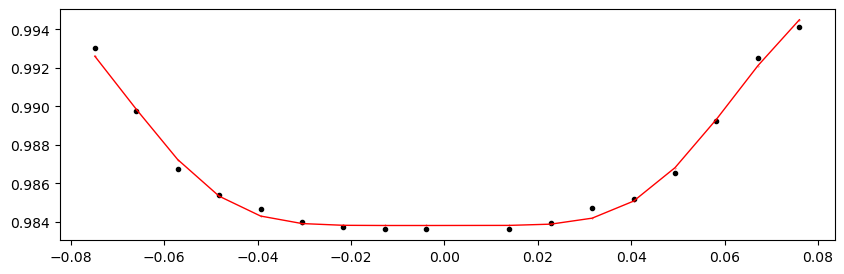

55350.578464636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.66it/s]


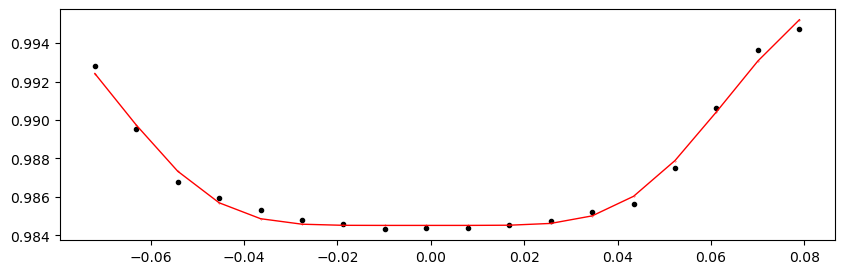

55352.880834636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.23it/s]


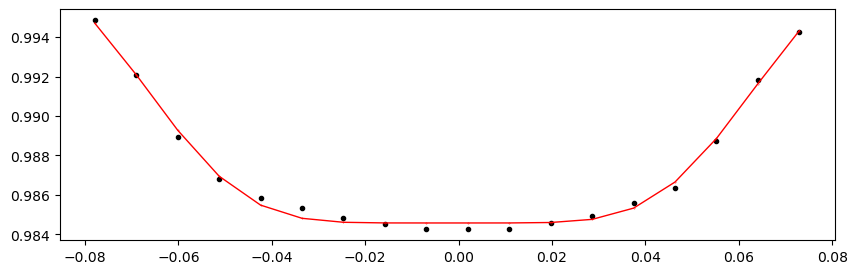

55355.183204636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.83it/s]


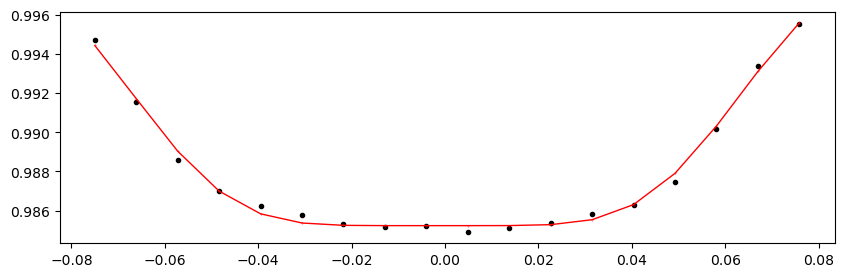

55357.485574636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.11it/s]


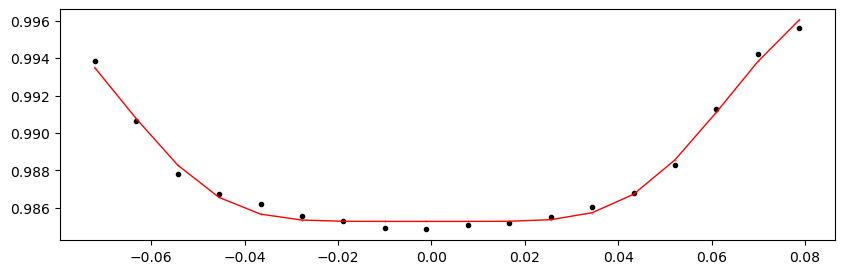

55359.787944636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.65it/s]


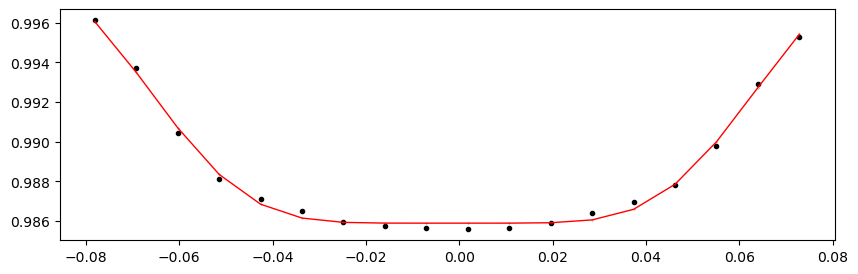

55362.090314636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.83it/s]


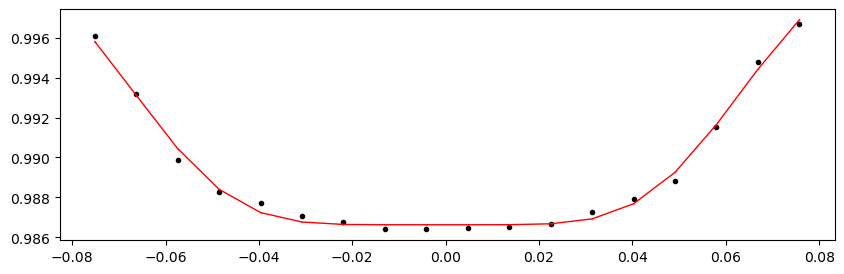

55364.392684636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.49it/s]


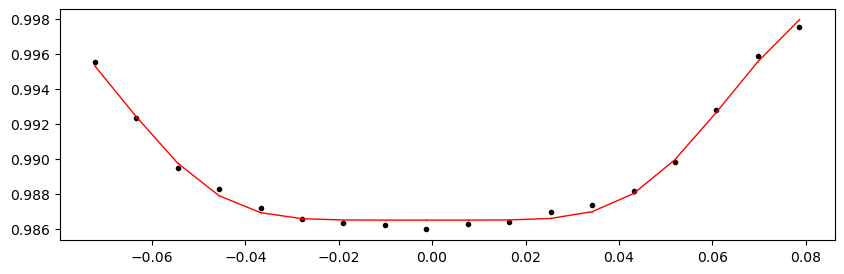

55366.695054636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.65it/s]


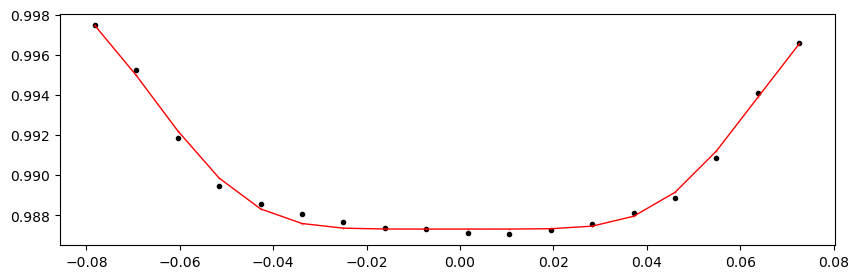

55368.997424636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.99it/s]


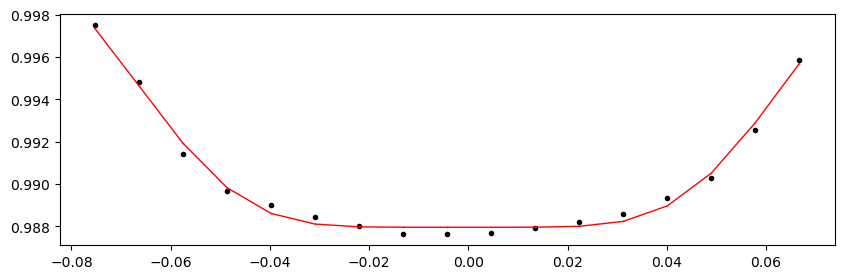

55373.602164636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.80it/s]


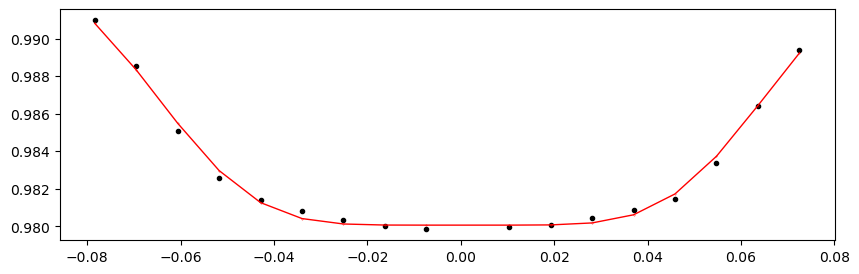

55375.904534636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.48it/s]


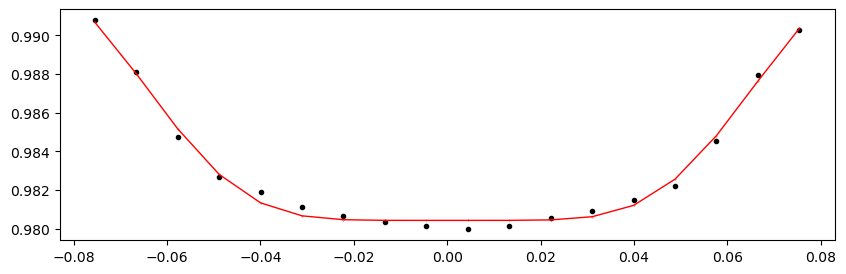

55378.206904636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.26it/s]


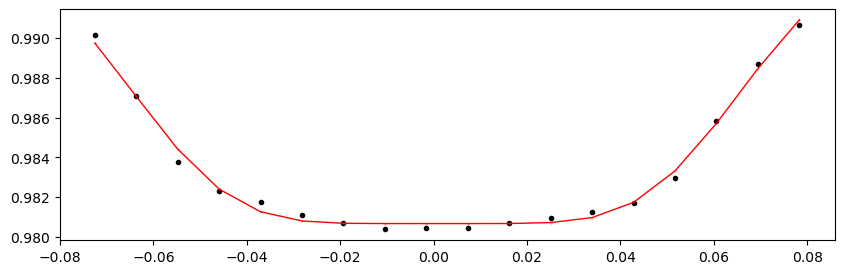

55380.509274636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.52it/s]


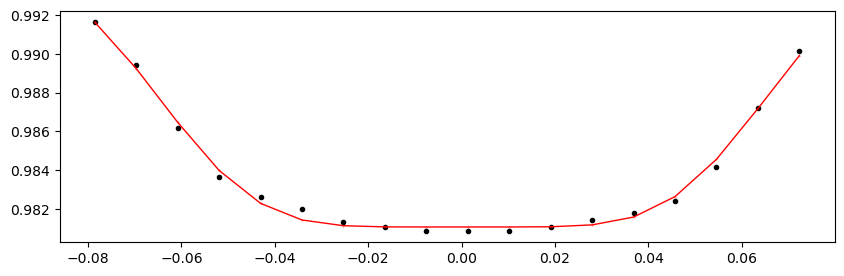

55382.811644636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.33it/s]


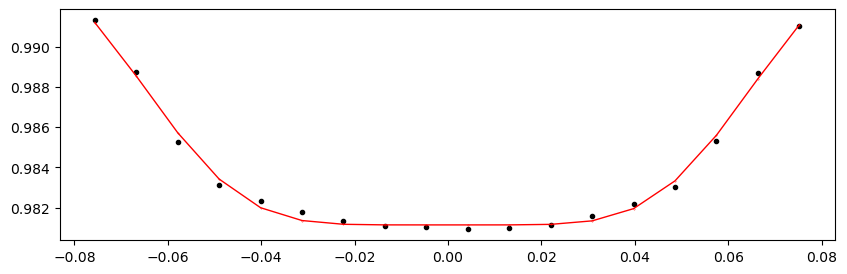

55385.114014636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.27it/s]


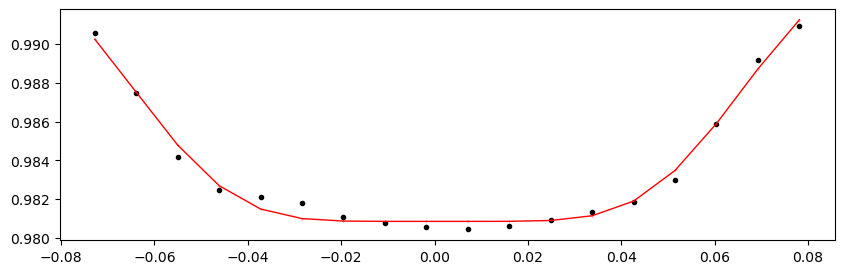

55387.416384636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.07it/s]


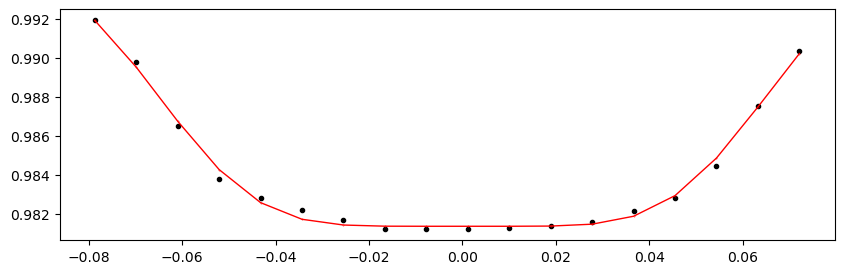

55389.718754636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.30it/s]


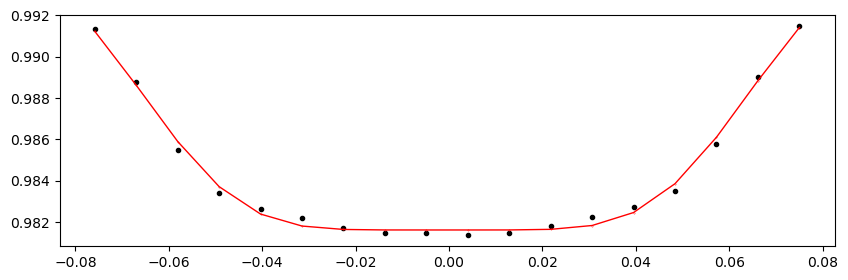

55392.021124636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.00it/s]


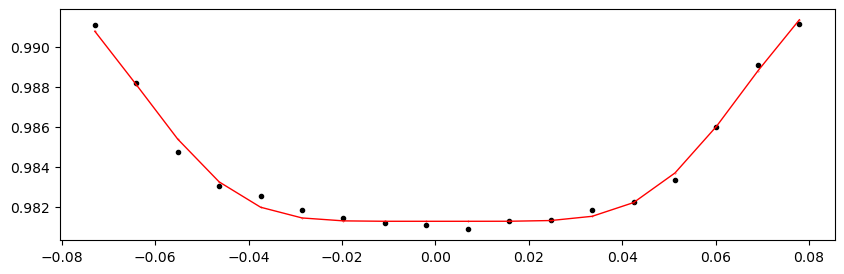

55394.323494636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.28it/s]


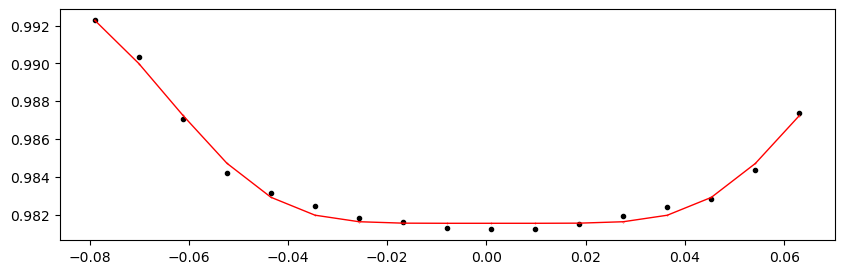

55396.625864636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.43it/s]


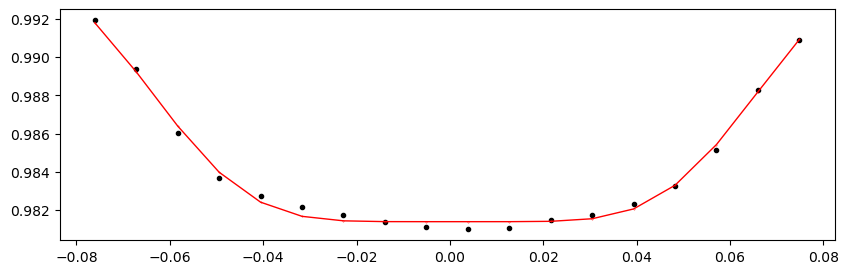

55398.928234636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.08it/s]


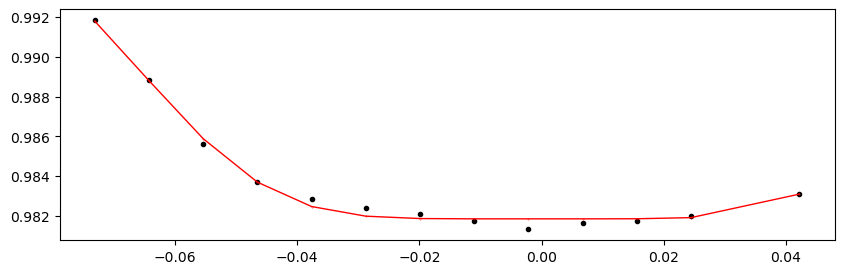

55401.230604636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.40it/s]


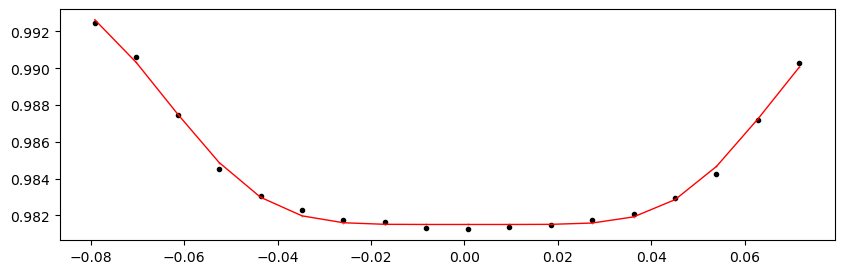

55403.532974636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.65it/s]


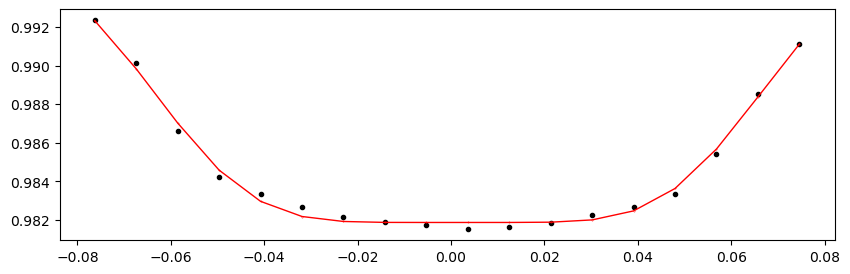

55405.835344636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.18it/s]


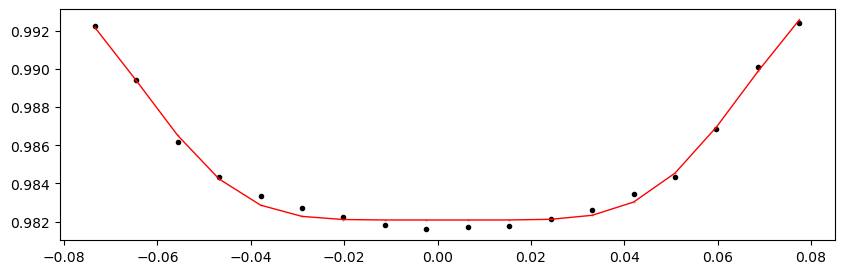

55408.137714636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.85it/s]


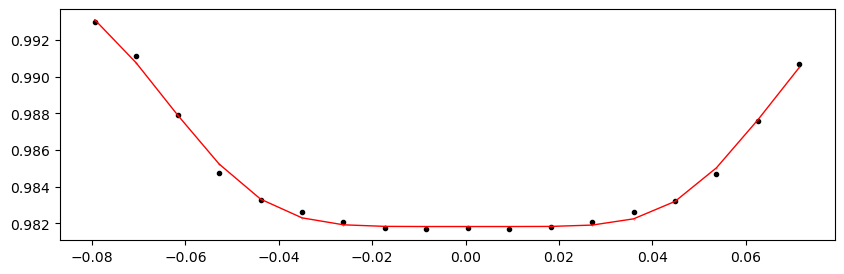

55410.440084636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.36it/s]


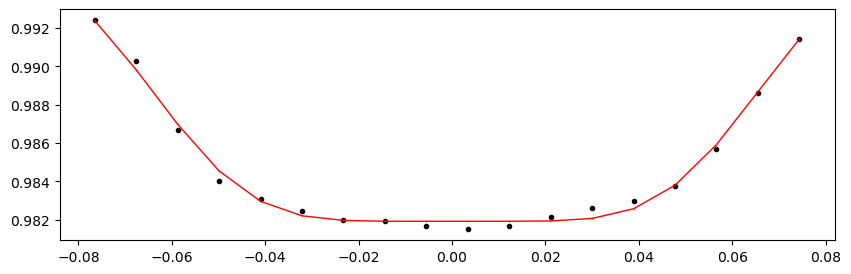

55412.742454636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.30it/s]


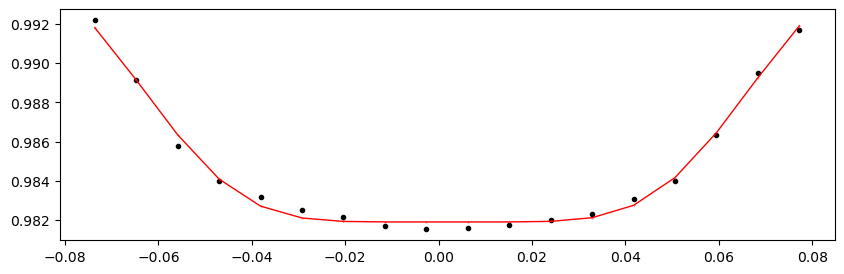

55415.044824636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.43it/s]


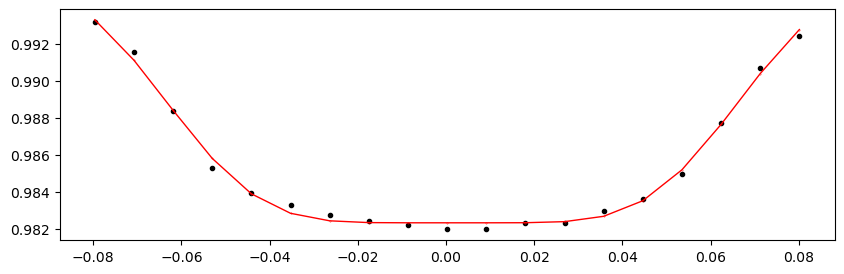

55417.347194636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.10it/s]


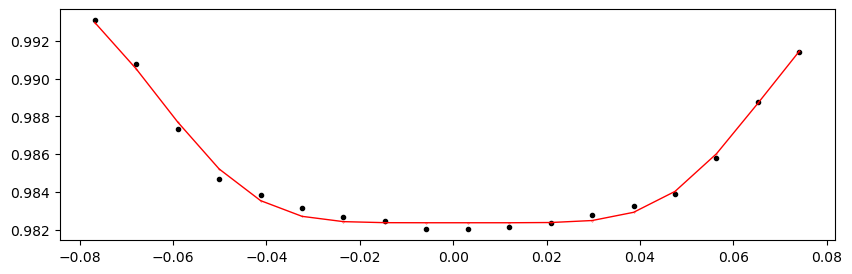

55419.649564636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.39it/s]


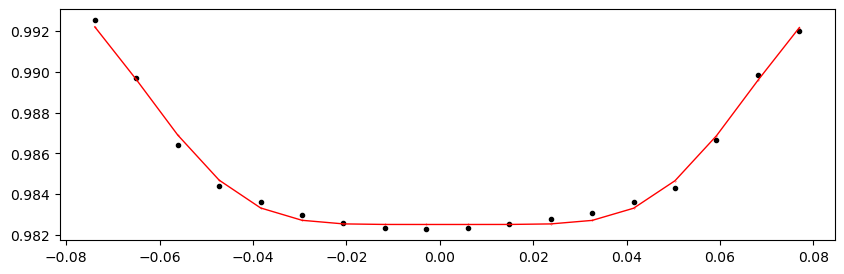

55421.951934636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.39it/s]


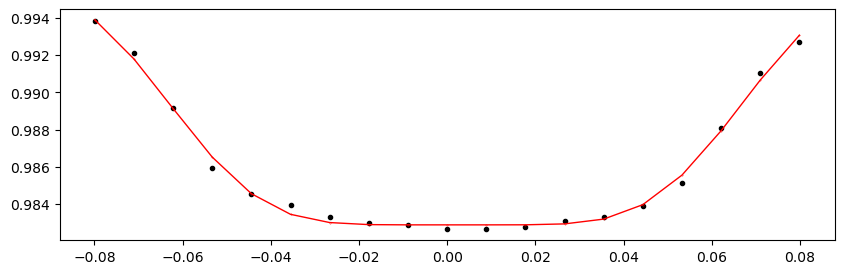

55424.254304636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.39it/s]


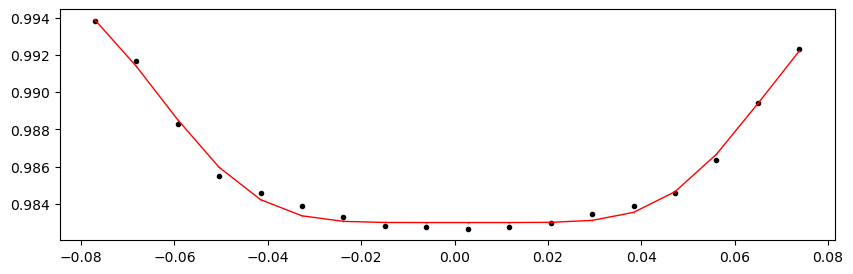

55426.556674636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.29it/s]


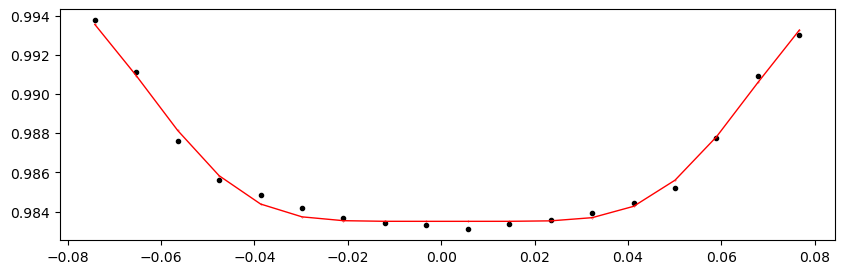

55428.859044636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.46it/s]


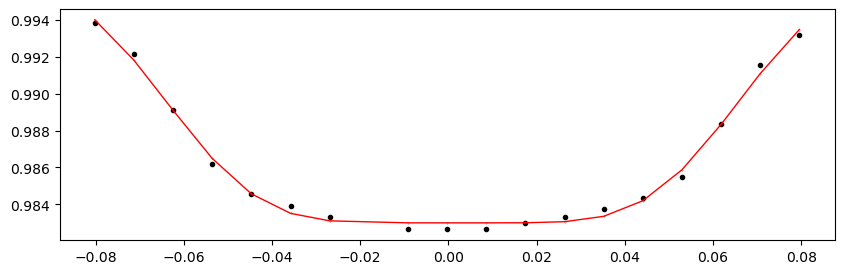

55433.463784636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.50it/s]


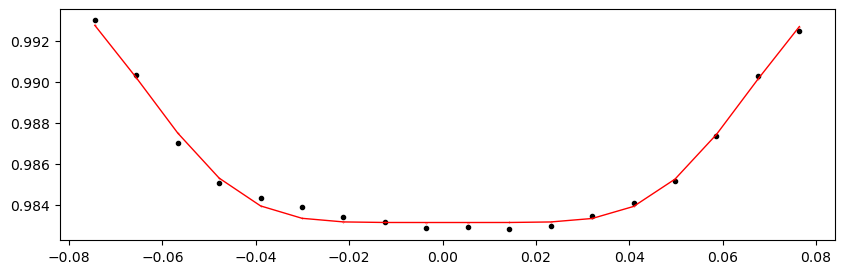

55435.766154636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.40it/s]


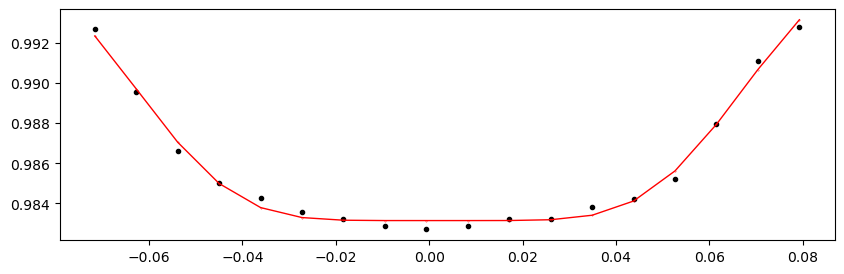

55438.068524636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.74it/s]


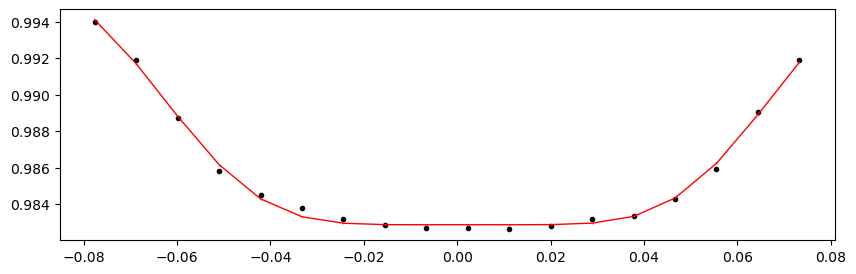

55440.370894636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.47it/s]


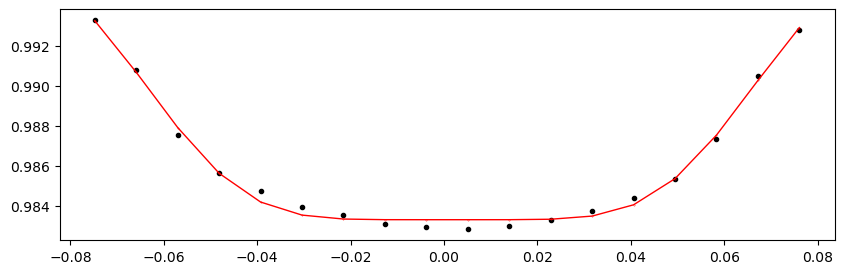

55442.673264636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.62it/s]


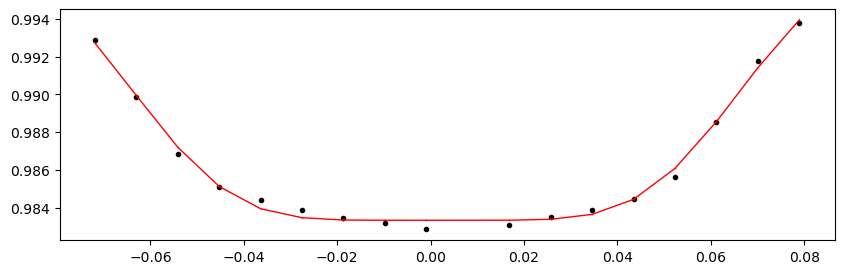

55444.975634636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.45it/s]


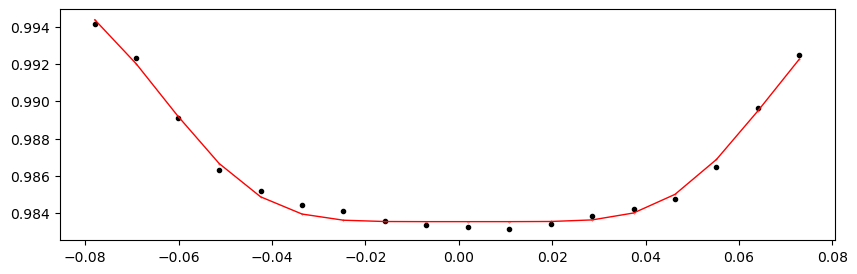

55447.278004636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.22it/s]


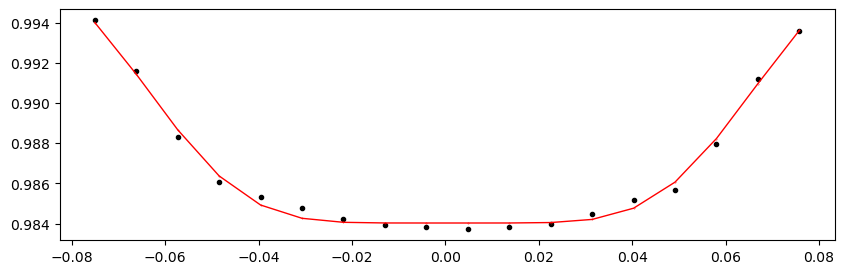

55449.580374636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.36it/s]


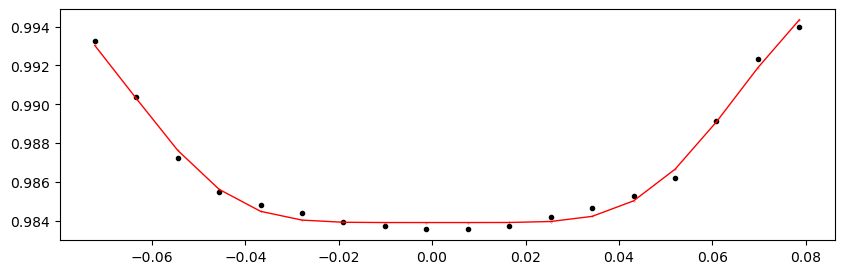

55451.882744636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.72it/s]


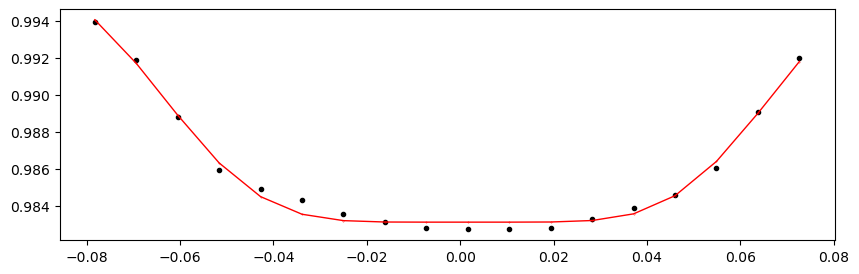

55454.185114636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.76it/s]


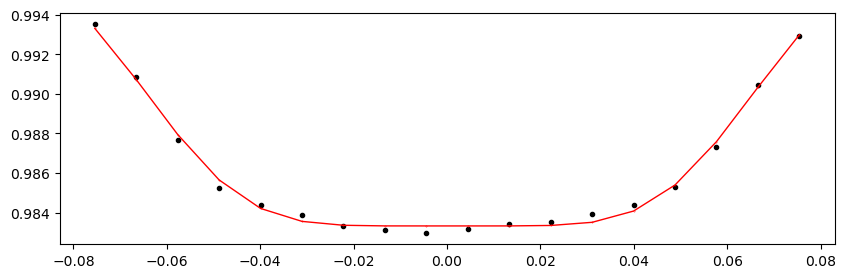

55456.487484636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.79it/s]


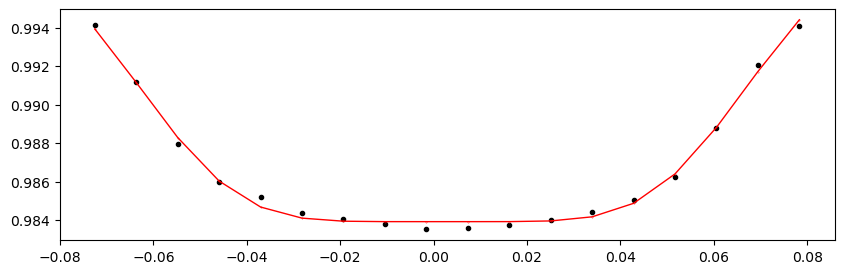

55458.789854636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.28it/s]


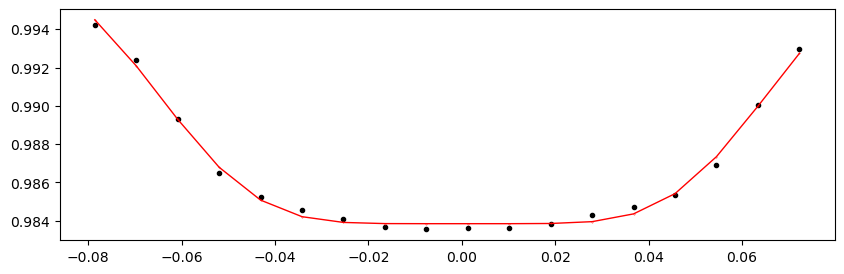

55461.092224636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.87it/s]


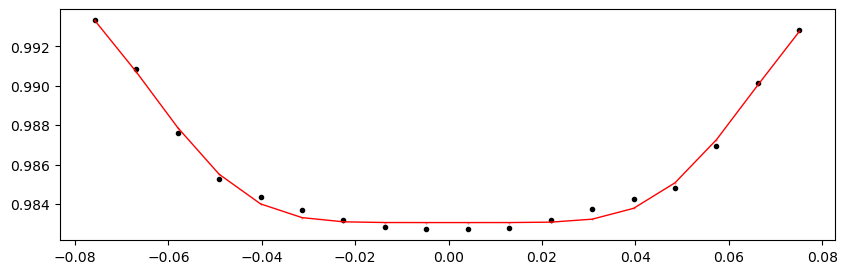

55463.394594636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.98it/s]


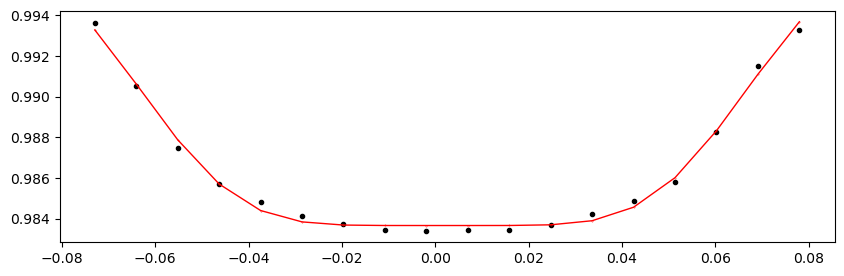

55465.696964636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.72it/s]


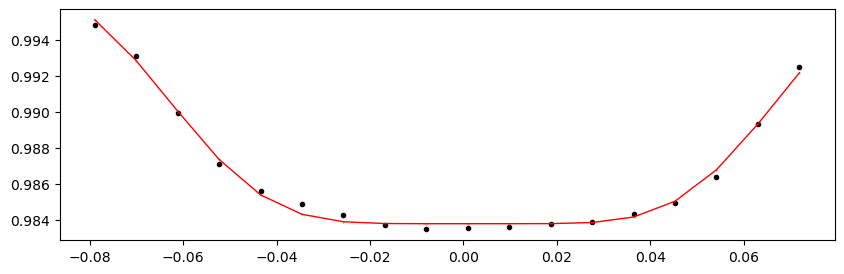

55467.999334636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.31it/s]


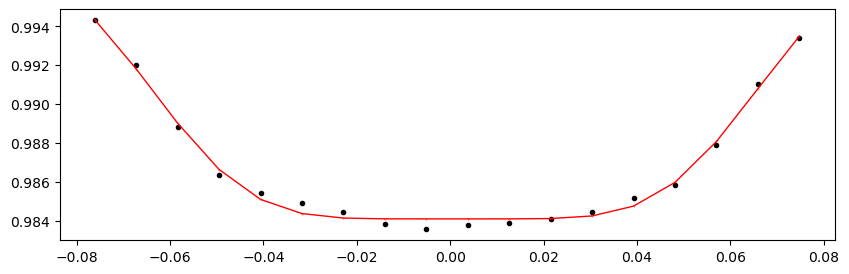

55470.301704636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.77it/s]


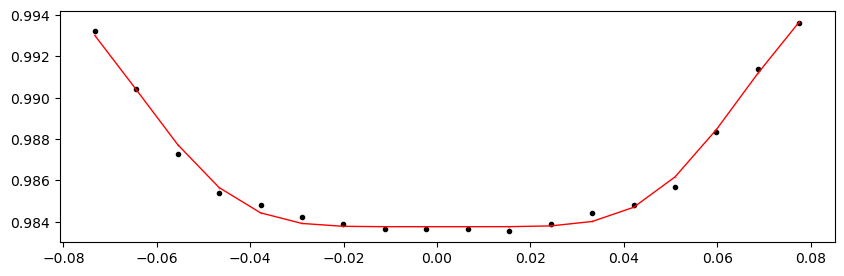

55472.604074636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.43it/s]


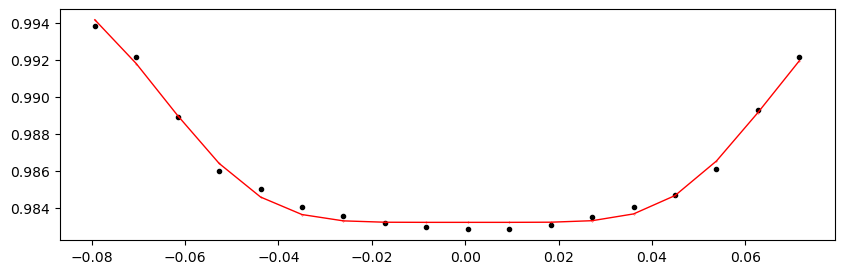

55474.906444636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.55it/s]


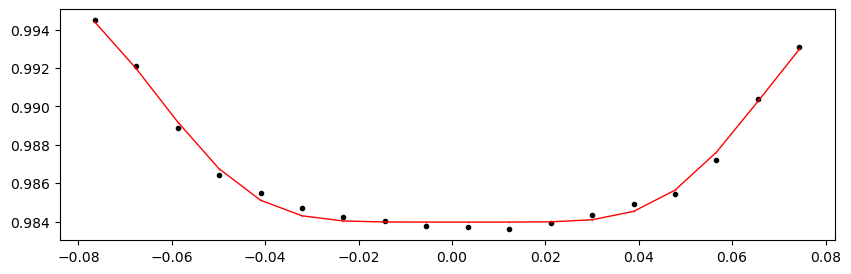

55477.208814636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.96it/s]


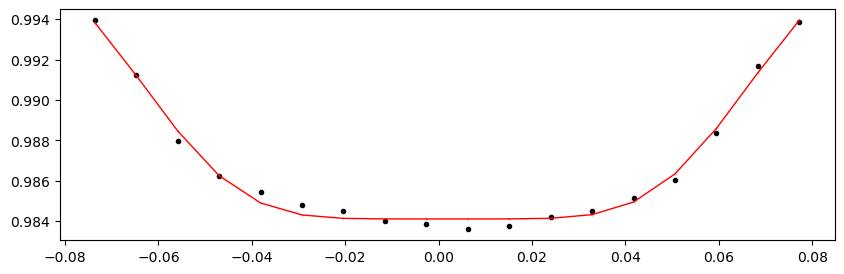

55479.511184636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.94it/s]


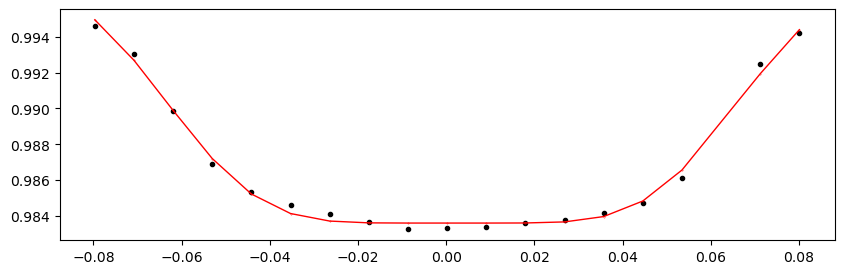

55481.813554636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.15it/s]


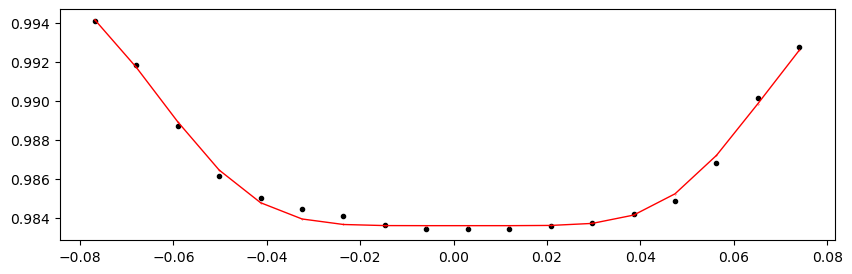

55484.115924636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.48it/s]


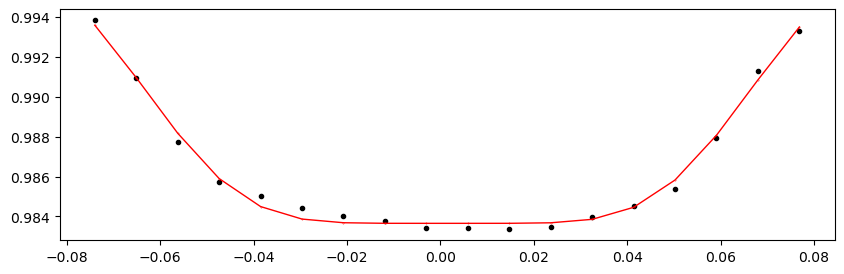

55486.418294636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.52it/s]


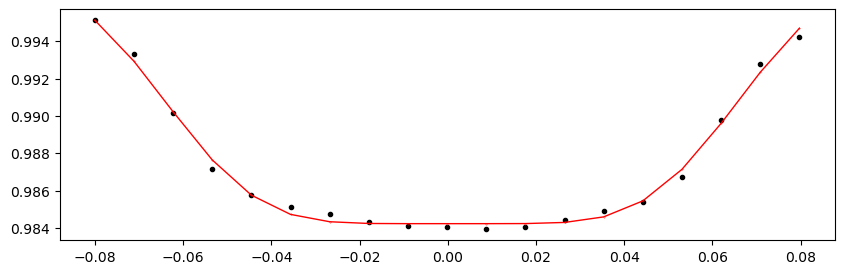

55488.720664636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.97it/s]


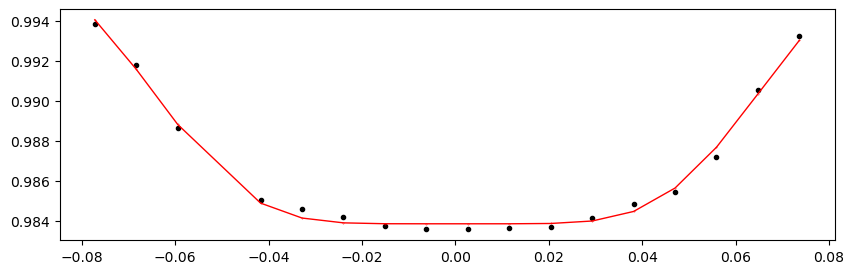

55491.023034636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.05it/s]


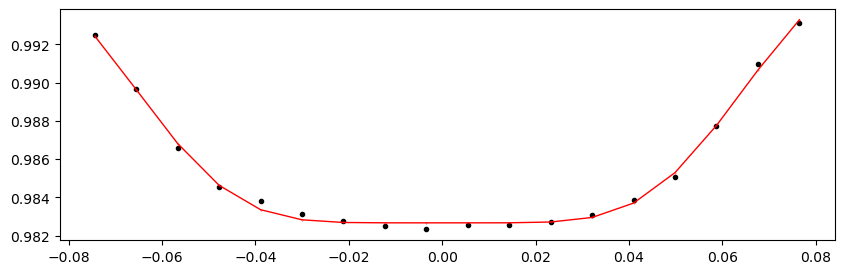

55495.627774636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.33it/s]


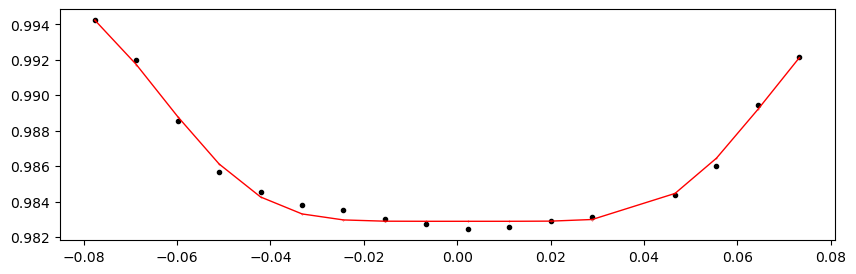

55497.930144636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.76it/s]


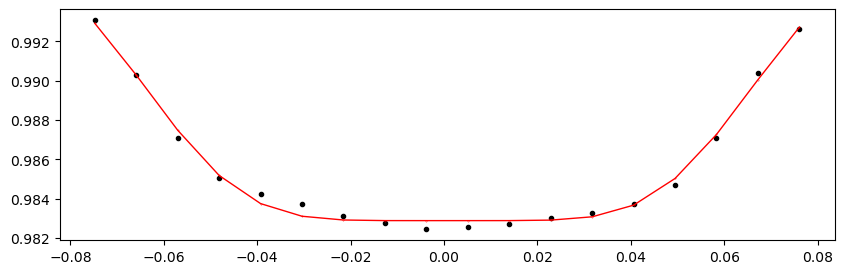

55500.232514636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.82it/s]


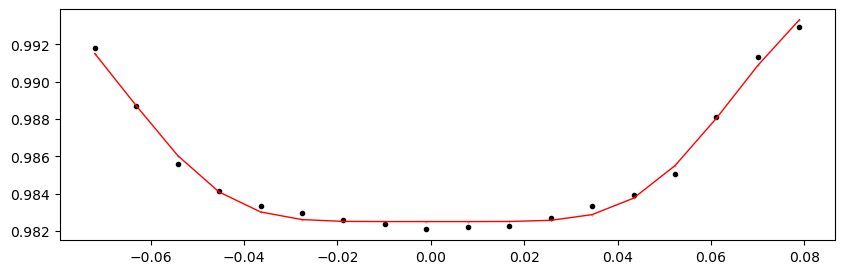

55502.534884636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.51it/s]


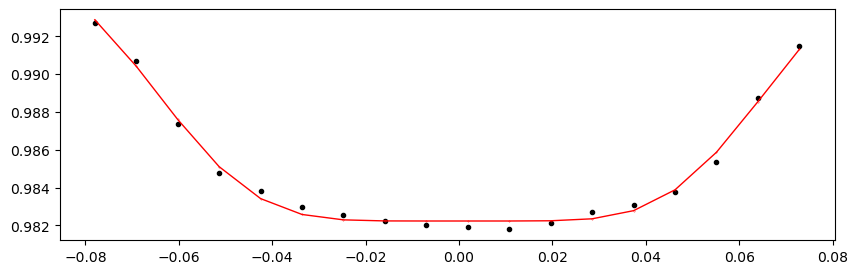

55504.837254636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.45it/s]


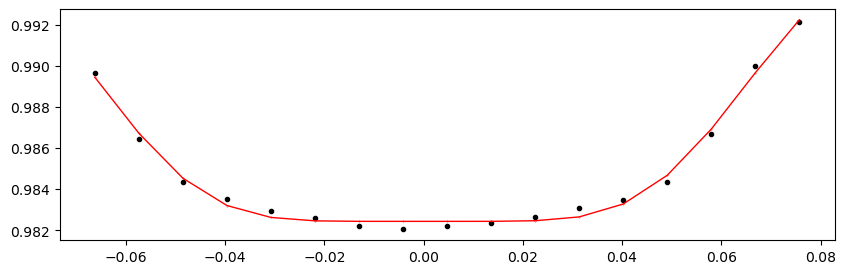

55507.139624636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.75it/s]


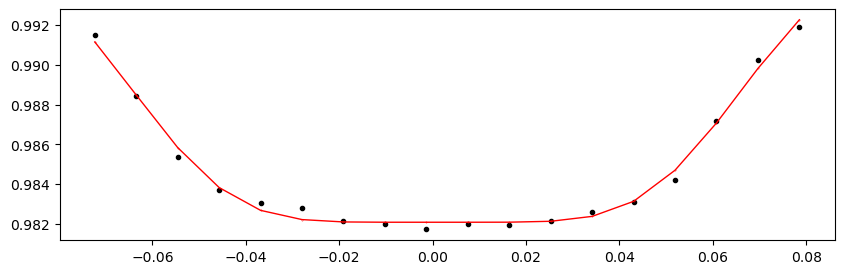

55509.441994636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.87it/s]


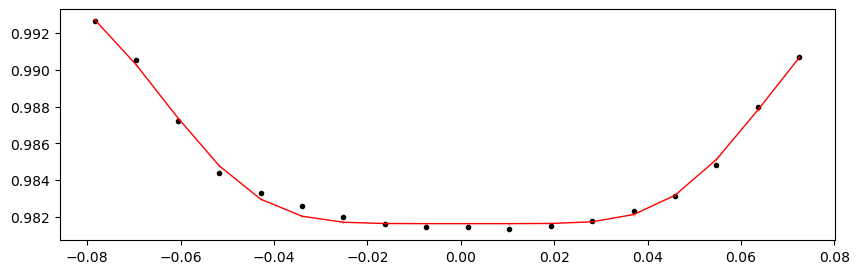

55511.744364636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.47it/s]


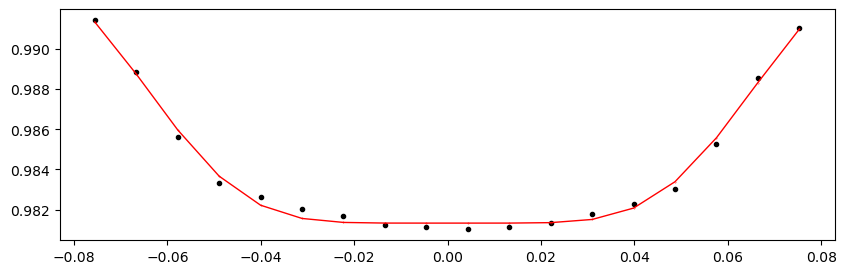

55514.046734636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.36it/s]


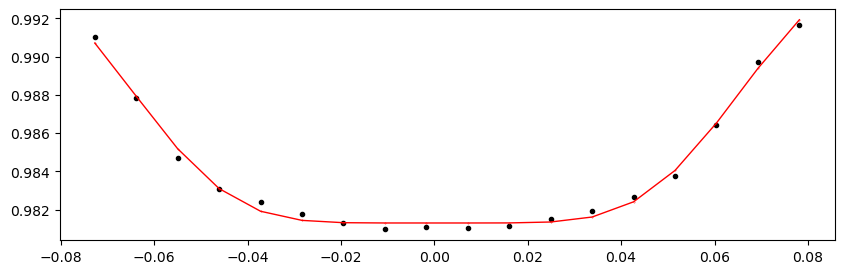

55516.349104636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.12it/s]


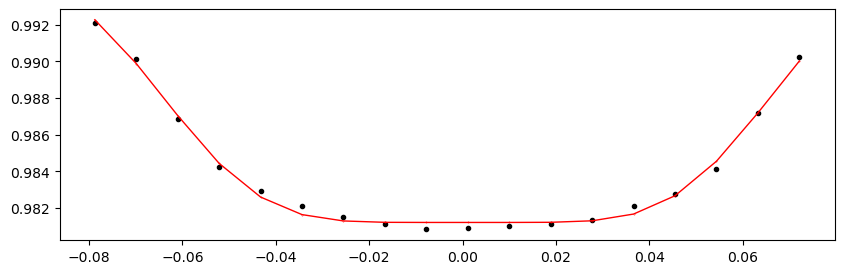

55518.651474636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.04it/s]


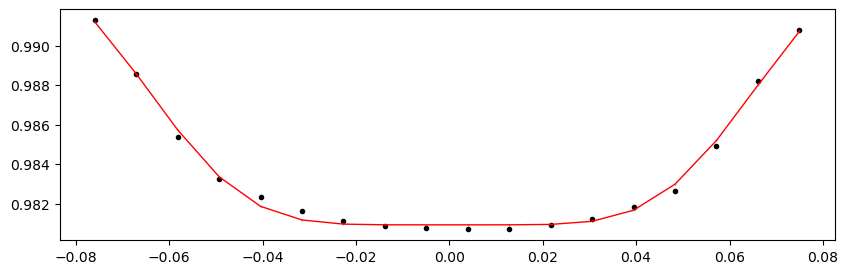

55520.953844636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.21it/s]


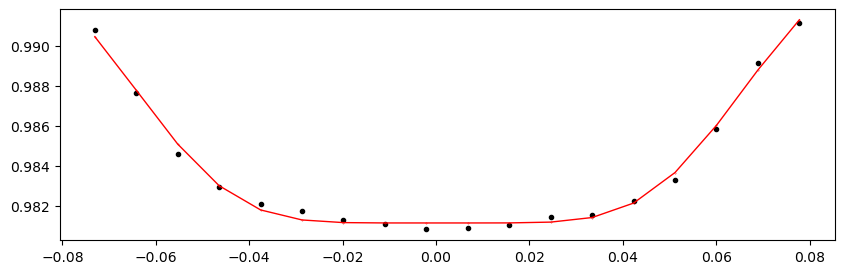

55525.558584636005 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.04it/s]


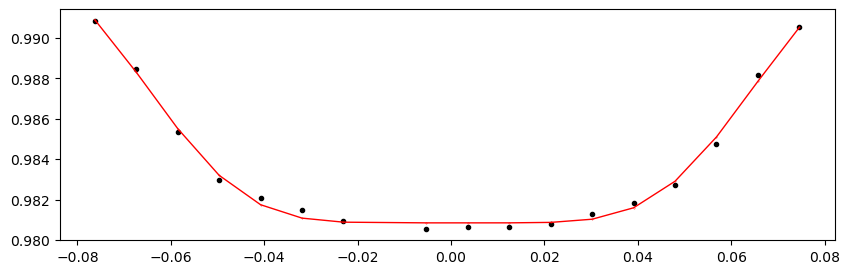

55527.860954636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.51it/s]


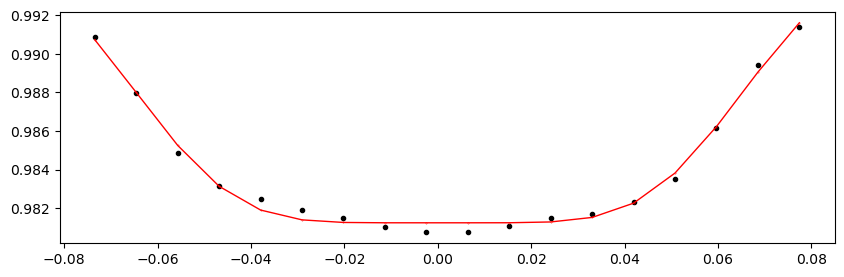

55530.163324636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.65it/s]


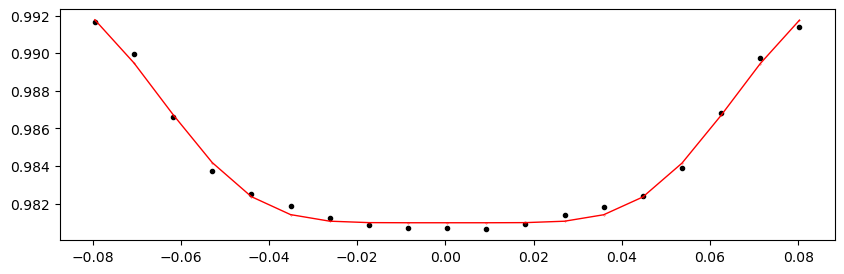

55532.465694636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.11it/s]


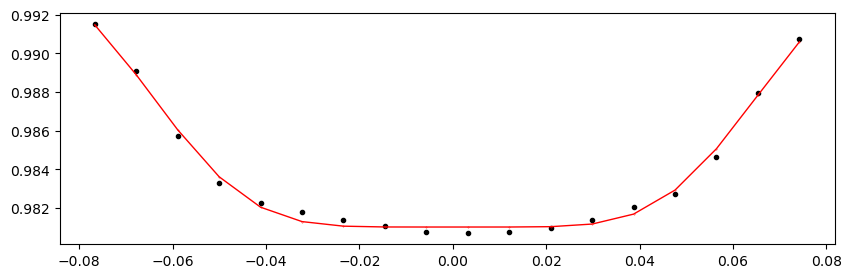

55534.768064636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.77it/s]


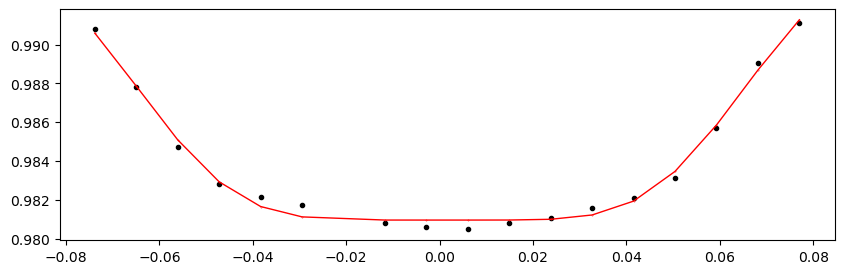

55537.070434636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.30it/s]


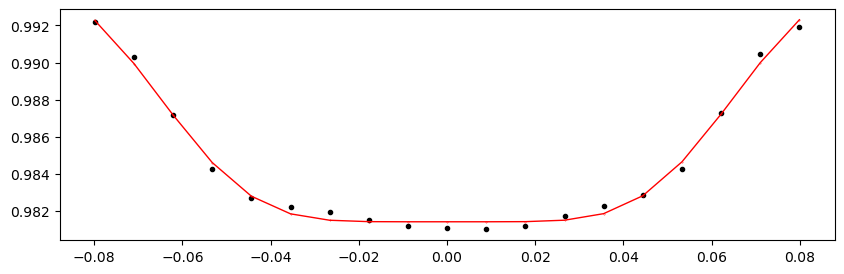

55539.372804636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.97it/s]


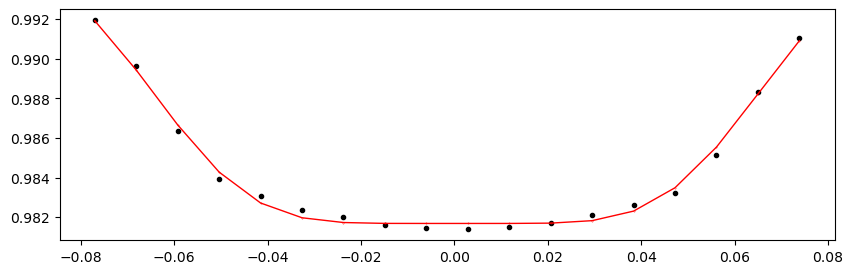

55541.675174636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.23it/s]


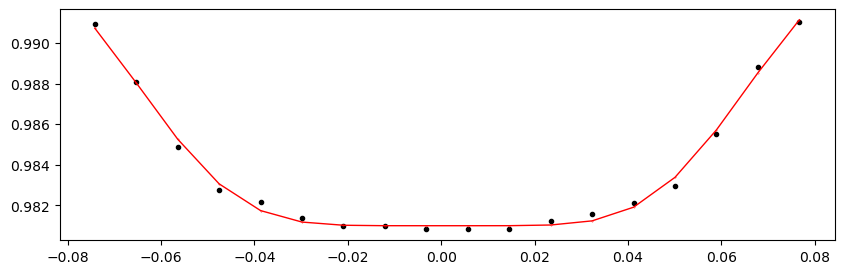

55546.279914636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.57it/s]


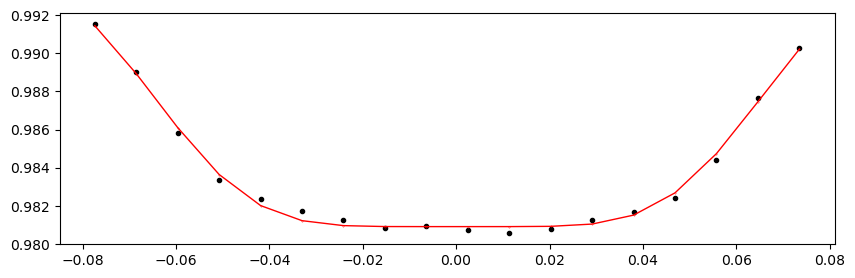

55548.582284636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.35it/s]


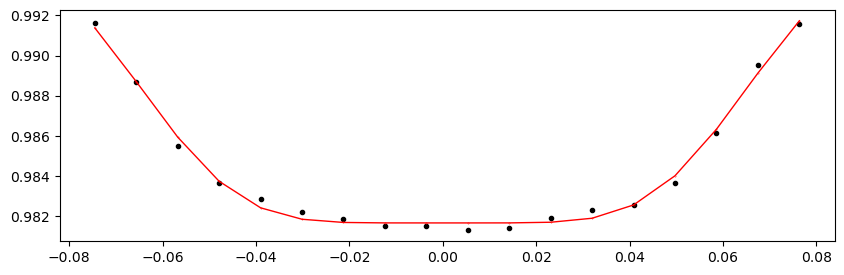

55550.884654636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.48it/s]


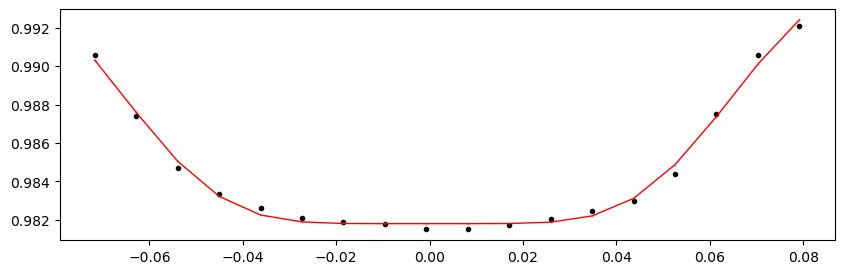

55569.303614636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.95it/s]


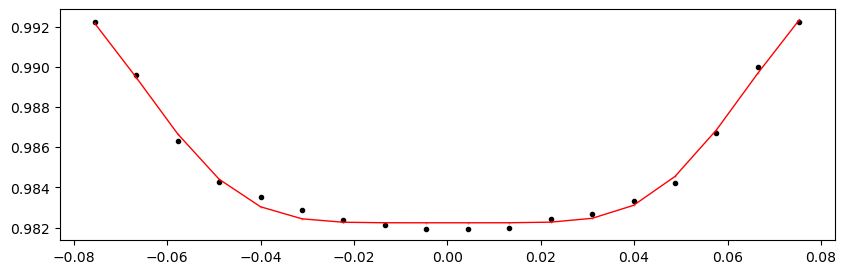

55571.605984636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.61it/s]


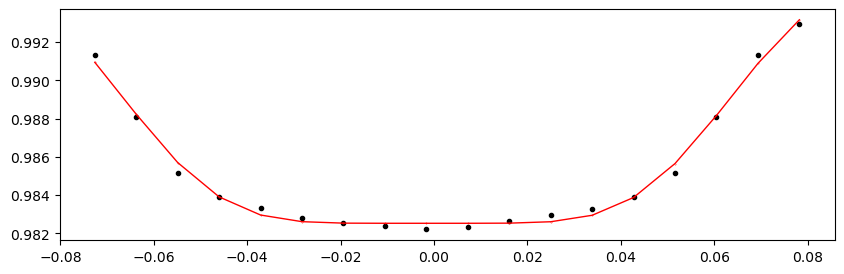

55573.908354636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.92it/s]


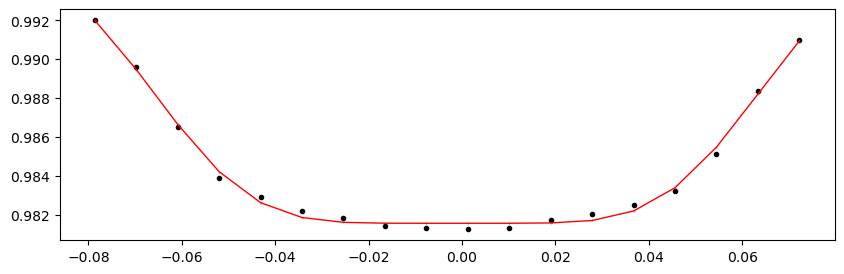

55576.210724636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.84it/s]


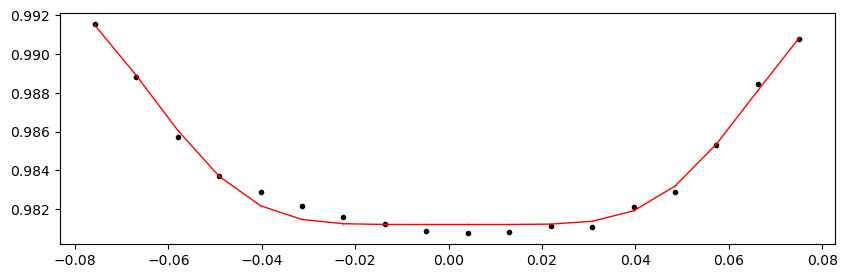

55578.513094636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.95it/s]


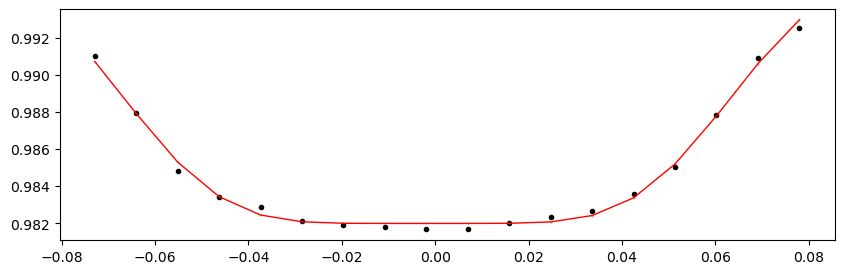

55580.815464636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.23it/s]


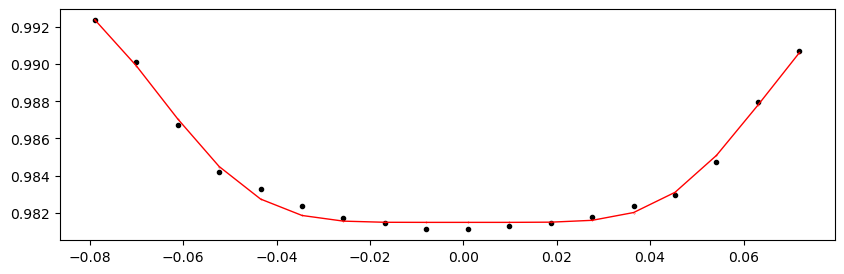

55583.117834636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.26it/s]


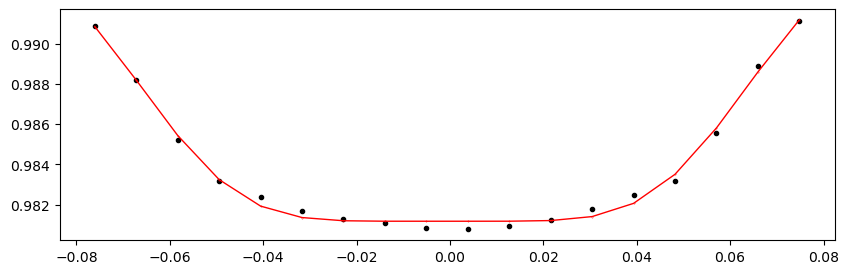

55585.420204636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.36it/s]


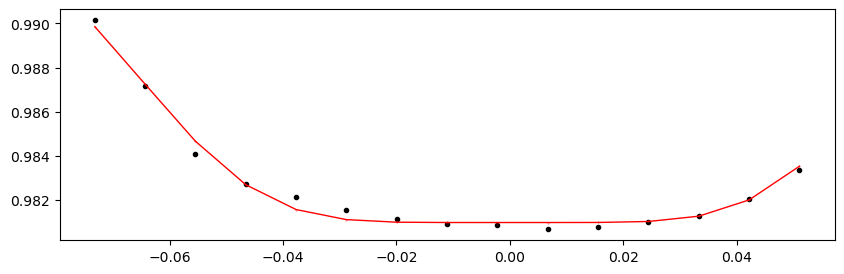

55587.722574636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.64it/s]


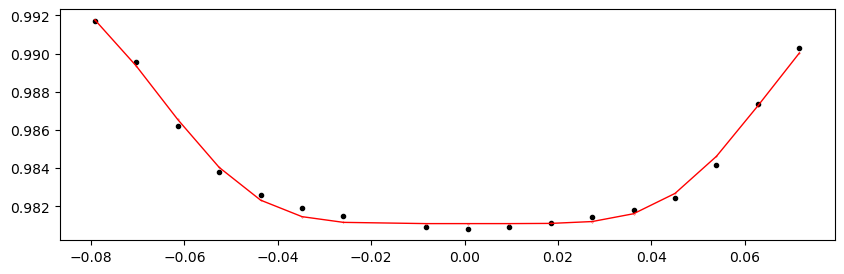

55590.024944636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.08it/s]


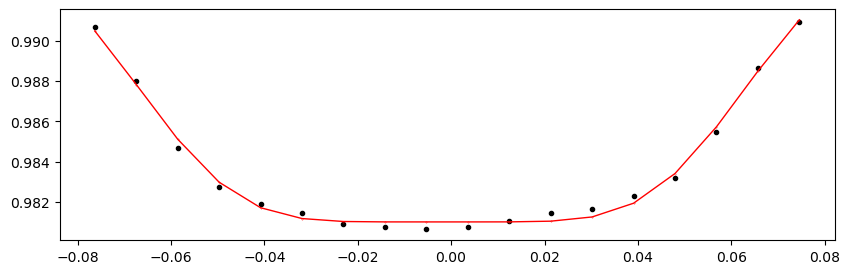

55592.327314636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.82it/s]


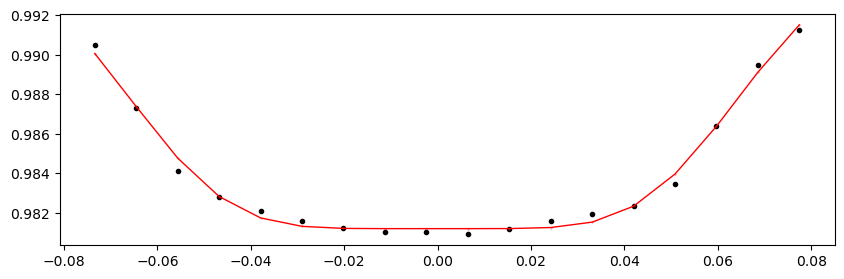

55596.932054636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.69it/s]


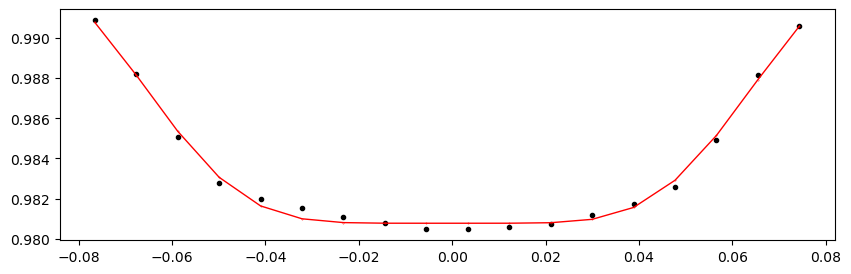

55599.234424636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.24it/s]


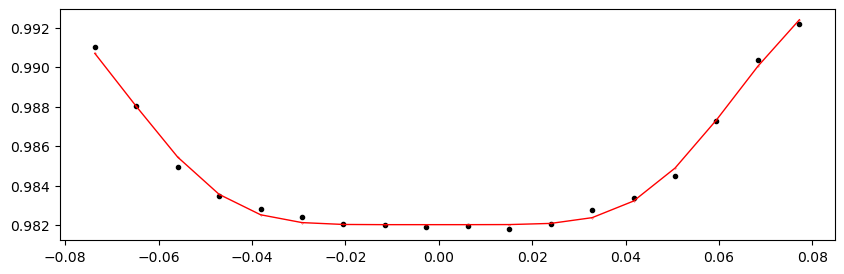

55601.536794636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.80it/s]


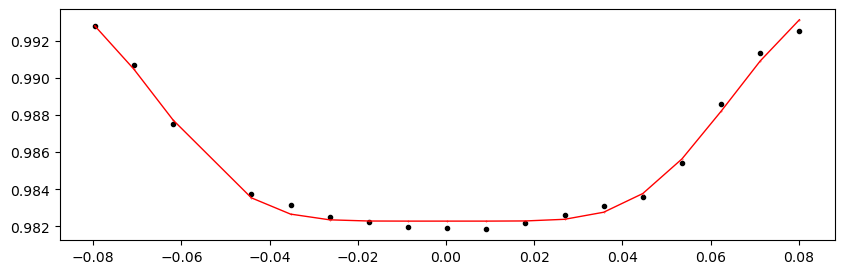

55603.839164636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.97it/s]


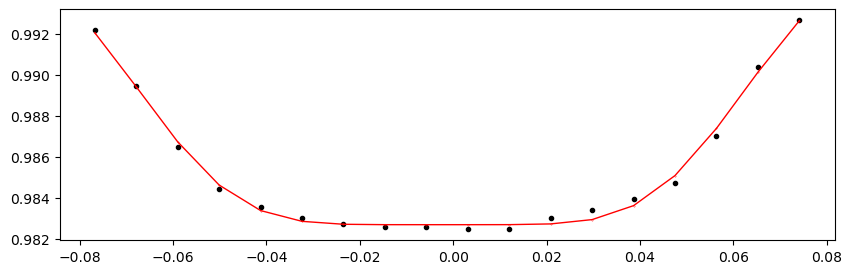

55606.141534636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.66it/s]


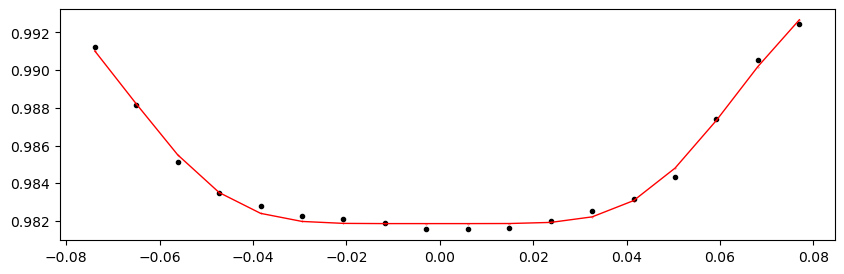

55608.443904636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.61it/s]


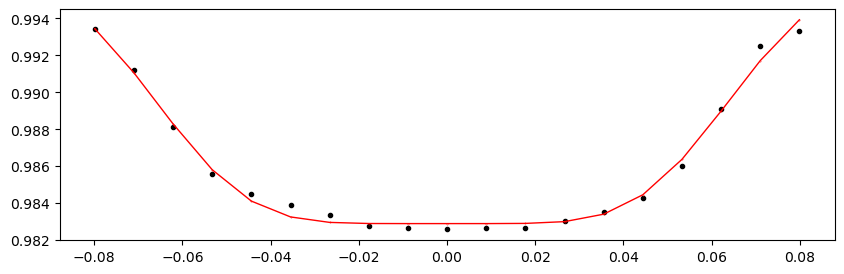

55610.746274636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.76it/s]


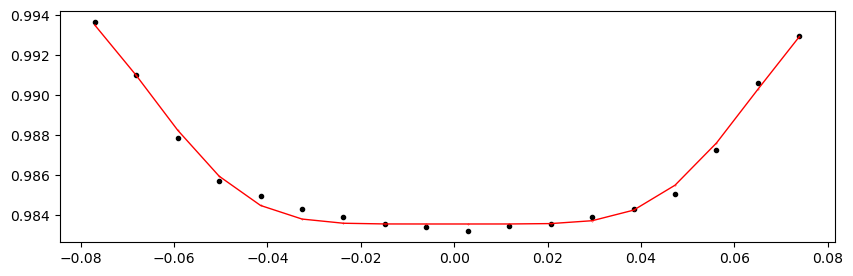

55613.048644636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.61it/s]


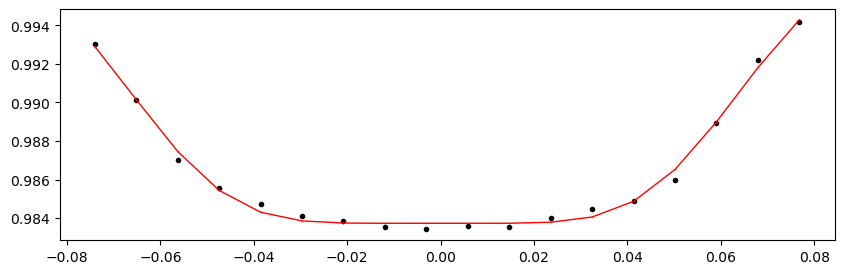

55615.351014636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.93it/s]


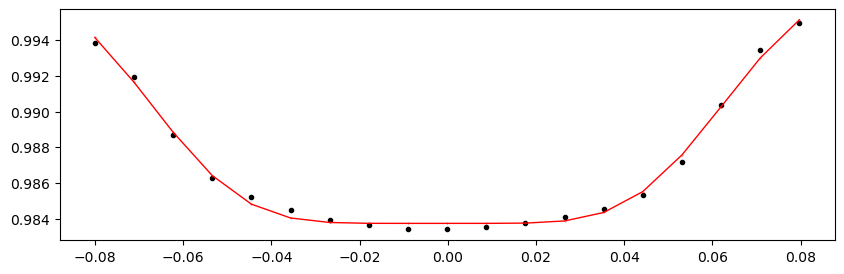

55617.653384636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.13it/s]


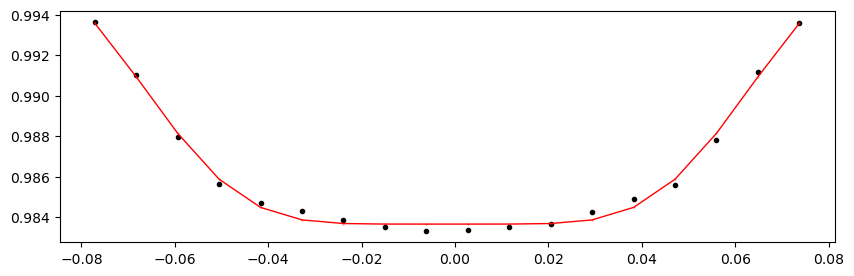

55619.955754636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.00it/s]


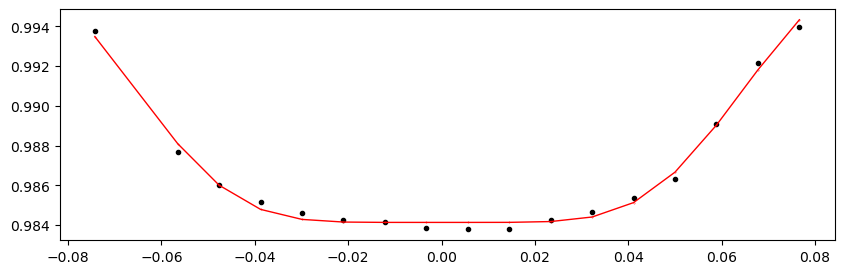

55622.258124636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.17it/s]


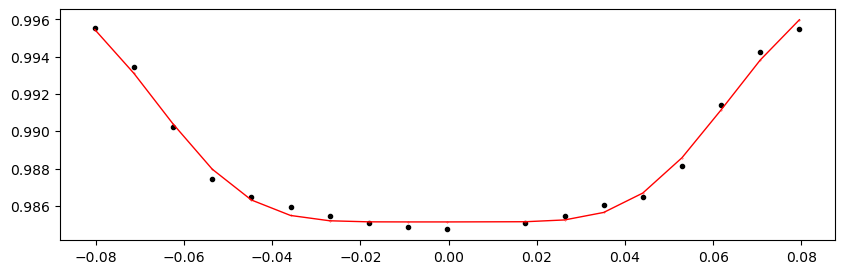

55624.560494636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.36it/s]


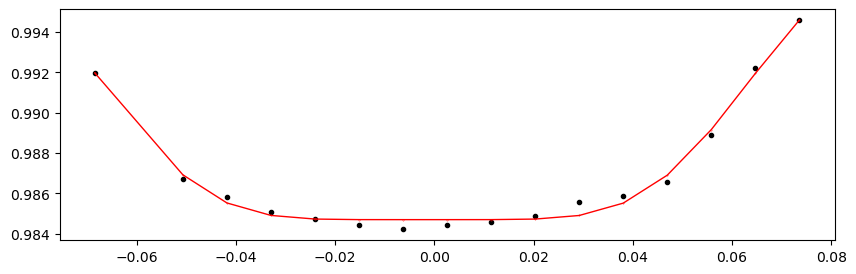

55626.862864636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.89it/s]


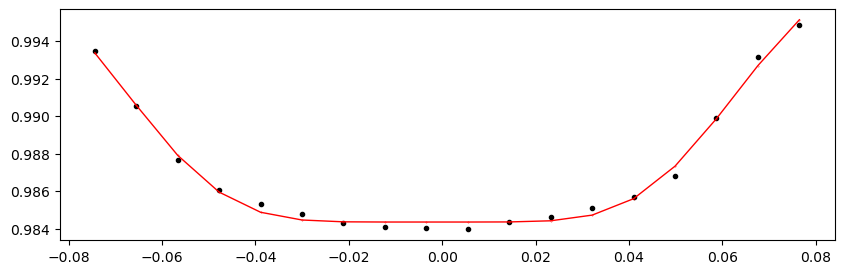

55629.165234636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.06it/s]


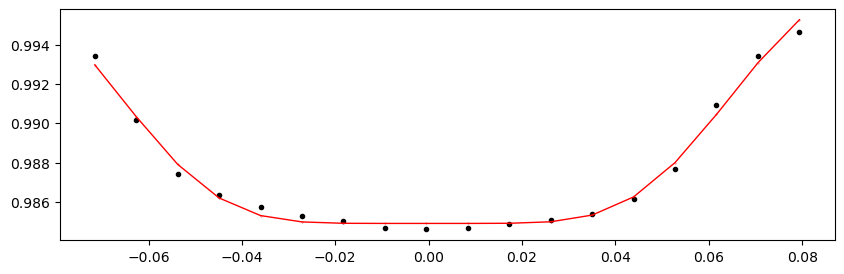

55631.467604636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.83it/s]


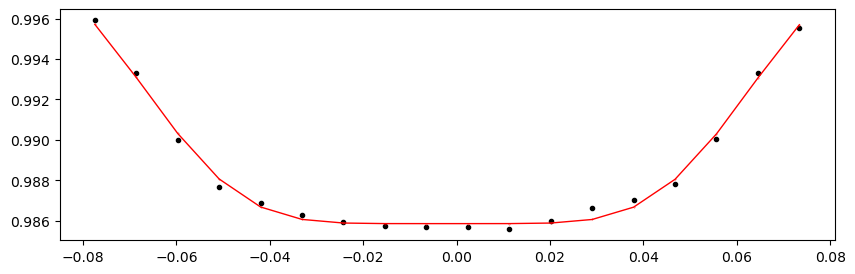

55633.769974636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.42it/s]


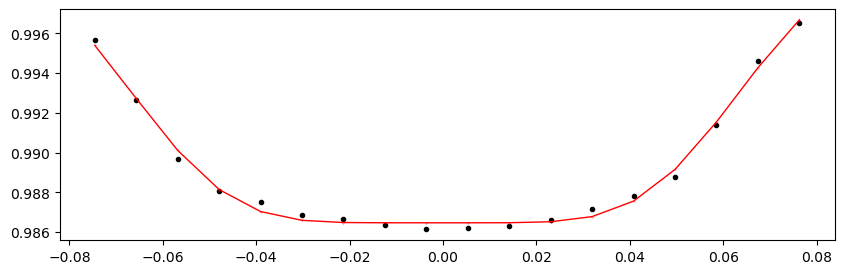

55642.979454636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.59it/s]


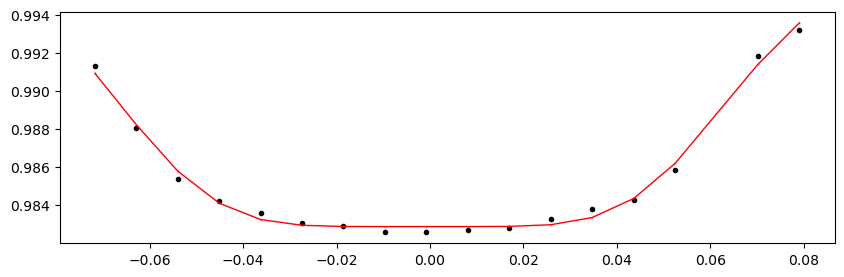

55645.281824636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.57it/s]


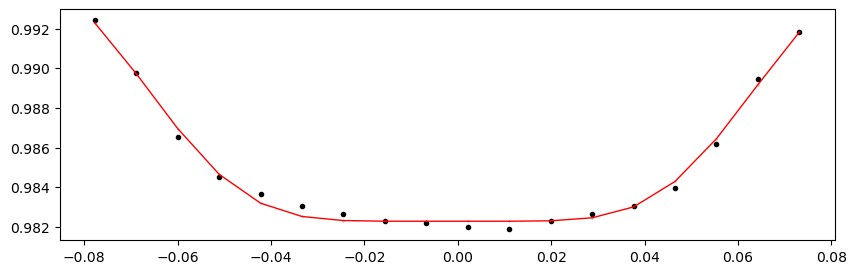

55647.584194636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.30it/s]


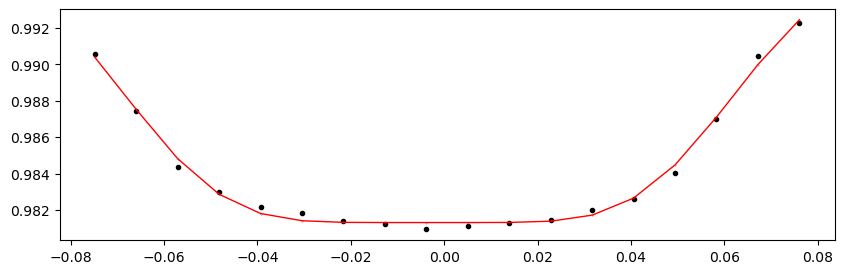

55649.886564636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.58it/s]


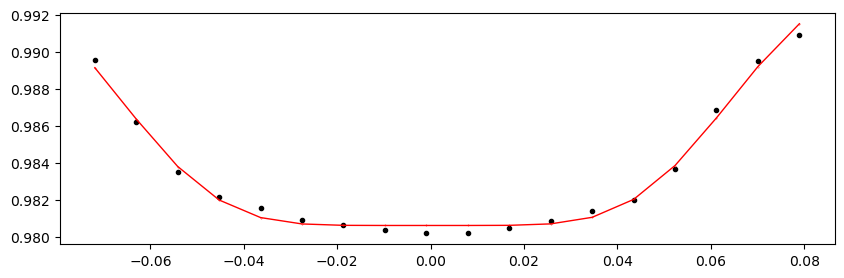

55652.188934636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.34it/s]


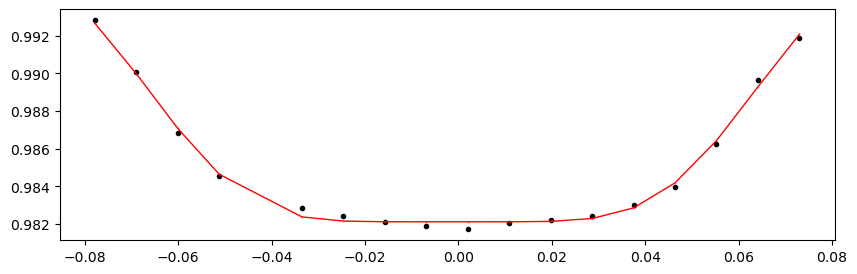

55654.491304636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.81it/s]


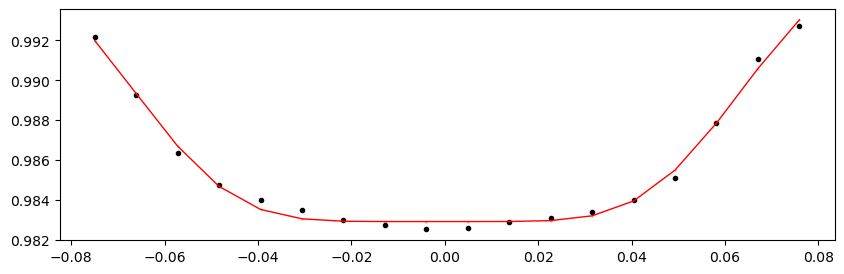

55656.793674636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.16it/s]


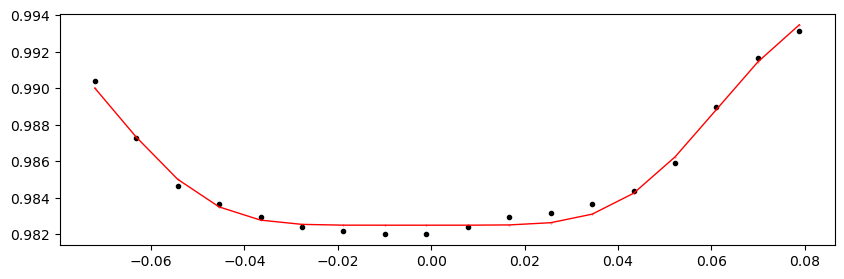

55659.096044636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.40it/s]


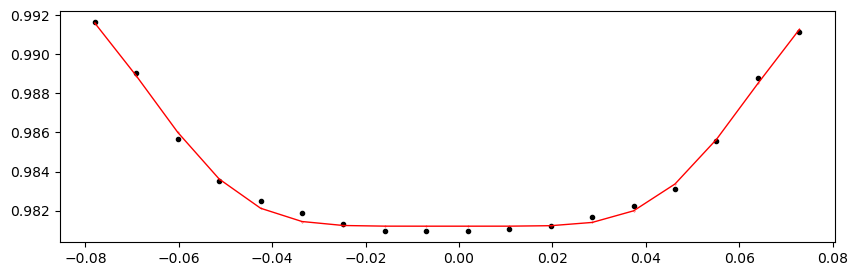

55661.398414636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.36it/s]


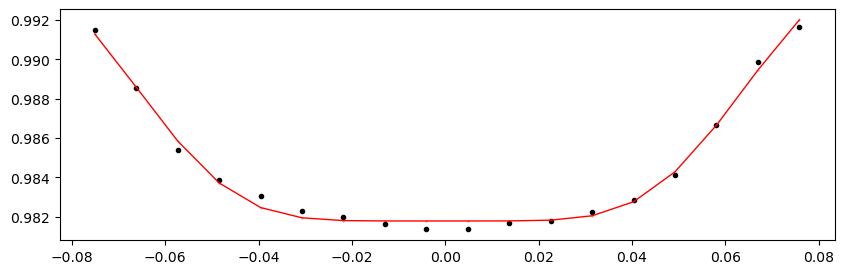

55663.700784636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.40it/s]


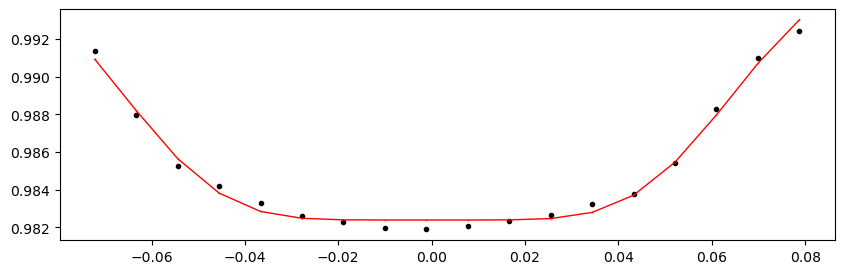

55666.003154636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.57it/s]


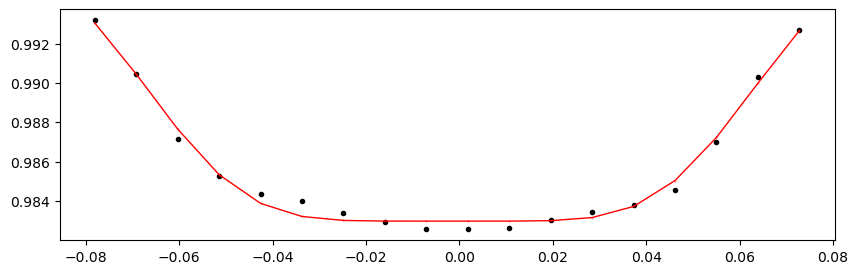

55668.305524636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.04it/s]


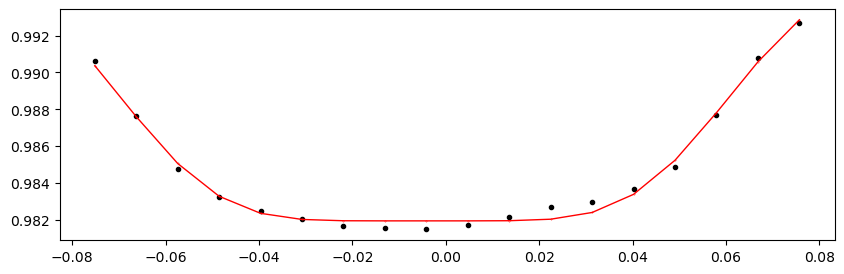

55670.607894636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.49it/s]


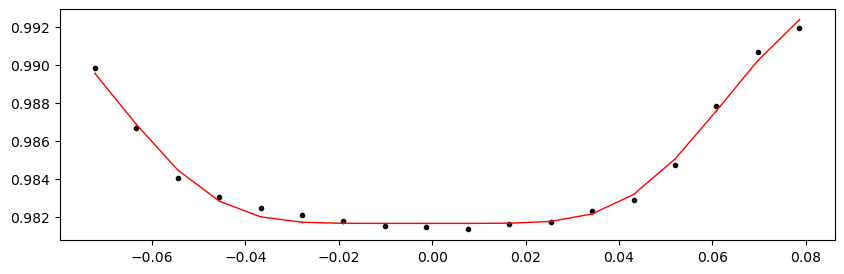

55672.910264636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.73it/s]


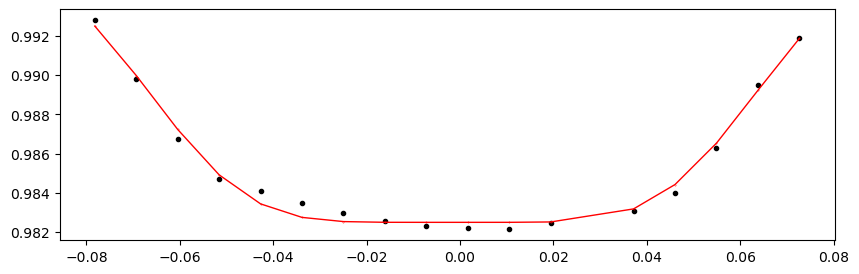

55675.212634636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.99it/s]


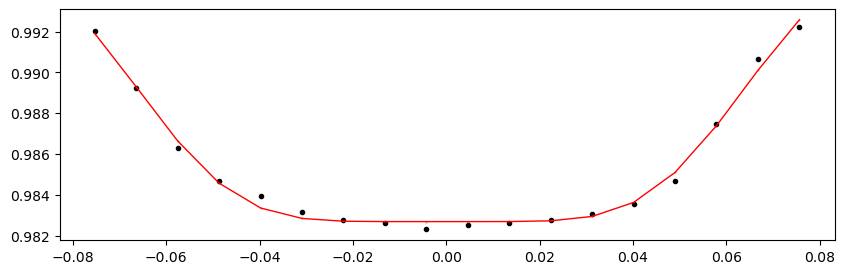

55679.817374636004 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.26it/s]


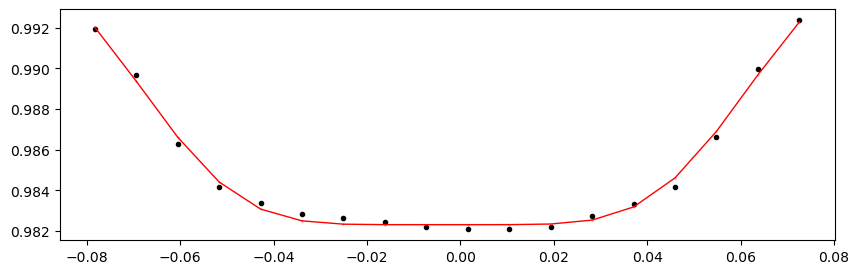

55682.119744636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.19it/s]


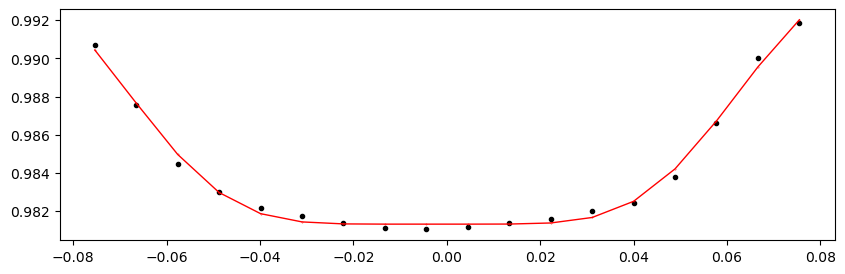

55684.422114636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.04it/s]


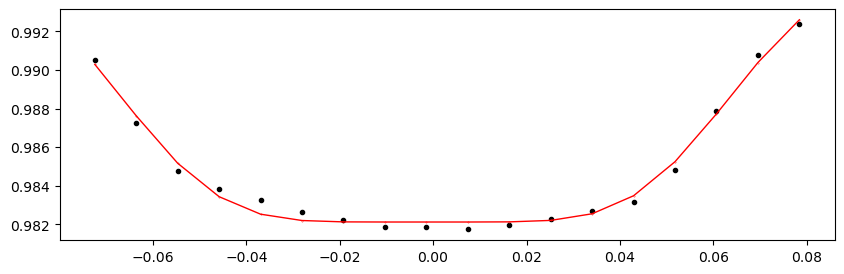

55686.724484636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 434.99it/s]


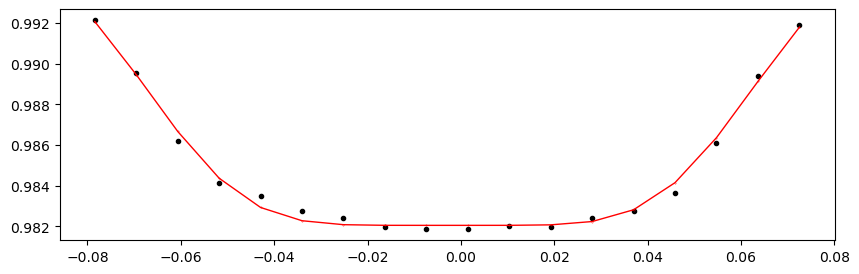

55689.026854636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.56it/s]


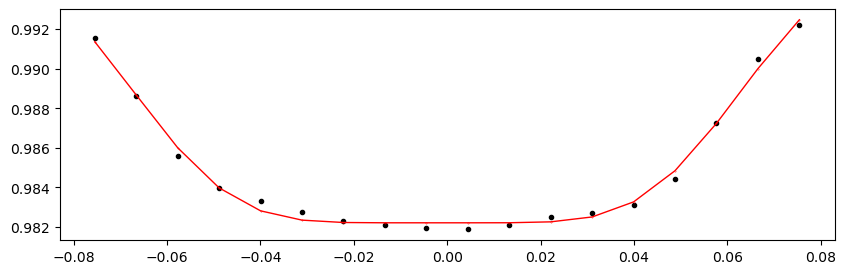

55691.329224636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.23it/s]


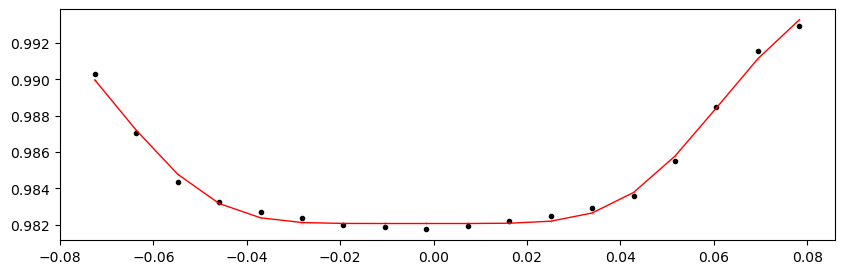

55693.631594636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.51it/s]


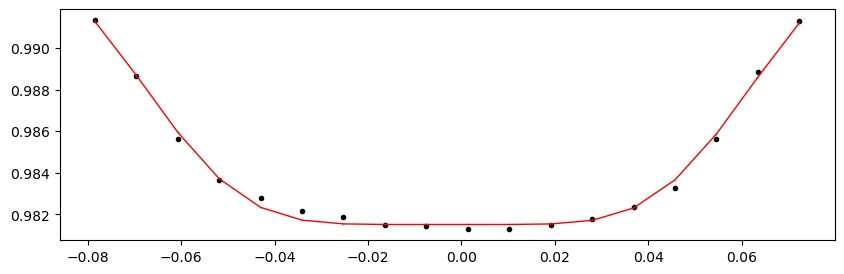

55695.933964636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.00it/s]


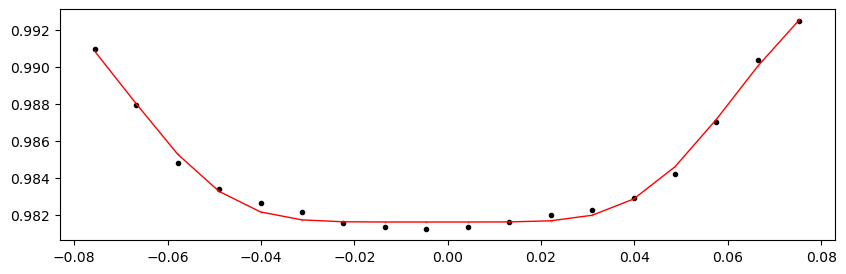

55698.236334636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.63it/s]


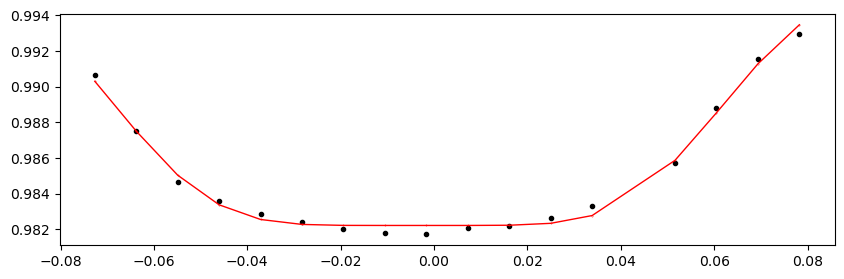

55700.538704636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.44it/s]


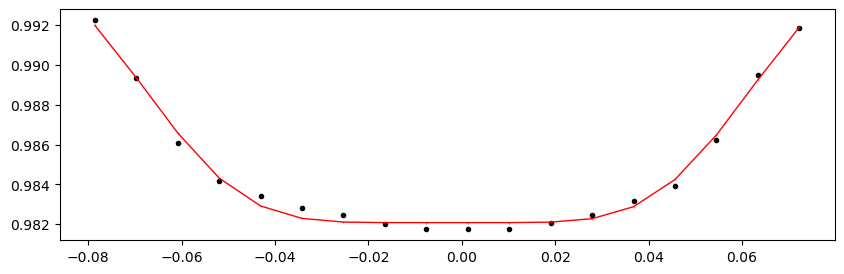

55702.841074636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.50it/s]


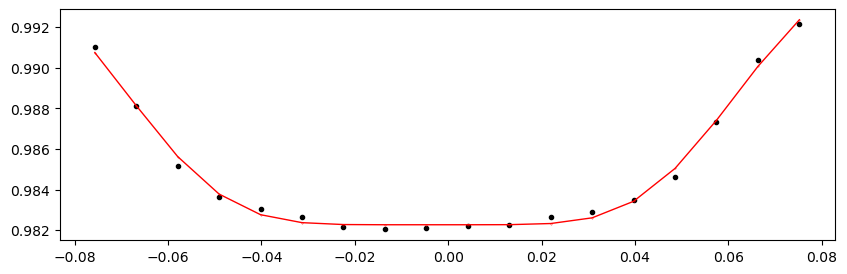

55705.143444636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.42it/s]


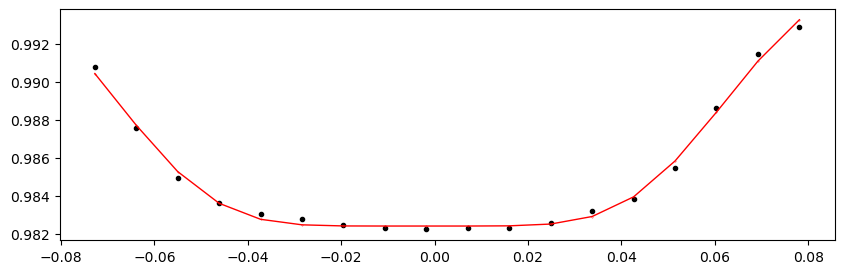

55707.445814636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.75it/s]


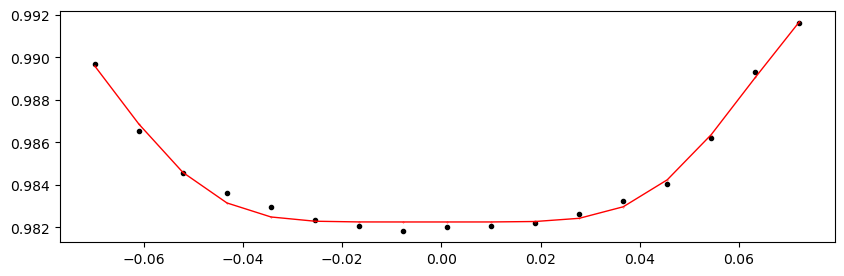

55709.748184636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.79it/s]


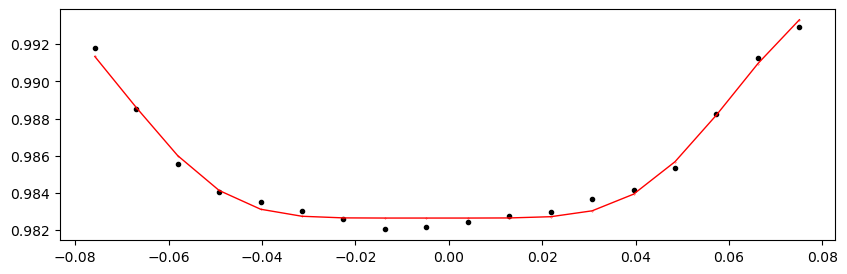

55712.050554636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.42it/s]


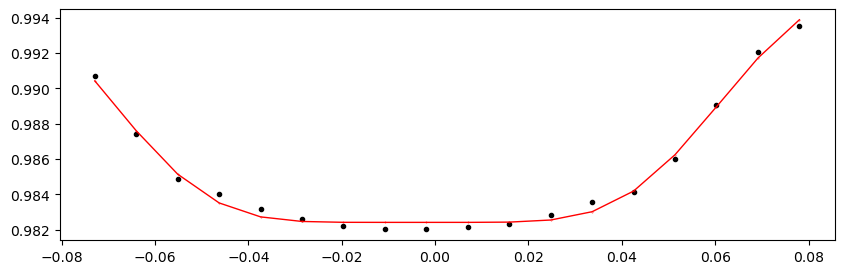

55714.352924636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.72it/s]


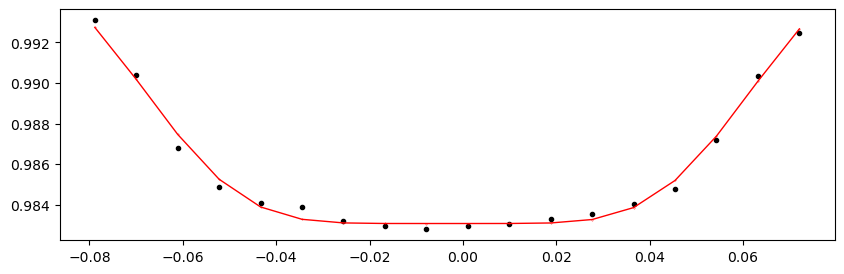

55716.655294636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.35it/s]


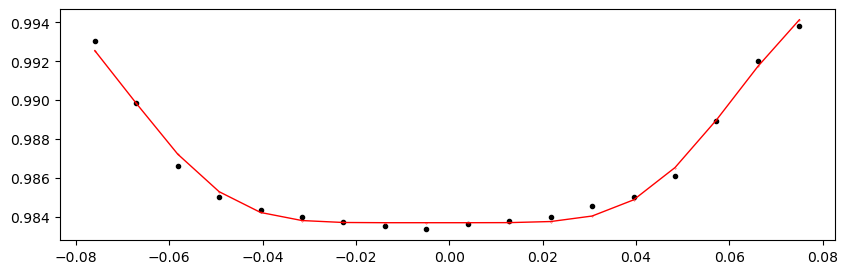

55718.957664636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.38it/s]


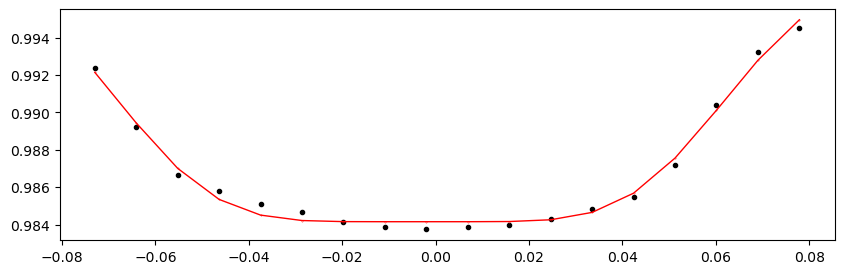

55721.260034636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.27it/s]


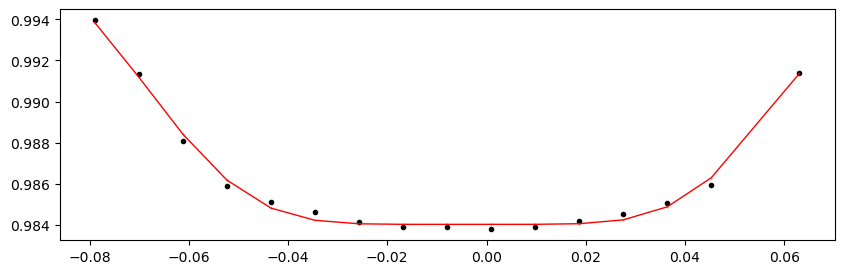

55723.562404636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.38it/s]


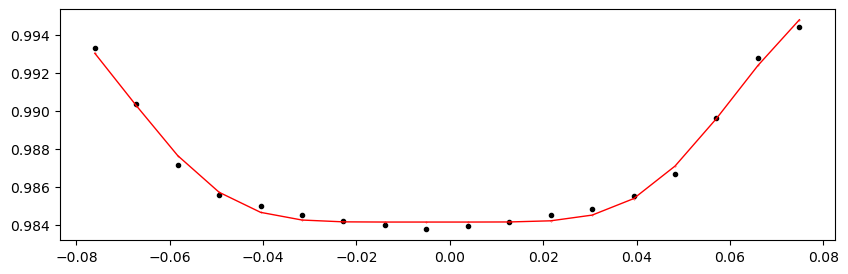

55725.864774636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.02it/s]


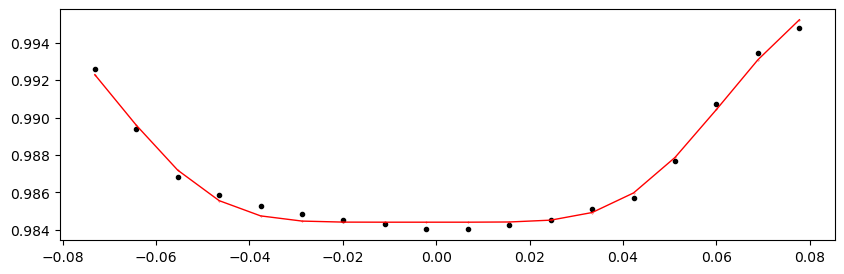

55728.167144636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.05it/s]


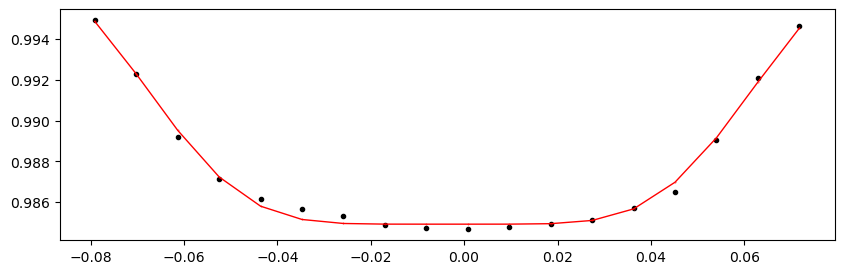

55730.469514636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.50it/s]


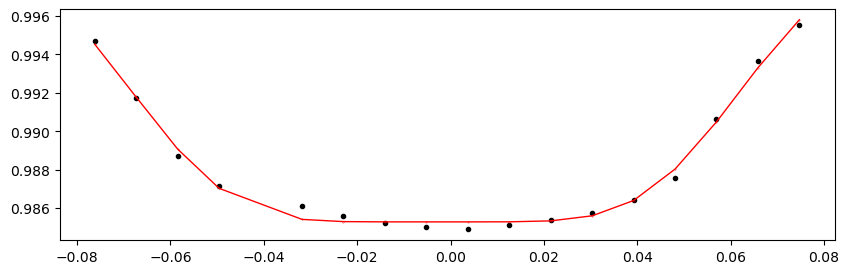

55732.771884636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.91it/s]


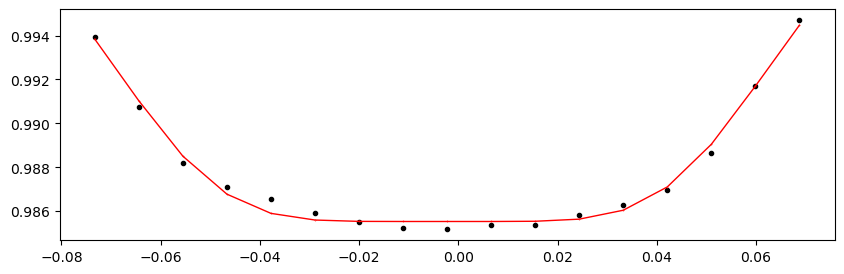

55735.074254636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.29it/s]


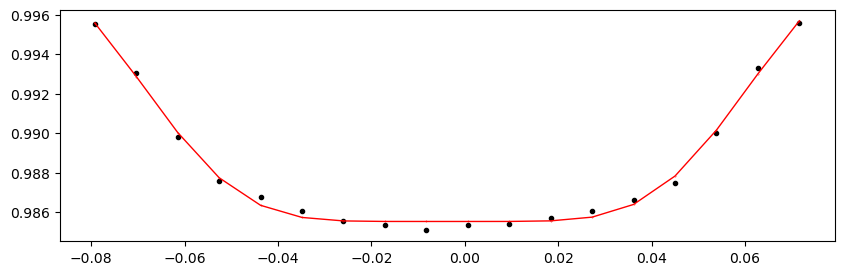

55737.376624636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.87it/s]


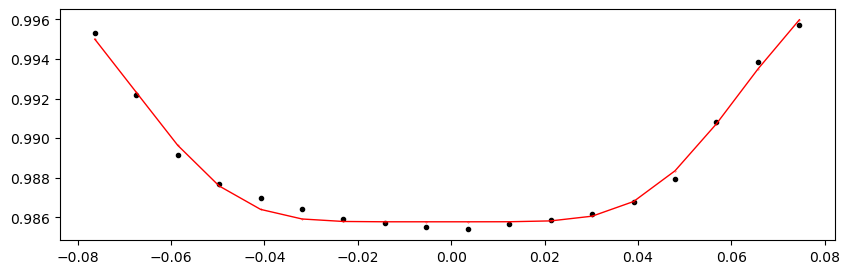

55739.678994636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.79it/s]


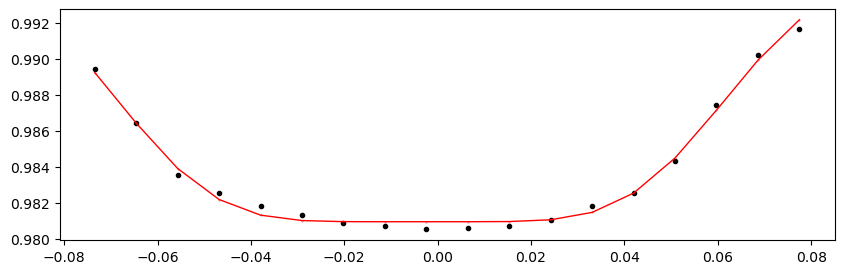

55741.981364636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.73it/s]


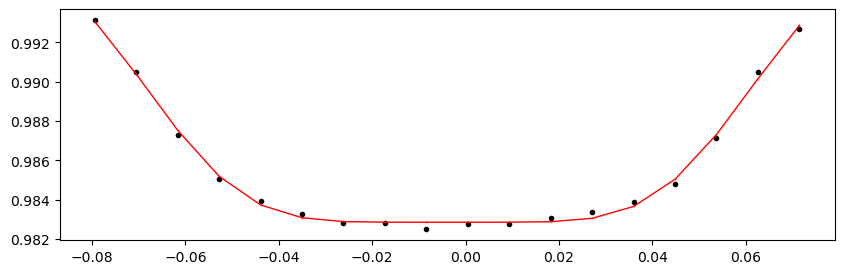

55744.283734636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.28it/s]


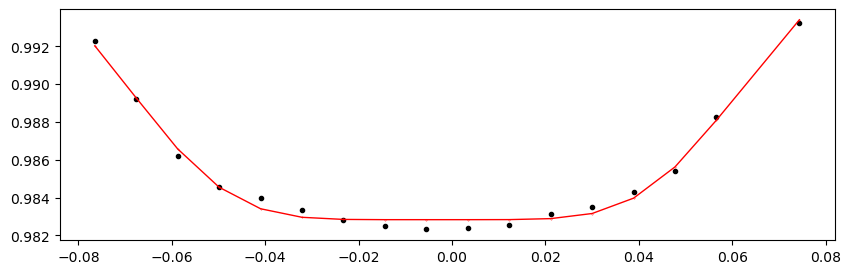

55746.586104636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.60it/s]


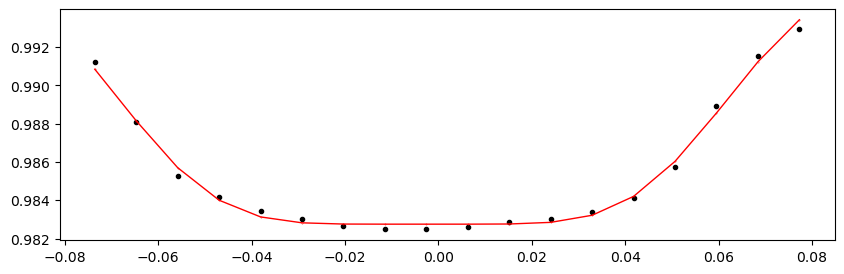

55748.888474636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.75it/s]


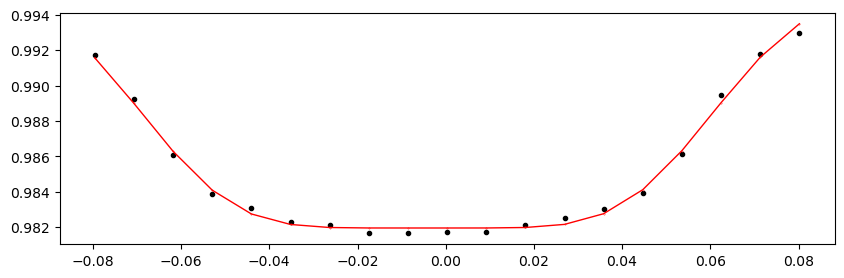

55751.190844636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.68it/s]


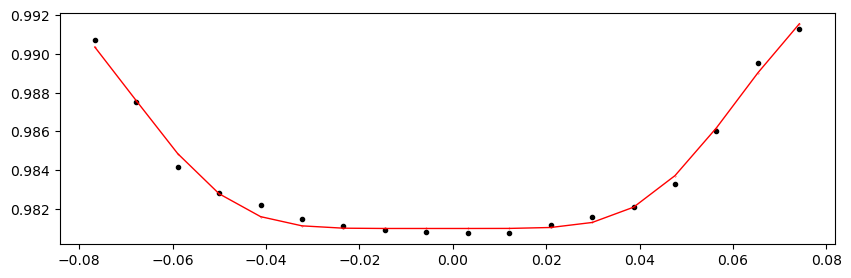

55753.493214636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 433.75it/s]


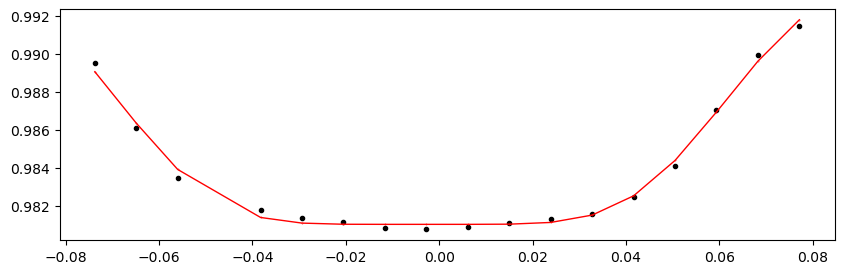

55755.795584636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.45it/s]


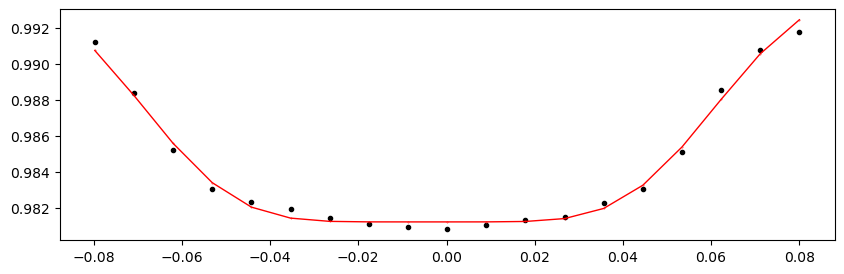

55758.097954636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.05it/s]


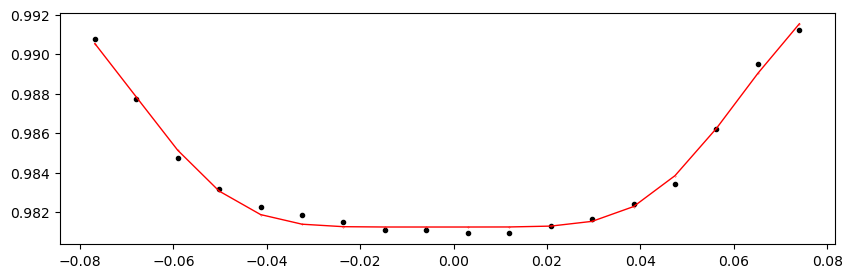

55760.400324636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.50it/s]


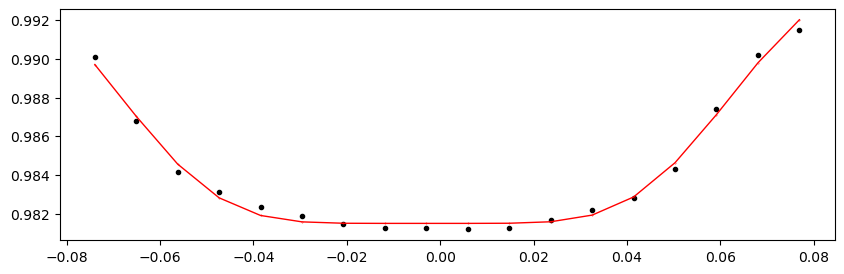

55762.702694636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.95it/s]


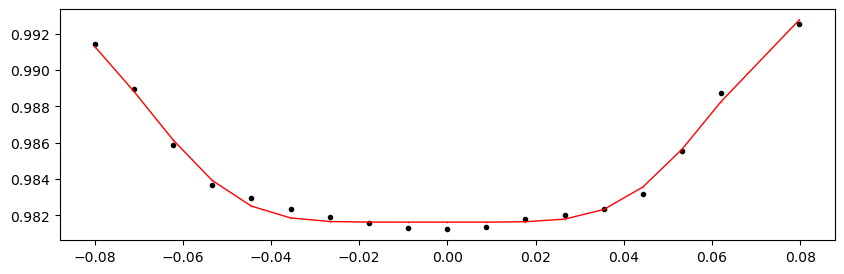

55765.005064636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.85it/s]


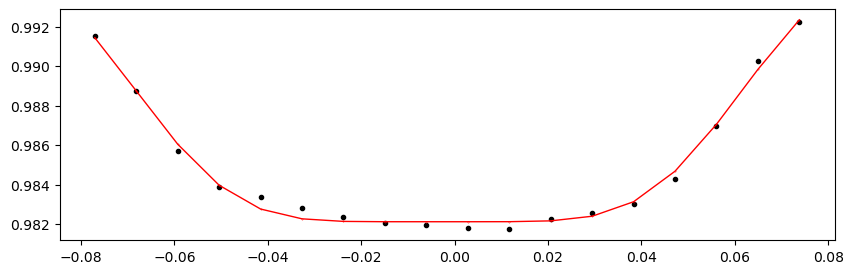

55767.307434636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.55it/s]


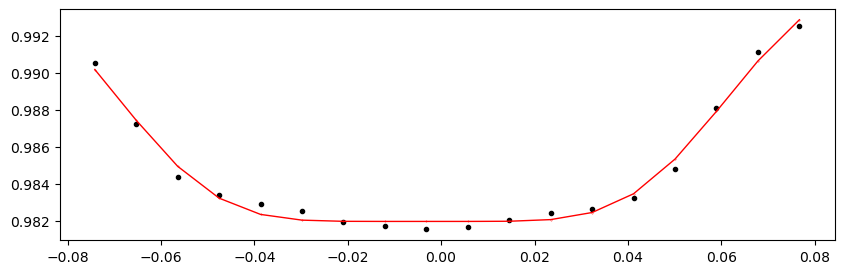

55771.912174636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.92it/s]


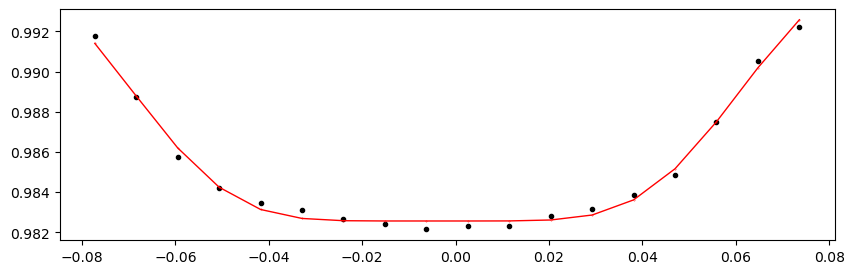

55774.214544636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.36it/s]


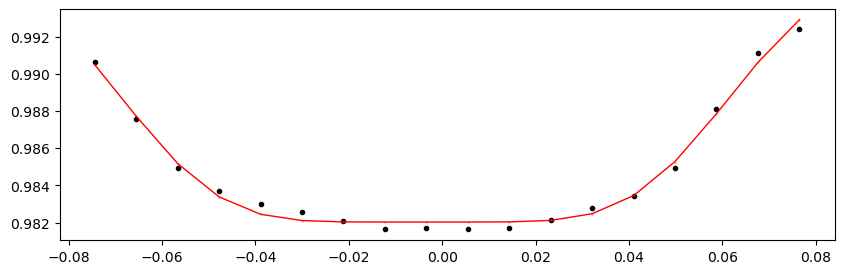

55776.516914636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.27it/s]


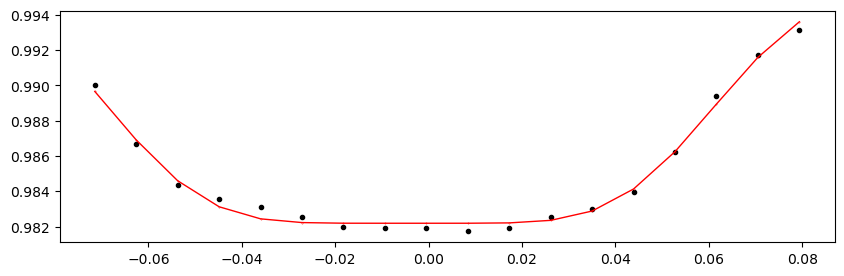

55778.819284636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 432.50it/s]


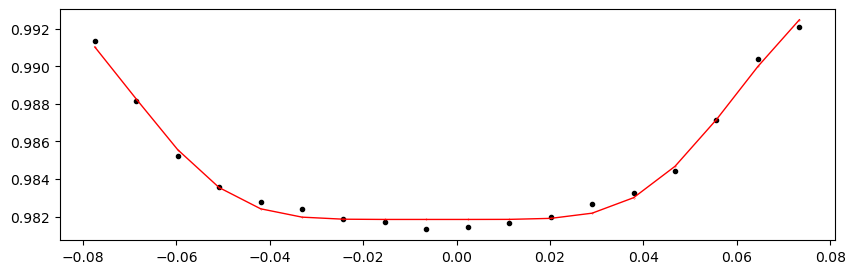

55781.121654636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.55it/s]


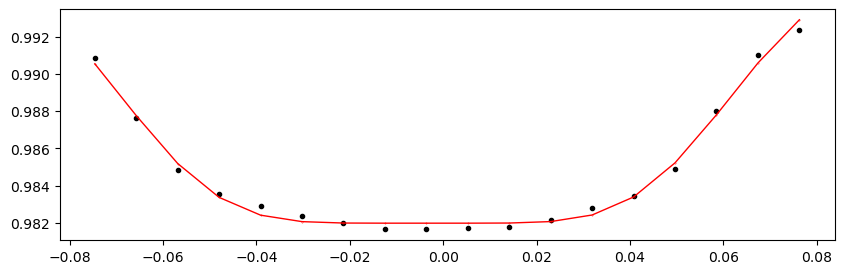

55783.424024636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.32it/s]


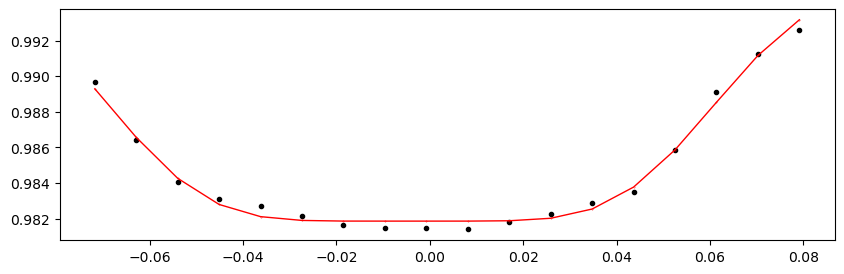

55785.726394636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.62it/s]


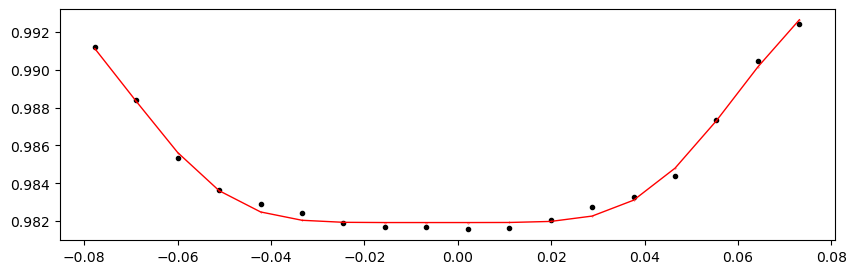

55788.028764636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.88it/s]


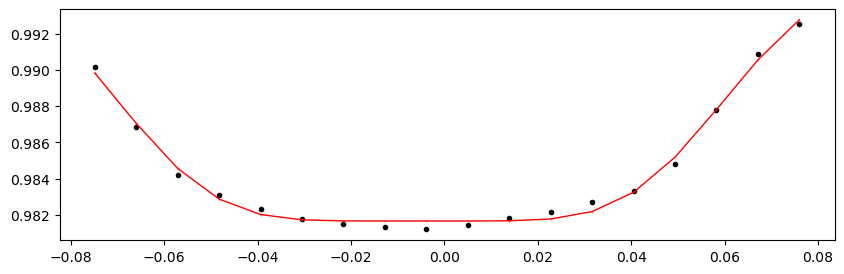

55790.331134636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.20it/s]


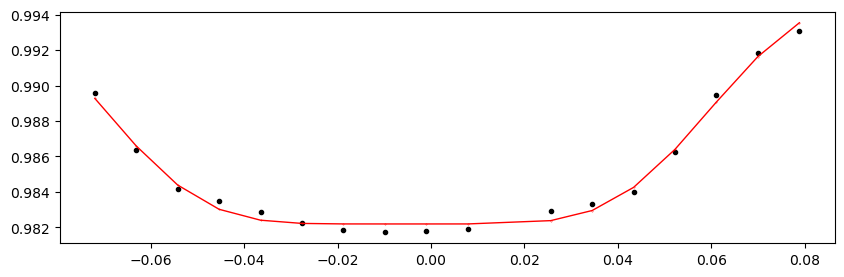

55792.633504636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.59it/s]


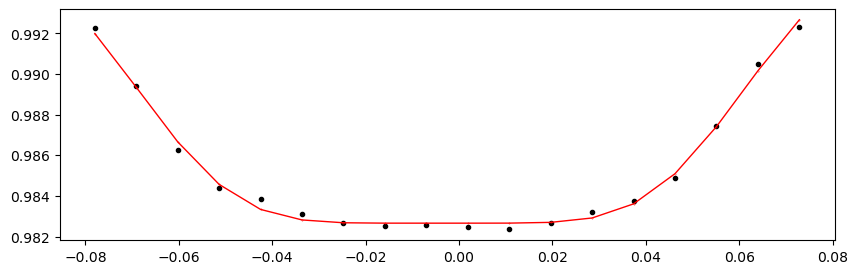

55794.935874636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.92it/s]


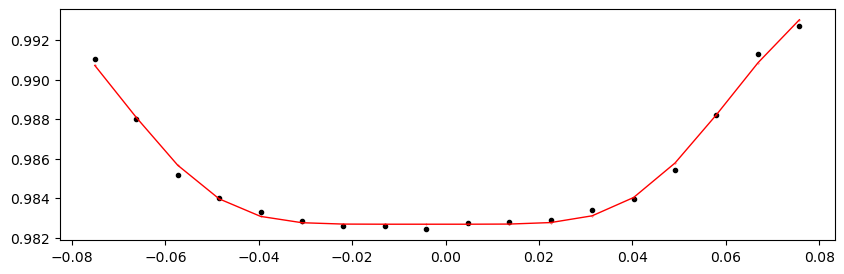

55797.238244636 0.9958208880831946 -0.013381598530201908 -0.30494860531805923


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 436.06it/s]


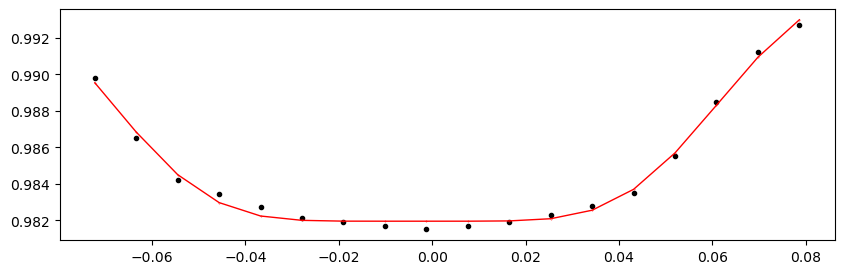

In [20]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=12,  # Kepler 30-min cadene data requires a lower min_number_data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

# -----

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=12,  # Kepler 30-min cadene data requires a lower min_number_data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

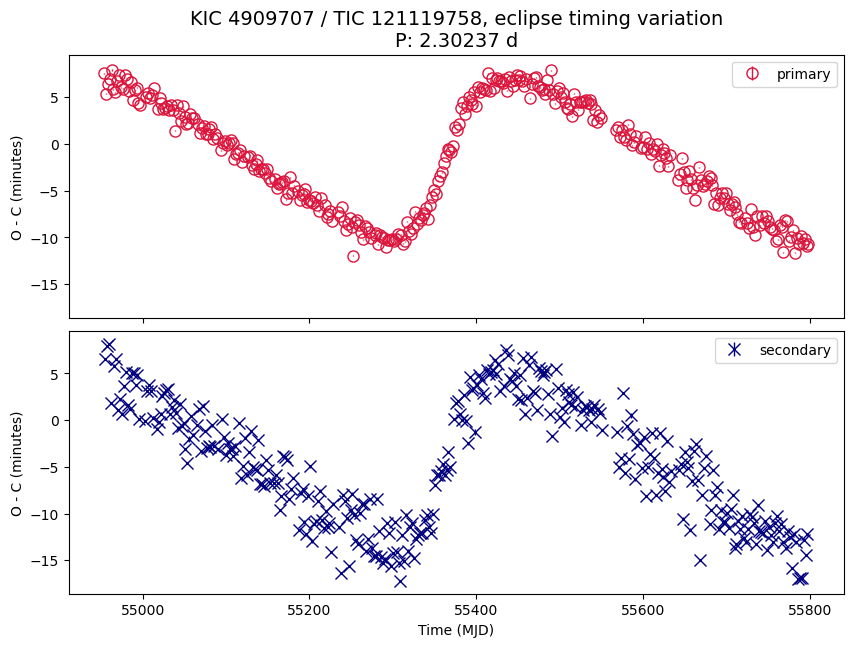

In [30]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

# use the saved result that has been renamed
# outfile_path = "etv_out/tic121119758_etv_primary_Kepler.csv"
# outfile_path_s = "etv_out/tic121119758_etv_secondary_Kepler.csv"

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True, sharey=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60


# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### O-C Plot, Zoom In

In [ ]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] < 1600]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] < 1600]

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


#
# Second chunk
#

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] > 1600]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] > 1600]

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


## make a periodogram 

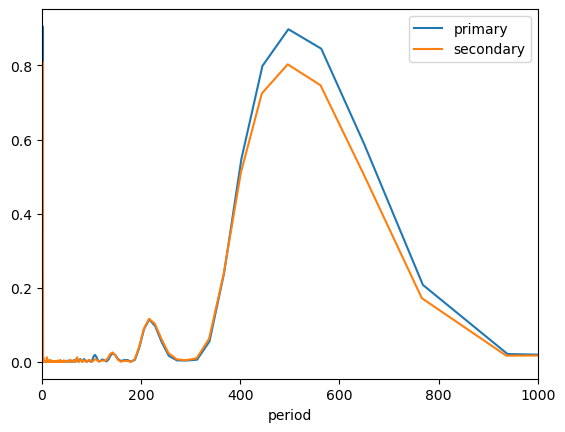

In [32]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 1000)
plt.show()


## Results Summary

In [33]:
# FILL-IN the ETV results / comments
has_etv = "Practice"  # FP, not only it has no ETV, there is no evidence that the orbital period is significantly different from SB period
comments = "Reproducing Kepler ETV in 2013ApJ works"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,121119758
has_etv,Practice
comments,Reproducing Kepler ETV in 2013ApJ works
period,2.30237
depth_pct_p,4.92
depth_pct_s,1.34
epoch_p,54953.413193
epoch_s,54954.570825
num_sectors,18
time_span,846.95



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
121119758,Practice,Reproducing Kepler ETV in 2013ApJ works,2.30237,4.92,1.34,54953.413193,54954.570824636,18,846.95,54953.04,55799.99

